# Plots for buildings with a given type from the SLEB website

In [1]:
f_size = 20 # count, xlabel and ylabel font size
tick_size = 15 # xticks and yticks font size
f_size_big = 40 # for bigger plots
tick_size_big = 30

In [2]:
import pandas as pd
import numpy as np
import string
import seaborn as sns
from matplotlib import pyplot as plt
from cycler import cycler
import plotly.graph_objects as go
import re
from matplotlib.lines import Line2D
import statistics
from matplotlib import rc

In [3]:
# rc("text.latex", preamble=r"\usepackage{cmbright}")
# rc("text", usetex=True)

In [4]:
def flatten(lst):
    new = []
    for i in lst:
        for j in i:
            new.append(j)
    return new

def count_vals(lst):
    """
    creates a dic where {unique_value: count} for a list
    """
    new = {}
    for i in lst:
        if i not in new:
            new[i] = 1
        else:
            new[i] += 1
    return new

In [5]:
data = pd.read_csv("GM_given_types_cleaned_3583.csv")
data["building_use_manual"] = data["building_use_manual"].apply(eval)
data["main_category"] = data["main_category"].apply(eval)
data["main_category_grouped"] = data["main_category_grouped"].apply(eval)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1586 entries, 0 to 1585
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   bca_id                 1586 non-null   object 
 1   building               1586 non-null   object 
 2   award                  1586 non-null   object 
 3   fy                     1586 non-null   object 
 4   gfa                    1586 non-null   object 
 5   address                1586 non-null   object 
 6   postal_code            1586 non-null   object 
 7   district               1586 non-null   object 
 8   developer              1420 non-null   object 
 9   architect              674 non-null    object 
 10  structural_eng         552 non-null    object 
 11  me_eng                 888 non-null    object 
 12  land_cons              385 non-null    object 
 13  qs                     0 non-null      float64
 14  main_contractor        701 non-null    object 
 15  fac_

In [7]:
ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']

main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']

subcats_names = ['leadership', 'urban harmony', 'tropicality', 'energy efficiency', 'renewable energy', 'water', 'materials', 'waste', 'indoor air quality', 'spatial quality', 'smart building operations', 'complementary certifications']

awards_names = ["Green Mark Certified", "Green Mark Gold", "Green Mark Gold Plus", "Green Mark Platinum"]

old_bdg_use_names = ['airport', 'data centre', 'dormitory', 'educational/research', 'government/security', 'hospital/clinic',\
                 'hotel', 'industrial', 'mixed', 'office/commercial', 'recreational/culture', 'residential']

# bdg_use_names = ['Commercial', 'Data Centre', 'District', 'Healthier Workplaces', 'Hotel', 'Industrial', 'Infrastructure',
#  'Institutional', 'Institutional (Healthcare)', 'Institutional (School)', 'Laboratories', 'Mixed Development', 'Office',
#  'Office Interior', 'Others', 'Park','Restaurant', 'Retail', 'Retail (Tenant)', 'Supermarkets']

bdg_use_names = ['Commercial', 'Hotel', 'Industrial', 'Institutional', 'Others', 'Retail']

use_colours = {'Commercial': '#a0e85b','Hotel': '#2e9cbc', 'Industrial': '#b4dbe7','Institutional': '#d77fcb', 'Others': '#0ca82e', 'Retail': '#881c23'}

award_colours = {"Green Mark Certified": '#c1e7ff', 'Green Mark Gold': '#86b0cc', 'Green Mark Gold Plus': '#4c7c9b', 'Green Mark Platinum': '#004c6d'}

cats_colours = {"sustainable management": "#399283", "building energy performance": "#2fddce", "resource stewardship": "#4287f5", "smart & healthy building": "#a0d66f", "advanced green effort":"#6c36a3"}

## Number of certified buildings

In [8]:
def number_of_certified_buildings_bar():
    #Dictionary will store the key as year and value as the number of awards in that year
    awardsEachYear = {}
    buildings = set()

    #Iterating through the row to count the number of awards each year
    for _,row in data.iterrows():    
        if row['building'] in buildings:
            continue
        else:
            buildings.add(row['building'])

        year_in_string = row['fy'][2:]

        if year_in_string.isdigit():

            year_in_integer = int(year_in_string) + 2000

            if year_in_integer in awardsEachYear:
                awardsEachYear[year_in_integer] += 1
            else:
                awardsEachYear[year_in_integer] = 1

    awardsEachYear = list(awardsEachYear.items())
    awardsEachYear.sort(key=lambda x:x[0])

    #Plotting the graph
    years = [i[0] for i in awardsEachYear]
    awards = [i[1] for i in awardsEachYear]

    # the label locations
    x = np.arange(len(years))
    # the width of the bars  
    width = 0.5  

    fig, ax = plt.subplots(figsize=(10,10))
    rects1 = ax.bar(x, awards, width)

    plt.xlabel("Years", fontsize=f_size)
    plt.ylabel("Number of certified buildings", fontsize=f_size)
    # plt.title("Number of new buildings certified each year")

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xticks(x)
    ax.set_xticklabels(years)
    # ax.bar_label(rects1, padding=3)



    fig.tight_layout()
    plt.show()

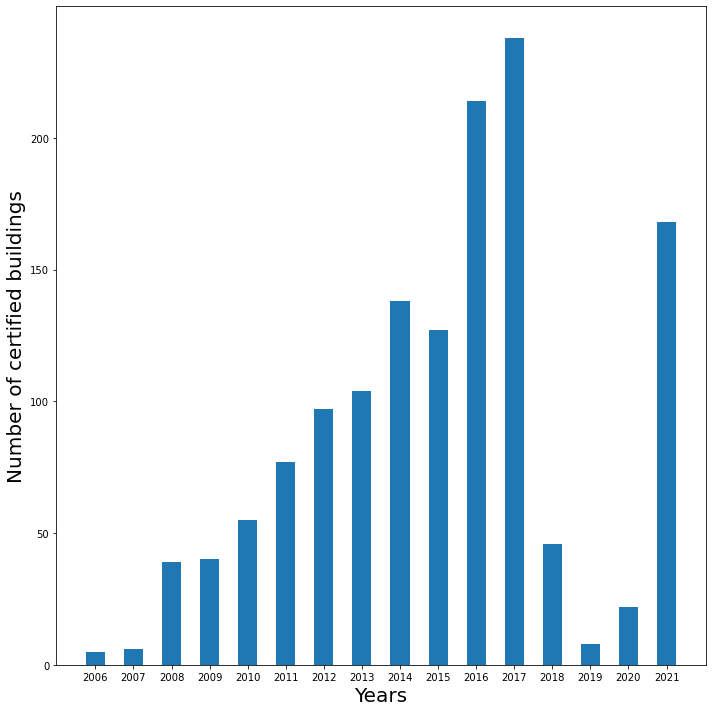

In [9]:
number_of_certified_buildings_bar()

In [10]:
def number_of_certified_buildings_line():
    #Dictionary will store the key as year and value as the number of awards in that year
    awardsEachYear = {}
    buildings = set()

    #Iterating through the row to count the number of awards each year
    for _,row in data.iterrows():    
        if row['building'] in buildings:
            continue
        else:
            buildings.add(row['building'])

        year_in_string = row['fy'][2:]

        if year_in_string.isdigit():

            year_in_integer = int(year_in_string) + 2000

            if year_in_integer in awardsEachYear:
                awardsEachYear[year_in_integer] += 1
            else:
                awardsEachYear[year_in_integer] = 1

    awardsEachYear = list(awardsEachYear.items())
    awardsEachYear.sort(key=lambda x:x[0])

    #Plotting the graph
    years = [i[0] for i in awardsEachYear]
    awards = [i[1] for i in awardsEachYear]

    # the label locations
    x = np.arange(len(years))
    # the width of the bars  
    width = 0.5  

    fig, ax = plt.subplots(figsize=(10,10))
    rects1 = ax.plot(x, awards)

    plt.xlabel("Years", fontsize=f_size)
    plt.ylabel("Number of certified buildings", fontsize=f_size)
    # plt.title("Number of new buildings certified each year")

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xticks(x)
    ax.set_xticklabels(years)
    # ax.bar_label(rects1, padding=3)



    fig.tight_layout()
    plt.show()

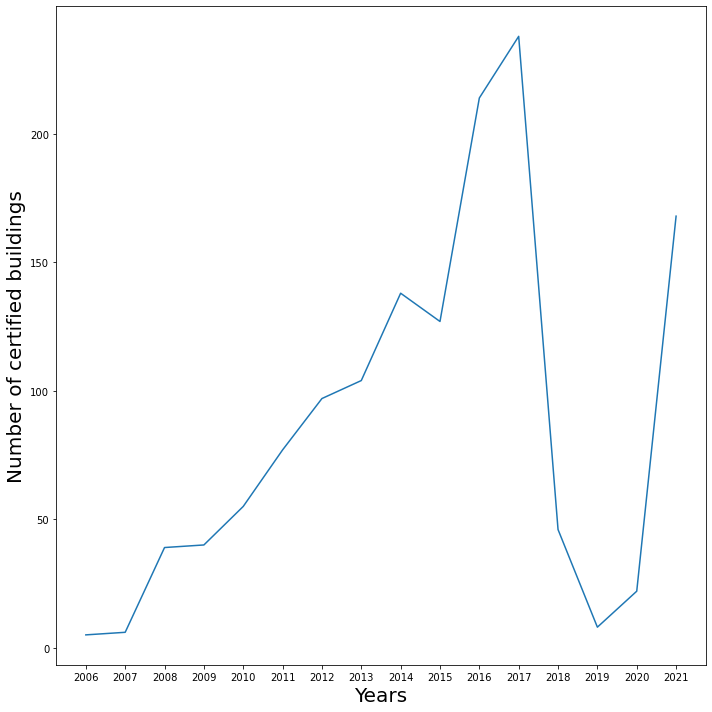

In [11]:
number_of_certified_buildings_line()

## Grouped by rating (tbc)

In [12]:
gold_awards = ["Green Mark Gold", "Green Mark Gold (Positive Energy)"]
gold_plus_awards = ["Green Mark Gold Plus", "Green Mark Gold Plus (Zero Energy)", "Green Mark Gold Plus (Super Low Energy)"]
platinum_awards = ["Green Mark Platinum", "Green Mark Platinum (Super Low Energy)", "Green Mark Platinum (Zero Energy)", "Green Mark Platinum (Positive Energy)"]

In [13]:
years = sorted(data["fy"].unique())

In [14]:
def award_level(award_name):
    '''
    To take into account the sub-ratings and classify them accordingly
    '''
    gold_awards = ["Green Mark Gold", "Green Mark Gold (Positive Energy)"]
    gold_plus_awards = ["Green Mark Gold Plus", "Green Mark Gold Plus (Zero Energy)", "Green Mark Gold Plus (Super Low Energy)"]
    platinum_awards = ["Green Mark Platinum", "Green Mark Platinum (Super Low Energy)", "Green Mark Platinum (Zero Energy)", "Green Mark Platinum (Positive Energy)"]
    if award_name in gold_awards:
        return "Green Mark Gold"
    elif award_name in gold_plus_awards:
        return "Green Mark Gold Plus"
    elif award_name in platinum_awards:
        return "Green Mark Platinum"
    else:
        return award_name
    

Number of buildings grouped by rating


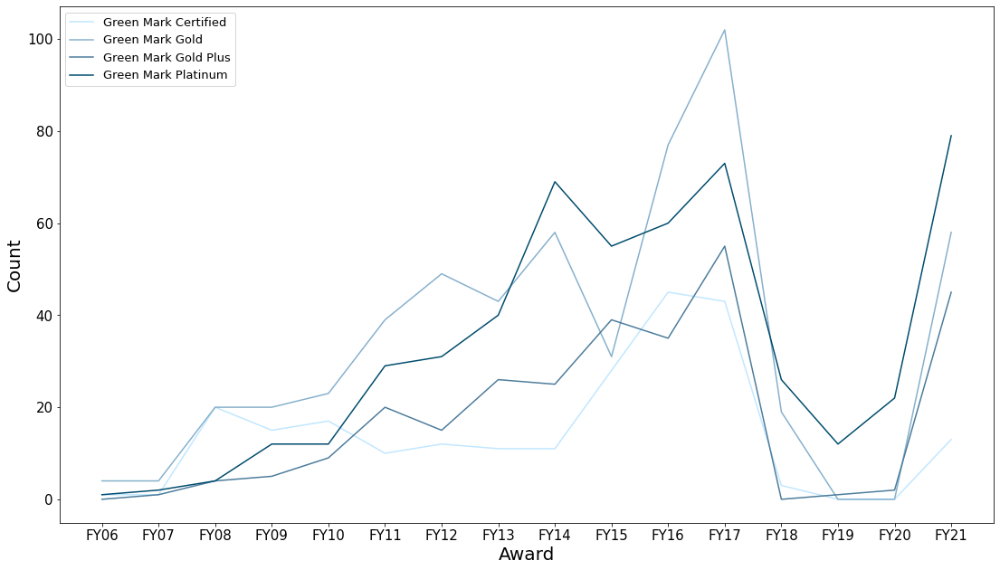

In [15]:
gold_awards = ["Green Mark Gold", "Green Mark Gold (Positive Energy)"]
gold_plus_awards = ["Green Mark Gold Plus", "Green Mark Gold Plus (Zero Energy)", "Green Mark Gold Plus (Super Low Energy)"]
platinum_awards = ["Green Mark Platinum", "Green Mark Platinum (Super Low Energy)", "Green Mark Platinum (Zero Energy)", "Green Mark Platinum (Positive Energy)"]

def grouped_by_rating_line():
    dic = {
 'FY06': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY07': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY08': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY09': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY10': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY11': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY12': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY13': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY14': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY15': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY16': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY17': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY18': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY19': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY20': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY21': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0}}

    for _,row in data.iterrows():
        award = award_level(row["award"])
        dic[row["fy"]][award] += 1

    fig, ax = plt.subplots()

    fig.set_size_inches(18.5, 10.5)
    
    for a in awards_names:
        y_vals = []
        for y in years:
            y_vals.append(dic[y][a])
        ax.plot(years, y_vals, label=a, color=award_colours[a])
            

    plt.xlabel("Award", fontsize=20)

    plt.ylabel("Count", fontsize=20)

    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

#     ax.set_title('Number of buildings grouped by rating', fontsize=25)
    print("Number of buildings grouped by rating")
    ax.legend(loc="upper left", fontsize=13)
    
grouped_by_rating_line()

Number of buildings grouped by rating


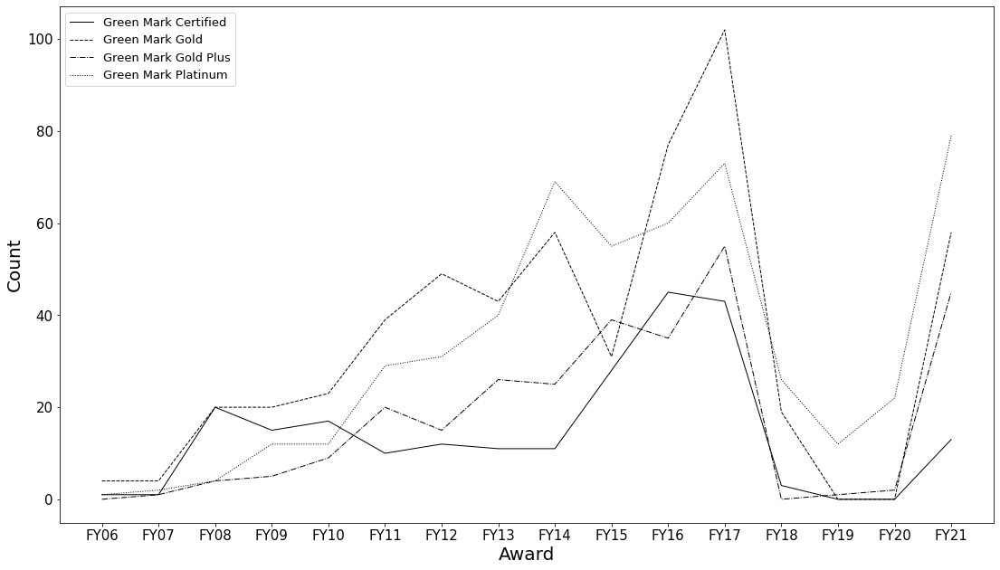

In [16]:
def grouped_by_rating_line_2():
    dic = {
 'FY06': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY07': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY08': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY09': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY10': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY11': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY12': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY13': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY14': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY15': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY16': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY17': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY18': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY19': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY20': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0},
 'FY21': {'Green Mark Certified': 0,
  'Green Mark Gold': 0,
  'Green Mark Gold Plus': 0,
  'Green Mark Platinum': 0}}

    for _,row in data.iterrows():
        award = award_level(row["award"])
        dic[row["fy"]][award] += 1

    fig, ax = plt.subplots()

    fig.set_size_inches(18.5, 10.5)
    
    styles = ['-', '--', '-.', ':']
    i = 0
    width = 1
    for a in awards_names:
        y_vals = []
        for y in years:
            y_vals.append(dic[y][a])
        ax.plot(years, y_vals, ls=styles[i], lw=width, label=a, color='black')
        i += 1
            

    plt.xlabel("Award", fontsize=f_size)

    plt.ylabel("Count", fontsize=f_size)

    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

#     ax.set_title('Number of buildings grouped by rating', fontsize=25)
    print("Number of buildings grouped by rating")
    ax.legend(loc="upper left", fontsize=13)
    
grouped_by_rating_line_2()

Number of Buildings by GM Rating Over Time


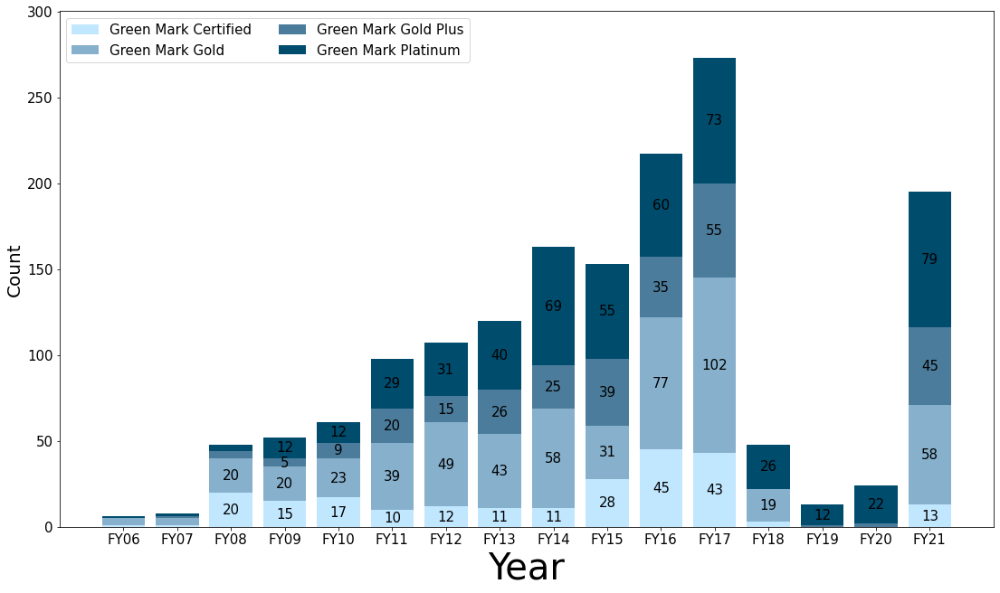

In [17]:
def grouped_by_rating_bar():
    dic_awards = {"Green Mark Certified": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "Green Mark Gold": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "Green Mark Gold Plus": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "Green Mark Platinum": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                    }
    
    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    interested_data = data
    
    for _,row in interested_data.iterrows():
        year = row["fy"]
        award = award_level(row['award'])
        dic_awards[award][year] += 1

    dic_awards_short = {}
    for y in dic_awards:
        dic_awards_short[y] = list(dic_awards[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)

    print(f"Number of Buildings by GM Rating Over Time")
    plt.xlabel("Year", fontsize=f_size_big)
    plt.ylabel("Count", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    
    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_awards_short.values()), axis=0))
    n = 0
    
    y_lim = max(total_each_year)*1.1
    plt.ylim(top=y_lim)

    for y in dic_awards_short:
        y_vals = dic_awards_short[y]
#         y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
#         y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        plt.bar(ay_names, y_vals, bottom=bottom, label=awards_names[n], color=award_colours[y])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals
            if v == 0:
                continue
            elif y_vals[i] >= 5:
                gap = y_vals[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals[i])}", fontsize=15, ha="center", va="center")
                # plot text size is smaller than f_size at 15

    plt.legend(loc='upper left', ncol=n//2, fontsize=tick_size)

grouped_by_rating_bar()

Number of Buildings by GM Rating Over Time


<ipython-input-18-47dfe19d8f6c>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=90)


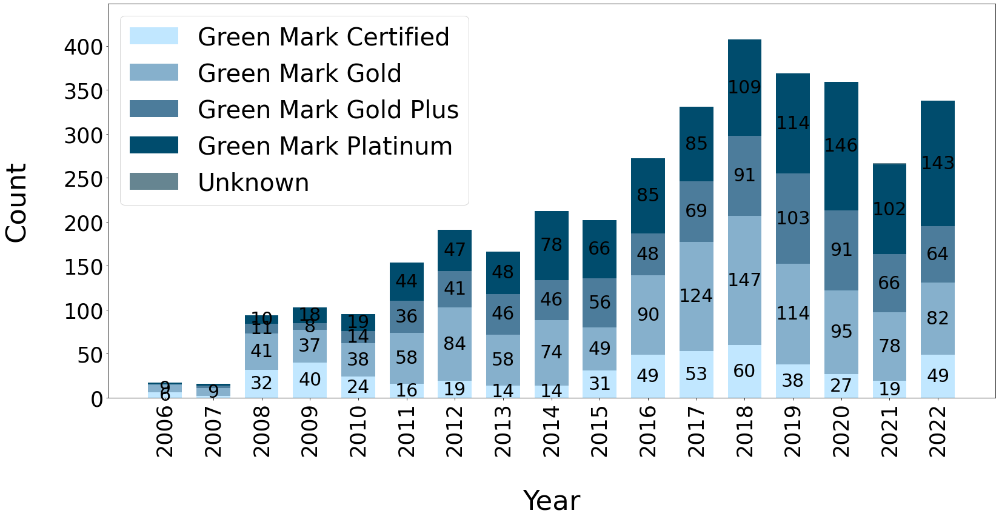

In [18]:
def grouped_by_rating_bar_raw():
    dic_awards = {"Green Mark Certified": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0, "FY22": 0},
                 "Green Mark Gold": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0, "FY22": 0},
                 "Green Mark Gold Plus": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0, "FY22": 0},
                 "Green Mark Platinum": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0, "FY22": 0},
                  "Unknown": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0, "FY22": 0}
                    }
    
    
    awards_names = ["Green Mark Certified", "Green Mark Gold", "Green Mark Gold Plus", "Green Mark Platinum", "Unknown"]
    award_colours = {"Green Mark Certified": '#c1e7ff', 'Green Mark Gold': '#86b0cc', 'Green Mark Gold Plus': '#4c7c9b', 'Green Mark Platinum': '#004c6d', 'Unknown': '#668591'}
    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21', 'FY22']
    
    interested_data = pd.read_csv("GM_new_types_3583.csv")
    
    for _,row in interested_data.iterrows():
        year = row["fy"]
        award = award_level(row['award'])
        if year in ay_names and award in dic_awards.keys():
            dic_awards[award][year] += 1
        elif award == '-':
            dic_awards["Unknown"][year] += 1

    dic_awards_short = {}
    for y in dic_awards:
        dic_awards_short[y] = list(dic_awards[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(23, 12)

    print(f"Number of Buildings by GM Rating Over Time")
    plt.xlabel("\nYear", fontsize=45)
    plt.ylabel("Count\n", fontsize=45)
    labels=['2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013','2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']
    ax.set_xticklabels(labels, rotation=90)
    plt.xticks(fontsize=35)
    plt.yticks(fontsize=35)
    
    
    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_awards_short.values()), axis=0))
    n = 0
    
    y_lim = max(total_each_year)*1.1
    plt.ylim(top=y_lim)

    for y in dic_awards_short:
        y_vals = dic_awards_short[y]
#         y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
#         y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        plt.bar(ay_names, y_vals, bottom=bottom, label=awards_names[n], color=award_colours[y], width=0.7)
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals
            if v == 0:
                continue
            elif y_vals[i] >= 5:
                gap = y_vals[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals[i])}", fontsize=30, ha="center", va="center")

    plt.legend(loc='upper left', ncol=n//3, fontsize=40)
    
    plt.tight_layout()
    
    plt.savefig('no_of_bdgs_by_rating_over_time.pdf')  

grouped_by_rating_bar_raw()

<AxesSubplot:xlabel='fy', ylabel='count'>

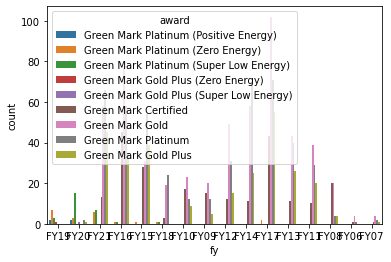

In [19]:
sns.countplot(data=data, x=data["fy"], hue="award")

# Plot for recertified buildings

In [20]:
"""
create a dict where key is the building name and value is a list of strings of the certifications
bdg_info will be used later when finding new vs existing
"""
bdg_info = {}
for i in data.index:
    bdg = data.at[i, "building"]
    if bdg not in bdg_info:
        bdg_info[bdg] = []
    bdg_info[bdg].append([data.at[i, "fy"], data.at[i, "award"]])
for k,v in bdg_info.items():
    bdg_info[k] = sorted(v)

# filter out those with only 1 award to find buildings with recertifications only
bdg_recerts = {}
all_recerts = {}
for k,v in bdg_info.items():
    if len(v) > 1:
        bdg_recerts[k] = v[-2:] # last two certifications
        all_recerts[k] = v # all certifications

In [21]:
bdg_info

{'Samwoh Smart Hub': [['FY19', 'Green Mark Platinum (Positive Energy)'],
  ['FY19', 'Green Mark Platinum (Positive Energy)']],
 'Choa Chu Kang Columbarium': [['FY20',
   'Green Mark Platinum (Positive Energy)'],
  ['FY20', 'Green Mark Platinum (Positive Energy)']],
 'NUS Frontier (Re-Certification)': [['FY21',
   'Green Mark Platinum (Zero Energy)']],
 'Administration Building': [['FY16', 'Green Mark Platinum (Zero Energy)'],
  ['FY20', 'Green Mark Platinum (Zero Energy)']],
 'Block N1.1': [['FY20', 'Green Mark Platinum (Zero Energy)']],
 'SMU-X A-South 2': [['FY19', 'Green Mark Platinum (Zero Energy)'],
  ['FY19', 'Green Mark Platinum (Zero Energy)']],
 'Wee Kim Wee School of Communication and Information': [['FY19',
   'Green Mark Platinum (Zero Energy)'],
  ['FY19', 'Green Mark Platinum (Zero Energy)']],
 'International French Shool (Singapore) New Kindergarten Buildings': [['FY21',
   'Green Mark Platinum (Zero Energy)'],
  ['FY21', 'Green Mark Platinum (Zero Energy)']],
 'NTU Acad

In [22]:
"""
These are buildings with duplicate entries in their names (i.e. they have recertification)
There are 687 of these entries
This includes all recertification cycles
"""
data[data.duplicated(subset="building", keep=False)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359 entries, 0 to 1582
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   bca_id                 359 non-null    object 
 1   building               359 non-null    object 
 2   award                  359 non-null    object 
 3   fy                     359 non-null    object 
 4   gfa                    359 non-null    object 
 5   address                359 non-null    object 
 6   postal_code            359 non-null    object 
 7   district               359 non-null    object 
 8   developer              300 non-null    object 
 9   architect              105 non-null    object 
 10  structural_eng         82 non-null     object 
 11  me_eng                 143 non-null    object 
 12  land_cons              71 non-null     object 
 13  qs                     0 non-null      float64
 14  main_contractor        113 non-null    object 
 15  fac_m

In [23]:
recertified_df = data[data.duplicated(subset="building", keep=False)].sort_values(by=["building", "fy"])

def count_duplicates(lst):
    ans = []
    count = 1
    for i in range(1, len(lst)):
        if lst[i] == lst[i - 1]:
            count += 1
        else:
            ans.append(count)
            count = 1
    ans.append(count)
    return ans

recert_times = count_duplicates(list(recertified_df["building"]))

recertified_df = recertified_df.drop_duplicates(subset=["building"], keep="last")

In [24]:
recertified_bdgs = recertified_df
recertified_bdgs["building"] = recertified_df["building"].unique()
recertified_bdgs["times_certified"] = recert_times
recert_info = list(dict(sorted(all_recerts.items())).values())
recert_info = list(map(lambda x: sorted(x), recert_info))
recertified_bdgs["recert_info"] = recert_info

# with pd.option_context('display.max_colwidth', None):
#   display(recertified_bdgs)

In [25]:
recertified_bdgs.to_csv("recertified_bdg_info_3583.csv", index=False)

In [26]:
bdg_use_all_recertified = count_vals(list(recertified_bdgs["building_use"]))
bdg_use_all_recertified = dict(sorted(bdg_use_all_recertified.items()))

In [27]:
bdg_use_all = count_vals(list(data["building_use"]))
bdg_use_all = dict(sorted(bdg_use_all.items()))

In [28]:
#dict.fromkeys(years, dict.fromkeys(bdg_use_names, 0))

In [29]:
bdg_use_all_yearly = {'FY06': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY07': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY08': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY09': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY10': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY11': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY12': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY13': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY14': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY15': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY16': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY17': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY18': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY19': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY20': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}, 'FY21': {'Commercial': 0,  'Hotel': 0,  'Industrial': 0,  'Institutional': 0,  'Others': 0,  'Retail': 0}}

for _,row in data.iterrows():
    bdg_use_all_yearly[row["fy"]][row["building_use"]] += 1

Percentage of building use over the years (website given)


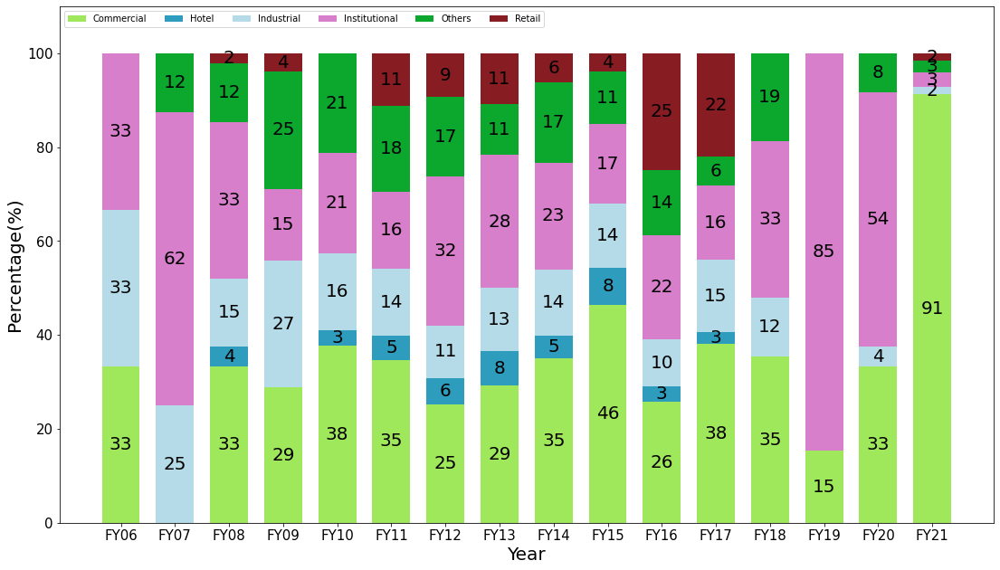

In [30]:
def plot_bdg_uses_wg_yearly():
    data = bdg_use_all_yearly
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of building use over the years (website given)", fontsize=25)
    print("Percentage of building use over the years (website given)")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=110)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]/total*100
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    plt.legend(loc="upper left", ncol=len(x_axis))
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
plot_bdg_uses_wg_yearly()

In [31]:
not_normalised = pd.DataFrame(bdg_use_all_yearly).transpose()

<AxesSubplot:>

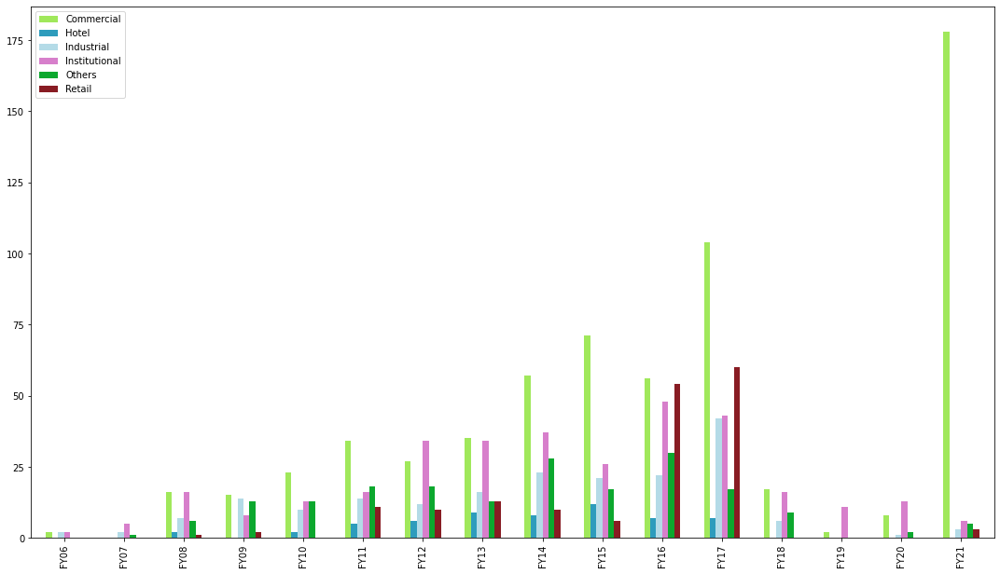

In [32]:
not_normalised.plot(kind="bar", figsize=((18.5, 10.5)), width=0.6,\
              color=use_colours.values())

In [33]:
def count_uses(dic):
    lst = []
    for bdg_name in dic.keys():
        lst.append(list(recertified_bdgs[recertified_bdgs["building"] == bdg_name]["building_use"]))
    dic = count_vals(flatten(lst))
    return dict(sorted(dic.items()))

In [34]:
awards = {"Green Mark Certified": 4, 
"Green Mark Gold": 3,
"Green Mark Gold (Positive Energy)": 3,
"Green Mark Gold Plus": 2,
"Green Mark Gold Plus (Zero Energy)": 2,
"Green Mark Gold Plus (Super Low Energy)": 2,
"Green Mark Platinum": 1,
'Green Mark Platinum (Zero Energy)': 1,
'Green Mark Platinum (Positive Energy)': 1,
'Green Mark Platinum (Super Low Energy)': 1}
# assign a number to each award to get the difference
# when the difference is +ve, the rating goes up and vice versa

In [35]:
def cert_changed(lst):
    """
    takes in a list of 2 lists
    checks if they have a different certification
    returns the rating difference
    """
    certs = list(map(lambda x: x[1], lst))
    diff = awards[certs[0]] - awards[certs[1]]
    return diff

In [36]:
bdg_scores = {}
for bdg, certs in bdg_recerts.items():
    bdg_scores[bdg] = cert_changed(certs)

# scores for each building recertification

In [37]:
rating_increased = dict(filter(lambda x: x[1] > 0, bdg_scores.items()))
rating_decreased = dict(filter(lambda x: x[1] < 0, bdg_scores.items()))
no_change = dict(filter(lambda x: x[1] == 0, bdg_scores.items()))

In [38]:
def add_row(string):
    """
    add row for longer x labels
    """
    new = ""
    for i in string:
        if i == "/":
            new += i
            new += "\n"
        else:
            new += i
    return new

In [39]:
dict(sorted(bdg_use_all.items()))

{'Commercial': 645,
 'Hotel': 58,
 'Industrial': 195,
 'Institutional': 328,
 'Others': 190,
 'Retail': 170}

In [40]:
"""
this is a dictionary of buildings with their past 2 recertification cycles
buildings which have one 1 certification are not included
"""
bdg_recerts
# if the 're certification' suffixes were kept, there would be many bdgs with 1 certification which would be filtered out

{'Samwoh Smart Hub': [['FY19', 'Green Mark Platinum (Positive Energy)'],
  ['FY19', 'Green Mark Platinum (Positive Energy)']],
 'Choa Chu Kang Columbarium': [['FY20',
   'Green Mark Platinum (Positive Energy)'],
  ['FY20', 'Green Mark Platinum (Positive Energy)']],
 'Administration Building': [['FY16', 'Green Mark Platinum (Zero Energy)'],
  ['FY20', 'Green Mark Platinum (Zero Energy)']],
 'SMU-X A-South 2': [['FY19', 'Green Mark Platinum (Zero Energy)'],
  ['FY19', 'Green Mark Platinum (Zero Energy)']],
 'Wee Kim Wee School of Communication and Information': [['FY19',
   'Green Mark Platinum (Zero Energy)'],
  ['FY19', 'Green Mark Platinum (Zero Energy)']],
 'International French Shool (Singapore) New Kindergarten Buildings': [['FY21',
   'Green Mark Platinum (Zero Energy)'],
  ['FY21', 'Green Mark Platinum (Zero Energy)']],
 'Keppel Bay Tower': [['FY10', 'Green Mark Gold'],
  ['FY21', 'Green Mark Platinum (Zero Energy)']],
 'One Raffles Link': [['FY14', 'Green Mark Gold Plus'],
  ['F

In [41]:
"""
There are 157 entries for recertified buildings in their last 2 cycles only

"""
len(bdg_recerts)

157

In [42]:
recertified_bdgs["last_2_rating_change"] = dict(sorted(bdg_scores.items())).values()
recertified_bdgs.to_csv("recertified_bdg_info_3583.csv", index=False)

In [43]:
recertified_bdgs

,bca_id,building,award,fy,gfa,address,postal_code,district,developer,architect,...,green_cons,description,green_features,building_use,building_use_manual,main_category,main_category_grouped,times_certified,recert_info,last_2_rating_change
1253,c58e460c-c428-4621-8e44-49a06bcd83a0,*SCAPE,Green Mark Gold,FY21,13102,"2 Orchard Link, Singapore 237978",237978,9,Scape Co. Ltd,NaN,...,-,*SCAPE is a 5-storey building located in the O...,['Use of energy efficient LED lighting for all...,Commercial,"[office/commercial, educational/research]","[building energy performance, smart & healthy ...","[building energy performance, smart & healthy ...",3,"[[FY10, Green Mark Certified], [FY18, Green Ma...",0
1505,9C4F2C51-C1C7-4495-B888-DFC6E6B881A5,1 Serangoon North,Green Mark Platinum,FY17,24930,"1 Serangoon North Avenue 5, Singapore 554915",554915,19,Singapore Telecommunications Limited,NaN,...,-,1 Serangoon North is an office building locate...,['Estimated energy savings: 807 411kWh/yr2. Ef...,Industrial,"[office/commercial, government/security]","[sustainable management, sustainable managemen...","[sustainable management, building energy perfo...",2,"[[FY14, Green Mark Certified], [FY17, Green Ma...",3
945,9EDF2756-E136-43A9-8961-CA505E53283D,138 Depot Road,Green Mark Gold,FY14,29626,"138 Depot Road, Singapore 109683",109683,4,HSBC Institutional Trust Services (S) Ltd as T...,NaN,...,-,138 Depot Road is a seven-storey high-tech ind...,['Efficient chiller plant system with peak eff...,Industrial,"[industrial, government/security]","[smart & healthy building, resource stewardshi...","[resource stewardship, sustainable management,...",2,"[[FY07, Green Mark Certified], [FY14, Green Ma...",1
1067,0885EEF5-CE12-46BF-AC04-157097764FD9,55 Market Street,Green Mark Gold,FY17,8464,"55 Market Street, Singapore 048941",48941,1,BMT Limited as Trustee for Frasers Commercial ...,NaN,...,-,55 Market Street is a commercial property loca...,['Use of energy efficient lightings (high freq...,Commercial,[office/commercial],"[building energy performance, smart & healthy ...","[building energy performance, smart & healthy ...",2,"[[FY13, Green Mark Gold], [FY17, Green Mark Go...",0
874,B80049B0-45C6-48CB-A077-3348E2068E43,71 Robinson Road,Green Mark Gold,FY13,26035,"71 Robinson Road, Singapore 068895",68895,1,CR - 71 Robinson,NaN,...,-,Built in 2009 71 Robinson Road is a sleek and ...,['Lighting system – All fluorescent lamps in t...,Commercial,[office/commercial],"[smart & healthy building, smart & healthy bui...","[resource stewardship, building energy perform...",2,"[[FY08, Green Mark Gold], [FY13, Green Mark Go...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1187,71B8A8E7-04CD-4214-B8B6-0EA329438FBE,Wilkie Edge,Green Mark Gold,FY17,20442,"8 Wilkie Road, Singapore 228095",228095,9,CapitaLand Commercial Trust,NaN,...,-,Wilkie Edge is a 12-storey integrated developm...,['Use of energy efficient lamps (LEDs with mot...,Commercial,"[recreational/culture, office/commercial]","[sustainable management, building energy perfo...","[sustainable management, building energy perfo...",2,"[[FY12, Green Mark Gold], [FY17, Green Mark Go...",0
469,d70e006a-931b-4a9e-857d-4b3cf67ed66e,Winsland House 1,Green Mark Gold Plus,FY21,21102,3 Killiney Road,239519,9,Winsland Investment Pte Ltd,NaN,...,-,Winsland House I is a finely furnished 10-stor...,['Energy efficient chiller plant with a system...,Commercial,[office/commercial],"[building energy performance, smart & healthy ...","[building energy performance, smart & healthy ...",2,"[[FY17, Green Mark Gold Plus], [FY21, Green Ma...",0
1314,5949d5fd-b095-4148-acca-1968de8d972f,Winsland House II,Green Mark Gold Plus,FY21,10638.44,"163, Penang Rd, Winsland House II Singapore 23...",238463,9,Winmax Investment Ptd Ltd,NaN,...,-,Winsland House II is a commercial property loc...,['Energy efficient chiller plant system of les...,Commercial,[office/commercial],"[sustainable management, smart & heal

## Change in rating

In [44]:
'#e7a1ff', '#d792ef', '#c884e0', '#b875d0', '#a967c1'

('#e7a1ff', '#d792ef', '#c884e0', '#b875d0', '#a967c1')

Change in buildings' GreenMark ratings after recertification


(array([  0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

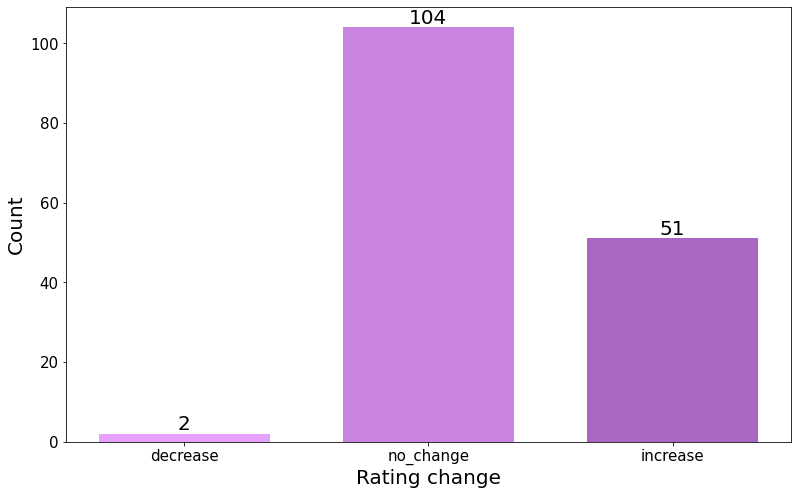

In [45]:
width = 0.7
fig, ax = plt.subplots()
fig.set_size_inches(13, 8)

x_axis = [-1, 0, 1]
y_axis = [len(rating_decreased), len(no_change), len(rating_increased)]

plt.bar(x_axis, y_axis, width=width, color=["#e7a1ff", "#c884e0", "#a967c1"])
# plt.title("Change in buildings' GreenMark ratings after recertification", fontsize=20)
print("Change in buildings' GreenMark ratings after recertification")
plt.xticks(ticks=x_axis, labels=["decrease", "no_change", "increase"])

for i in range(len(x_axis)):
    plt.text(x_axis[i], y_axis[i]+1, y_axis[i], fontdict=dict(fontsize=f_size), ha="center")
    
plt.xlabel("Rating change", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)

plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

In [46]:
rate_increase_counts = {}
for i in rating_increased.values():
    if i not in rate_increase_counts:
        rate_increase_counts[i] = 0
    rate_increase_counts[i] += 1

# dict for number of buildings for each rating increased score

In [47]:
rate_increase_counts 

{2: 22, 1: 27, 3: 2}

In [48]:
rate_decrease_counts = {}
for i in rating_decreased.values():
    if i not in rate_decrease_counts:
        rate_decrease_counts[i] = 0
    rate_decrease_counts[i] += 1

In [49]:
rate_decrease_counts

{-1: 1, -2: 1}

## Rating increased

Change in increase in rating


(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

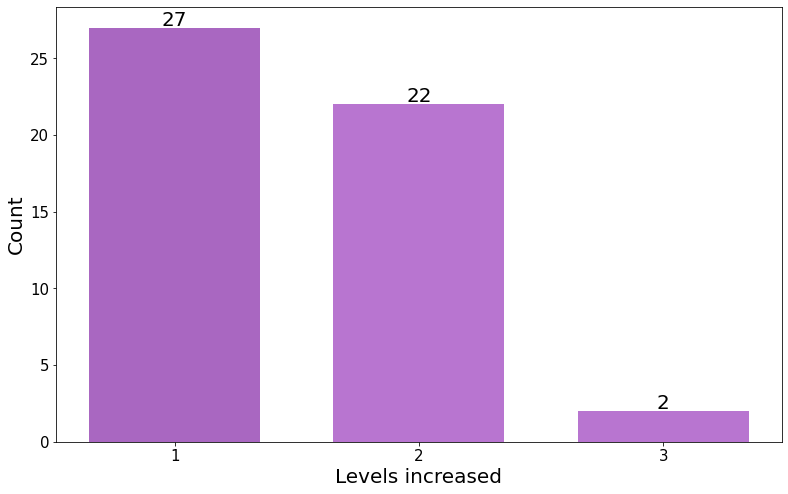

In [50]:
width = 0.7
fig, ax = plt.subplots()
fig.set_size_inches(13, 8)

x_axis = list(rate_increase_counts.keys())
y_axis = list(rate_increase_counts.values())
plt.bar(x_axis, y_axis, width=width, color= ['#b875d0', '#a967c1'])
# plt.title("Change in increase in rating", fontsize=20)
print("Change in increase in rating")
plt.xticks(ticks=x_axis, labels=map(lambda x:str(x), x_axis))

plt.xlabel("Levels increased", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)
for i in range(len(x_axis)):
    plt.text(x_axis[i], y_axis[i]+0.15, y_axis[i], fontdict=dict(fontsize=f_size), ha="center")
    
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

In [51]:
rate_increase = pd.DataFrame(count_uses(rating_increased), index=["rating_increased"])

In [52]:
selected_cols = ['building', 'award', 'green_features', 'developer', 'architect', 'structural_eng', 'me_eng', 'land_cons',\
                 'qs', 'main_contractor', 'fac_mgt', 'esd_cons', 'esco_cons', 'green_cons', 'building_use',\
                 'building_use_manual']

In [53]:
recertified_bdgs[recertified_bdgs["last_2_rating_change"] > 0][selected_cols] # df of the buildings with increased ratings

,building,award,green_features,developer,architect,structural_eng,me_eng,land_cons,qs,main_contractor,fac_mgt,esd_cons,esco_cons,green_cons,building_use,building_use_manual
1505,1 Serangoon North,Green Mark Platinum,['Estimated energy savings: 807 411kWh/yr2. Ef...,Singapore Telecommunications Limited,NaN,NaN,NaN,NaN,NaN,NaN,SMM Pte Ltd,Mark Chia,G-Energy Global Pte Ltd,-,Industrial,"[office/commercial, government/security]"
945,138 Depot Road,Green Mark Gold,['Efficient chiller plant system with peak eff...,HSBC Institutional Trust Services (S) Ltd as T...,NaN,NaN,NaN,NaN,NaN,NaN,Ascendas Services Pte Ltd,-,Ascendas Services Pte Ltd,-,Industrial,"[industrial, government/security]"
855,Alexandra Point,Green Mark Platinum,['Passive design with low-e double glazing day...,FCL Alexandra Point Pte Ltd,NaN,NaN,NaN,NaN,NaN,NaN,Kaer Pte Ltd,-,Kaer Pte Ltd,-,Commercial,"[recreational/culture, office/commercial, gove..."
1524,American Express International Inc.,Green Mark Gold Plus,['Energy efficient air conditioning system and...,AMERICAN EXPRESS INTERNATIONAL INC.,NaN,NaN,NaN,NaN,NaN,NaN,CBRE Pte. Ltd,-,Environmental Market Solutions Inc.,-,Commercial,[office/commercial]
889,BHP Billiton Marketing Asia Pte Ltd,Green Mark Platinum,[' Energy efficient lighting design with a pow...,BHP Billiton Marketing Asia Pte Ltd,NaN,NaN,Arup Singapore Pte Ltd,NaN,NaN,NaN,Facility Link & DLE J.V.,Colliers International (Singapore) Pte Ltd,Ai Associates Pte Ltd,Ngai Chin Construction Pte Ltd,Commercial,[office/commercial]
162,BNP Paribas Wealth Management,Green Mark Gold,['Use of Energy Star office equipment2. Implem...,BNP Paribas Wealth Management,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-,-,-,Commercial,[office/commercial]
1367,BP Singapore Pte Ltd,Green Mark Platinum,[' Energy Efficiency Index (EEI) 40kWh/m2/year...,BP Singapore Pte Ltd,NaN,NaN,CD Engineers Pte Ltd,NaN,NaN,DLE M&E Pte Ltd,Johnson Controls(s) Global Workplace Solution,Kaer Pte Ltd,Merge O+R Pte Ltd,-,Commercial,"[office/commercial, industrial]"
310,Biopolis Phase 1,Green Mark Gold Plus,['Estimated energy savings: 679 694 kWh/yr; Es...,JTC Corporation,NaN,NaN,NaN,NaN,NaN,NaN,UGL Services Premas Operations Limited,UGL Services Premas Operations Limited,UGL Services Premas Operations Limited,-,Institutional,[office/commercial]
1453,Bugis Junction & Bugis Junction Towers (MCST 2...,Green Mark Platinum,['Chiller Plant Design System Efficiency at 0....,Management Corporation Strata Title No. 2137,NaN,NaN,NaN,NaN,NaN,NaN,Kaer Pte Ltd,-,Kaer Pte Ltd,-,Others,"[recreational/culture, office/commercial, hotel]"
535,Bukit Panjang Plaza,Green Mark Gold Plus,['Energy Efficient Water-Cooled Chilled-Water ...,CapitaLand Mall Trust,NaN,NaN,NaN,NaN,NaN,NaN,CapitaLand,Building System & Diagnostics Pte Ltd,Measurement & Verification Pte. Ltd.,-,Retail,"[recreational/culture, office/commercial]"


## Rating decreased

Change in decrease in rating


(array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

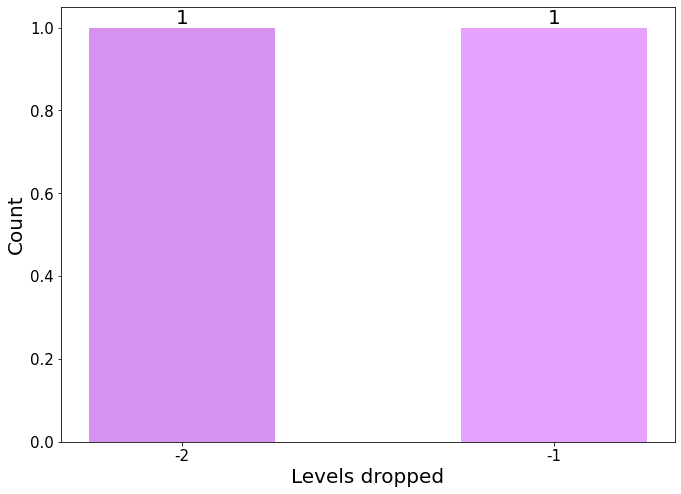

In [54]:
width = 0.5
fig, ax = plt.subplots()
fig.set_size_inches(11, 8)

x_axis = list(rate_decrease_counts.keys())
y_axis = list(rate_decrease_counts.values())
plt.bar(x_axis, y_axis, width=width, color=['#e7a1ff', '#d792ef'])
# plt.title("Change in decrease in rating", fontsize=20)
print("Change in decrease in rating")
plt.xticks(ticks=x_axis, labels=map(lambda x:str(x), x_axis))
# plt.yticks(ticks=list(range(max(y_axis) + 1)))

plt.xlabel("Levels dropped", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)

for i in range(len(x_axis)):
    plt.text(x_axis[i], y_axis[i]+0.01, y_axis[i], fontdict=dict(fontsize=f_size), ha="center")
    
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

In [55]:
rate_decrease = pd.DataFrame(count_uses(rating_decreased), index=["rating_decreased"])

In [56]:
recertified_bdgs[recertified_bdgs["last_2_rating_change"] < 0][selected_cols] # df of the buildings with decreased ratings

,building,award,green_features,developer,architect,structural_eng,me_eng,land_cons,qs,main_contractor,fac_mgt,esd_cons,esco_cons,green_cons,building_use,building_use_manual
573,Novartis Asia Pacific Pharmaceuticals Pte Ltd,Green Mark Certified,['LED lights replacing 90% of existing office ...,Novartis Asia Pacific Pharmaceuticals Pte Ltd,NaN,NaN,NaN,NaN,NaN,Jones Lang LaSalle Property Consultants Pte Ltd,SCA Design Pte Ltd,-,-,-,Commercial,"[office/commercial, educational/research]"
161,Visa Worldwide Pte Limited,Green Mark Gold Plus,['Motion sensors throughout the office to mini...,Visa Worldwide Pte Ltd,NaN,NaN,J Roger Preston (S) Pte Ltd,NaN,NaN,NaN,AD Incorporation Pte Ltd,Facility Link Pte Ltd,CBRE Pte Ltd,-,Commercial,[office/commercial]


Change in buildings' GreenMark ratings after recertification


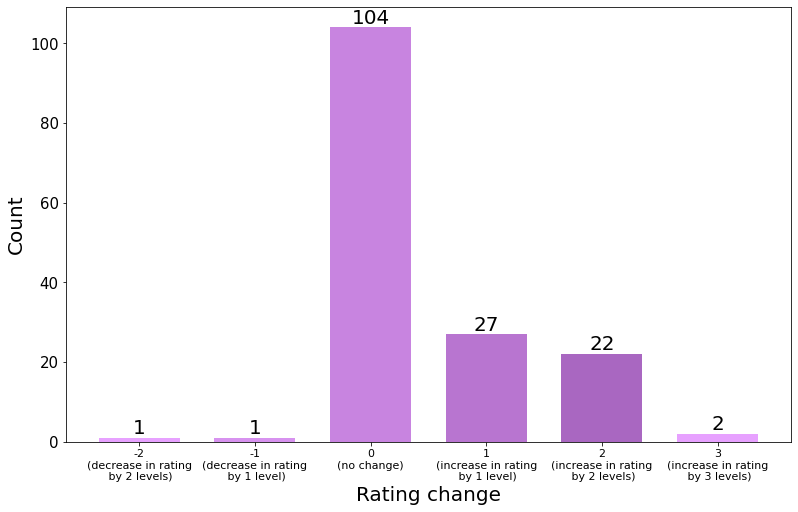

In [57]:
scores = {-2: 1, -1: 1, 0: 104, 1: 27, 2: 22, 3: 2}

def change_in_rating():
    """
    bar plot for change in buildings' GreenMark ratings after recertification
    """
    # setting the size and axes
    width = 0.7
    fig, ax = plt.subplots()
    fig.set_size_inches(13, 8)
    x_axis = list(scores.keys())
    y_axis = list(scores.values())
    
    # plotting the data from the scores dictionary
    plt.bar(x_axis, y_axis, width=width, color=['#e7a1ff', '#d792ef', '#c884e0', '#b875d0', '#a967c1'])
    
    # add title
#     plt.title("Change in buildings' GreenMark ratings after recertification", fontsize=20)
    print("Change in buildings' GreenMark ratings after recertification")
    
    # label the xticks manually to make it more readable
    plt.xticks(ticks=x_axis, labels=["-2\n(decrease in rating\n by 2 levels)", "-1\n(decrease in rating\n by 1 level)", "0\n(no change)", "1\n(increase in rating\n by 1 level)",\
                                    "2\n(increase in rating\n by 2 levels)", "3\n(increase in rating\n by 3 levels)"],\
                                       fontsize=11) # tick size is 11 because text too long for 15

    # add text for count on top of the bar plots
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_axis[i]+1, y_axis[i], fontsize=f_size, ha="center")

    plt.xlabel("Rating change", fontsize=f_size)

    plt.ylabel("Count", fontsize=f_size)
    
    plt.yticks(fontsize=tick_size)

change_in_rating()

## No change

In [58]:
rate_no_change = pd.DataFrame(count_uses(no_change), index=["no_change"])

In [59]:
recertified_bdgs[recertified_bdgs["last_2_rating_change"] == 0][selected_cols] # df of the buildings with no change in rating

,building,award,green_features,developer,architect,structural_eng,me_eng,land_cons,qs,main_contractor,fac_mgt,esd_cons,esco_cons,green_cons,building_use,building_use_manual
1253,*SCAPE,Green Mark Gold,['Use of energy efficient LED lighting for all...,Scape Co. Ltd,NaN,NaN,NaN,NaN,NaN,NaN,"*SCAPE CO., LTD",C&W Services (S) Pte Ltd,-,-,Commercial,"[office/commercial, educational/research]"
1067,55 Market Street,Green Mark Gold,['Use of energy efficient lightings (high freq...,BMT Limited as Trustee for Frasers Commercial ...,NaN,NaN,NaN,NaN,NaN,NaN,Frasers Centrepoint Property Management Servic...,Cushman & Wakefield Facilities & Engineering (...,Cushman & Wakefield Facilities & Engineering (...,-,Commercial,[office/commercial]
874,71 Robinson Road,Green Mark Gold,['Lighting system – All fluorescent lamps in t...,CR - 71 Robinson,NaN,NaN,NaN,NaN,NaN,NaN,CBRE Pte Ltd,LJ Energy,LJ Energy,-,Commercial,[office/commercial]
501,978 & 988 Toa Payoh North,Green Mark Gold,['Re-generative feature for lifts. 2. All toil...,Mapletree Industrial Trust Management Ltd,NaN,NaN,NaN,NaN,NaN,NaN,Mapletree Industrial Trust Management Ltd,LJ Energy Pte Ltd,LJ Energy Pte Ltd,-,Industrial,"[office/commercial, industrial]"
989,AIA Alexandra,Green Mark Certified,"['LED Lights for all corridor, staircases and ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,AIA Singapore Private Limited,Johnson Controls (S) Pte Ltd,Johnson Controls (S) Pte Ltd,-,Commercial,[office/commercial]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1187,Wilkie Edge,Green Mark Gold,['Use of energy efficient lamps (LEDs with mot...,CapitaLand Commercial Trust,NaN,NaN,NaN,NaN,NaN,NaN,CapitaLand Commercial Management Pte Ltd,Cushman & Wakefield F&E (S) Ltd,Cushman & Wakefield F&E (S) Ltd,-,Commercial,"[recreational/culture, office/commercial]"
469,Winsland House 1,Green Mark Gold Plus,['Energy efficient chiller plant with a system...,Winsland Investment Pte Ltd,NaN,NaN,NaN,NaN,NaN,NaN,Wing Tai Investment Management Pte Ltd,G-Energy Global Pte Ltd,-,-,Commercial,[office/commercial]
1314,Winsland House II,Green Mark Gold Plus,['Energy efficient chiller plant system of les...,Winmax Investment Ptd Ltd,NaN,NaN,NaN,NaN,NaN,NaN,Winmax Investment Ptd Ltd,G-Energy Global Pte Ltd,-,-,Commercial,[office/commercial]
411,Woh Hup Building,Green Mark Platinum,['Efficiency of air-conditioning system target...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,In-House Facility Management,Building System & Diagnostics Pte Ltd,-,-,Commercial,"[recreational/culture, office/commercial]"


## Building uses

In [60]:
def plot_bdg_use(dic, title_string):
    """
    the total count for building use may be greater than the actual number of buildings
    this is because the buildings may have more than one use
    """
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)

    x_axis = range(len(list(dic.keys())))
    y_axis = list(dic.values())
    width=0.7
    
    if dic == bdg_use_all:
        plt.bar(x_axis, y_axis, width=width)
    else:
        plt.bar(x_axis, y_axis, width=width, color="#ff7f0e")
    if dic == bdg_use_all:
#         plt.title(f"Building use for all buildings {title_string}", fontsize=30)
        print(f"Building use for all buildings {title_string}")
    else:
#         plt.title(f"Building use for recertified buildings {title_string}", fontsize=30)
        print(f"Building use for recertified buildings {title_string}")
    plt.yticks(fontsize=tick_size_big)
    xlabels = list(map(add_row, list(dic.keys())))
    plt.xticks(ticks=x_axis, labels=xlabels, fontsize=tick_size_big, ha="center")
    
    for i in range(len(x_axis)):
        if dic == count_uses(rating_decreased):
            plt.text(x_axis[i], y_axis[i]+0.1, y_axis[i], fontdict=dict(fontsize=f_size_big), ha="center")
        elif dic == bdg_use_all:
            plt.text(x_axis[i], y_axis[i]+5, y_axis[i], fontdict=dict(fontsize=f_size_big), ha="center")
        else:
            plt.text(x_axis[i], y_axis[i]+0.2, y_axis[i], fontdict=dict(fontsize=f_size_big), ha="center")

    plt.xlabel("Building use", fontsize=f_size_big)

    plt.ylabel("Count", fontsize=f_size_big)
    


Building use for all buildings 


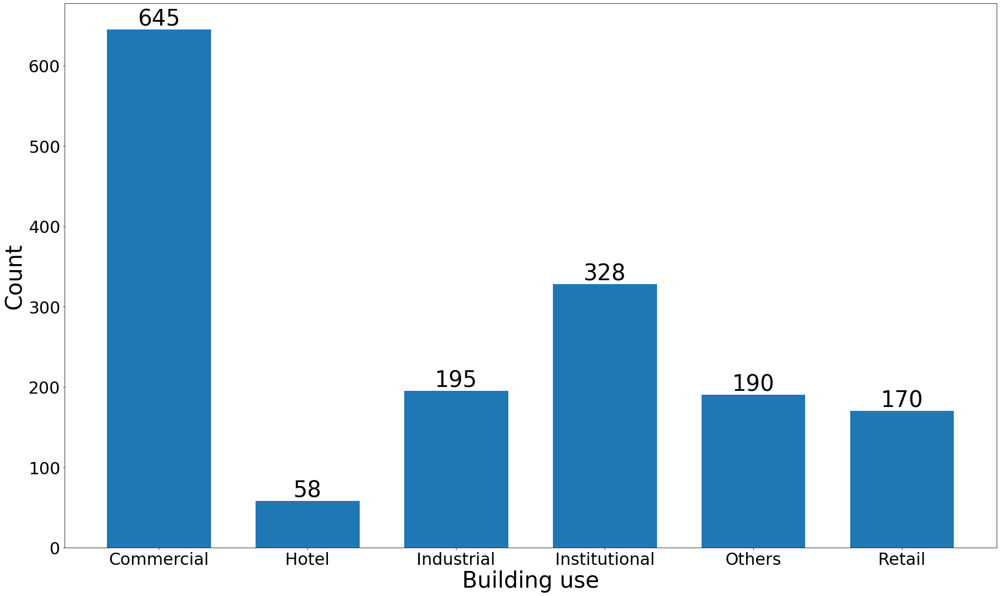

In [61]:
plot_bdg_use(bdg_use_all, "")

Building use for recertified buildings 


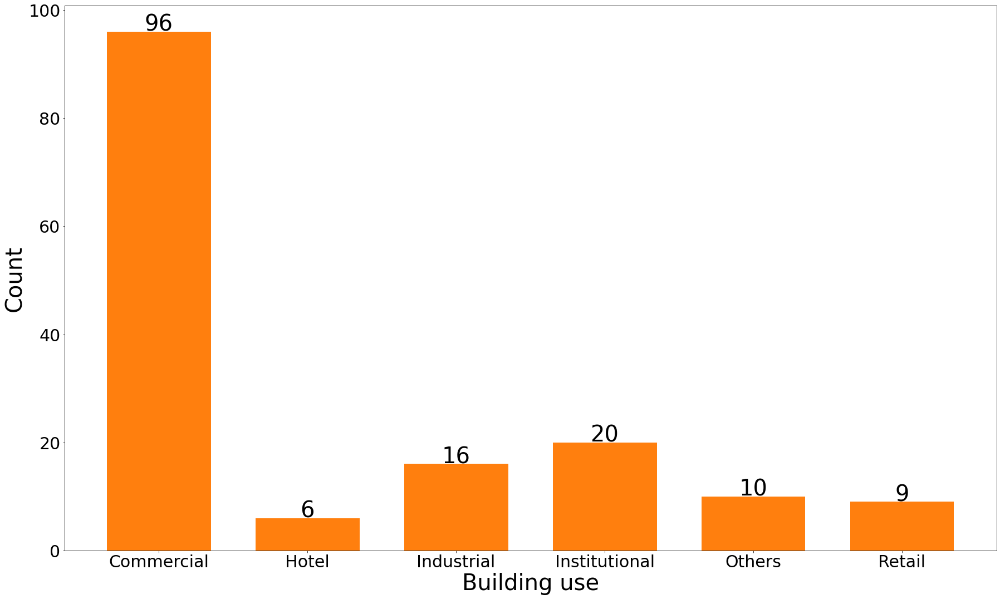

In [62]:
plot_bdg_use(bdg_use_all_recertified, "")

Building use for recertified buildings where there is no change in rating


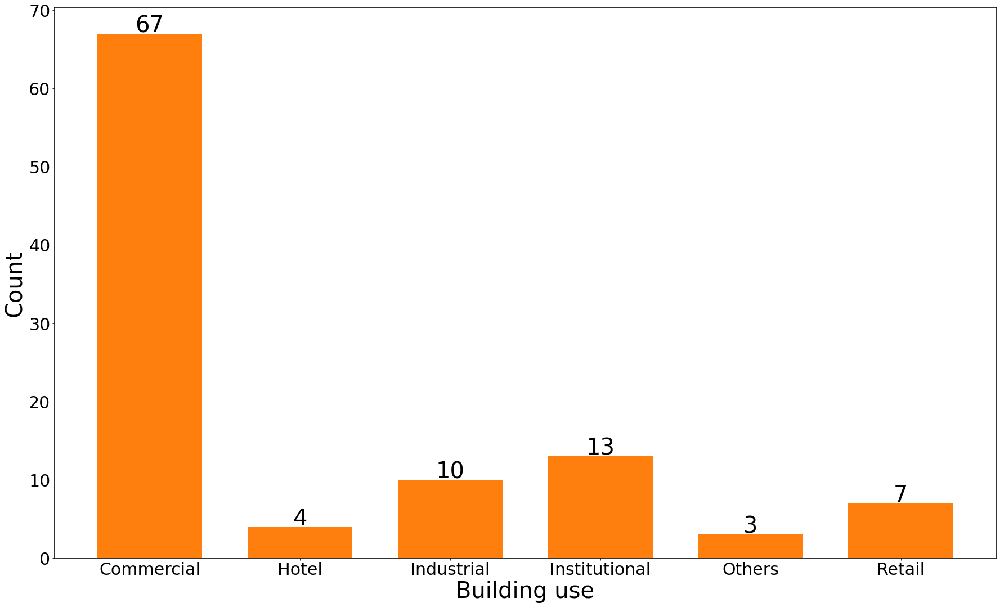

In [63]:
plot_bdg_use(count_uses(no_change), "where there is no change in rating")

Building use for recertified buildings where rating increased


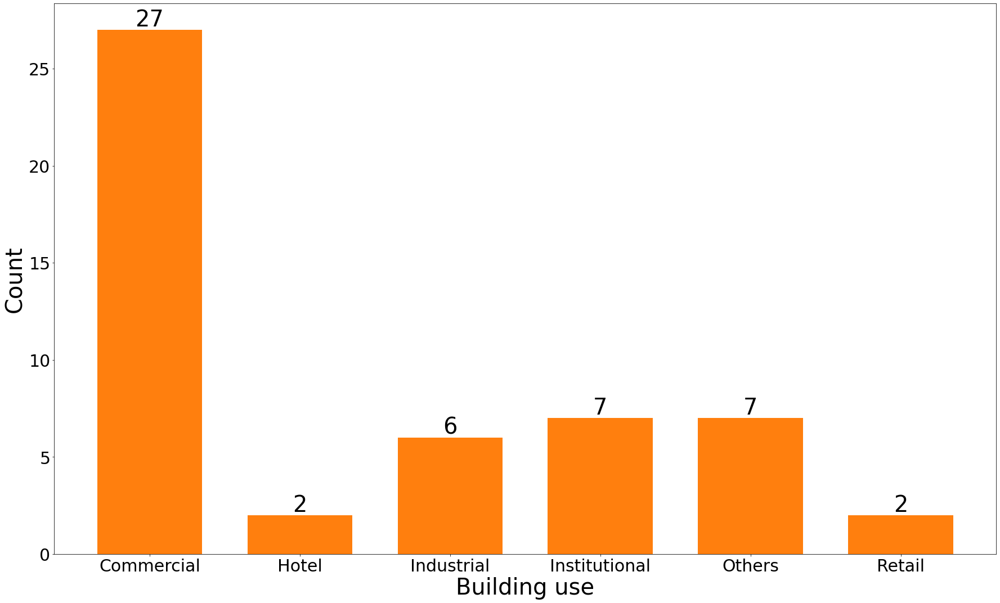

In [64]:
plot_bdg_use(count_uses(rating_increased), "where rating increased")

Building use for recertified buildings where rating decreased


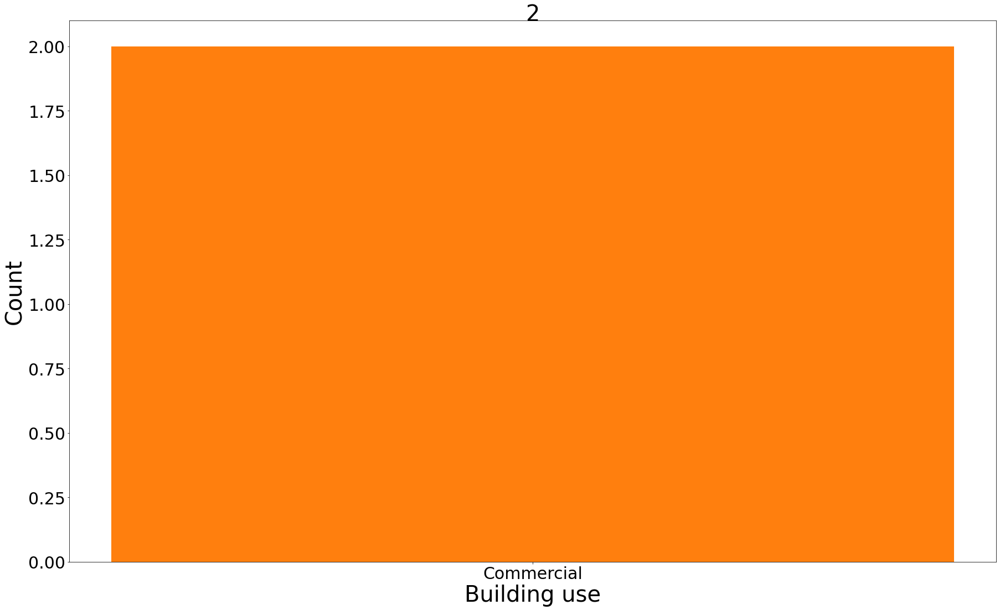

In [65]:
plot_bdg_use(count_uses(rating_decreased), "where rating decreased")

# New vs existing buildings

#### Add new column for new/recertified

In [66]:
data["new_or_existing"] = None

for i in data.index:
    name = data.at[i, "building"]
    fy = data.at[i, "fy"]
    if fy in bdg_info[name][0]: # if the FY is the first (earliest) certification cycle for that building
        data.at[i, "new_or_existing"] = "new"
    else:
        data.at[i, "new_or_existing"] = "existing"

## New vs Recertified

In [67]:
def find_new_existing(fy):
    """
    returns a list
    [no of new buildings, no of existing buildings]
    for each FY
    """
    df = data.loc[data["fy"] == fy]
    new = len(df.loc[df["new_or_existing"] == "new"])
    existing = len(df.loc[df["new_or_existing"] == "existing"])
    return [new, existing]

In [68]:
def all_new_existing():
    """
    returns a dict of new and existing buildings for each FY
    """
    d = {}
    for i in range(5, 22):
        year = "FY" + str(i).zfill(2)
        d[year] = find_new_existing(year)
    return d

In [69]:
d_new_existing = all_new_existing()

New vs recertified buildings over the years (bar plot)


'\nrecertified buildings over the years\n'

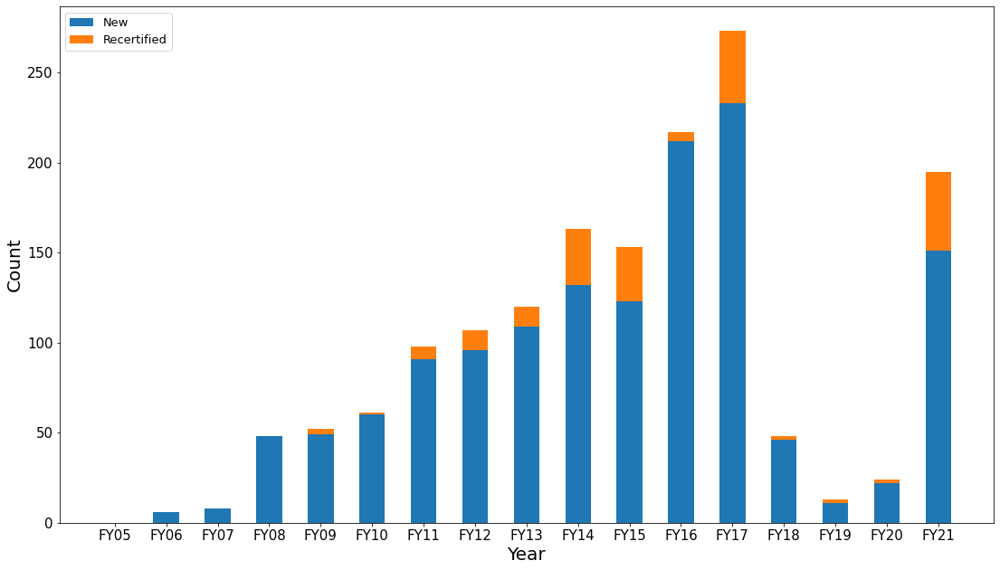

In [70]:
labels = list(d_new_existing.keys())
all_new = list(map(lambda x: x[0], d_new_existing.values()))
all_existing = list(map(lambda x: x[1], d_new_existing.values()))
width = 0.5

fig, ax = plt.subplots()

fig.set_size_inches(18.5, 10.5)

ax.bar(labels, all_new, width=width, label="New")
ax.bar(labels, all_existing, width=width, bottom=all_new,
       label="Recertified")

plt.xlabel("Year", fontsize=f_size)
    
plt.ylabel("count", fontsize=f_size)

plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

ax.set_ylabel('Count')
# ax.set_title('New vs recertified buildings over the years (bar plot)', fontsize=25)
print('New vs recertified buildings over the years (bar plot)')
ax.legend(loc="upper left", fontsize=13)

# if the 're certification' suffixes were kept, there would be more 'new' buildings which are actually recertified

"""
recertified buildings over the years
"""

New vs recertified buildings over the years (line plot)


'\nrecertified buildings over the years\n'

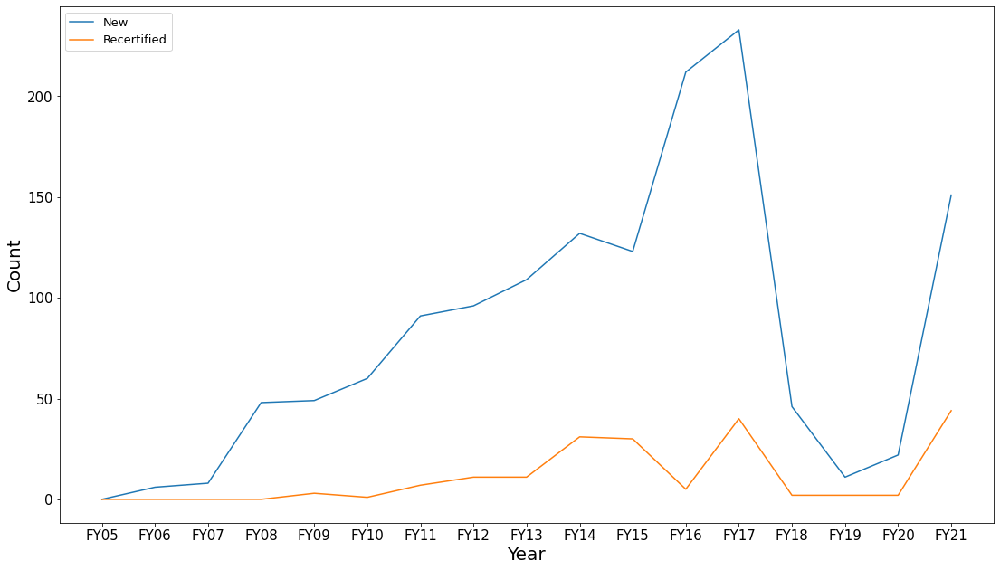

In [71]:
labels = list(d_new_existing.keys())
all_new = list(map(lambda x: x[0], d_new_existing.values()))
all_existing = list(map(lambda x: x[1], d_new_existing.values()))

fig, ax = plt.subplots()

fig.set_size_inches(18.5, 10.5)

ax.plot(labels, all_new, label="New")
ax.plot(labels, all_existing,
       label="Recertified")

#ax.set_ylabel('Count')
plt.xlabel("Year", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)

plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

# ax.set_title('New vs recertified buildings over the years (line plot)', fontsize=25)
print('New vs recertified buildings over the years (line plot)')
ax.legend(loc="upper left", fontsize=13)

# if the 're certification' suffixes were kept, there would be more 'new' buildings which are actually recertified

"""
recertified buildings over the years
"""

New vs recertified buildings over the years (scatter plot)


'\nrecertified buildings over the years\n'

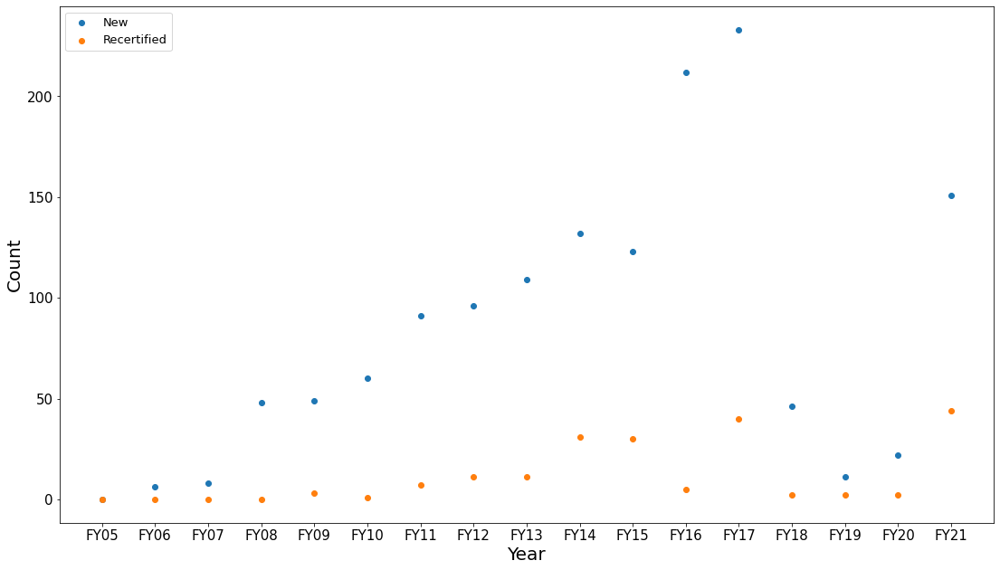

In [72]:
labels = list(d_new_existing.keys())
all_new = list(map(lambda x: x[0], d_new_existing.values()))
all_existing = list(map(lambda x: x[1], d_new_existing.values()))

fig, ax = plt.subplots()

fig.set_size_inches(18.5, 10.5)

ax.scatter(labels, all_new, label="New")
ax.scatter(labels, all_existing,
       label="Recertified")

#ax.set_ylabel('Count')
plt.xlabel("Year", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)

plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

# ax.set_title('New vs recertified buildings over the years (scatter plot)', fontsize=25)
print('New vs recertified buildings over the years (scatter plot)')
ax.legend(loc="upper left", fontsize=13)

# if the 're certification' suffixes were kept, there would be more 'new' buildings which are actually recertified

"""
recertified buildings over the years
"""

# Adoption rate per category over the years

## Without uncategorised features

In [73]:
cat_names = \
["sustainable management", "building energy performance", "resource stewardship",\
                    "smart & healthy building", "advanced green effort"]

subcat_names = \
['leadership',
 'urban harmony',
 'tropicality',
 'energy efficiency',
 'renewable energy',
 'water',
 'materials',
 'waste',
 'indoor air quality',
 'spatial quality',
 'smart building operations',
 'complementary certifications']

In [74]:
colours = \
{'uncategorised': 'slategrey',
 'sustainable management': 'm',
 'building energy performance': 'g',
 'resource stewardship': 'r',
 'smart & healthy building': 'c',
 'advanced green effort': 'b',
 'leadership': '#52ef99',
 'urban harmony': '#c3f094',
 'tropicality': '#587401',
 'energy efficiency': '#25919d',
 'renewable energy': '#b97409',
 'water': '#d5c5a1',
 'materials': '#5ce8ef',
 'waste': '#76f014',
 'indoor air quality': '#fcd107',
 'spatial quality': '#21a708',
 'smart building operations': '#a3c9fe',
 'complementary certifications': '#7c6752'}

Generate colour palette [here](http://vrl.cs.brown.edu/color)

## Adoption rate of categories

Adoption rate of categories for all certified buildings ungrouped
Adoption rate of categories for Green Mark Certified certified buildings ungrouped
Adoption rate of categories for Green Mark Gold certified buildings ungrouped
Adoption rate of categories for Green Mark Gold Plus certified buildings ungrouped
Adoption rate of categories for Green Mark Platinum certified buildings ungrouped


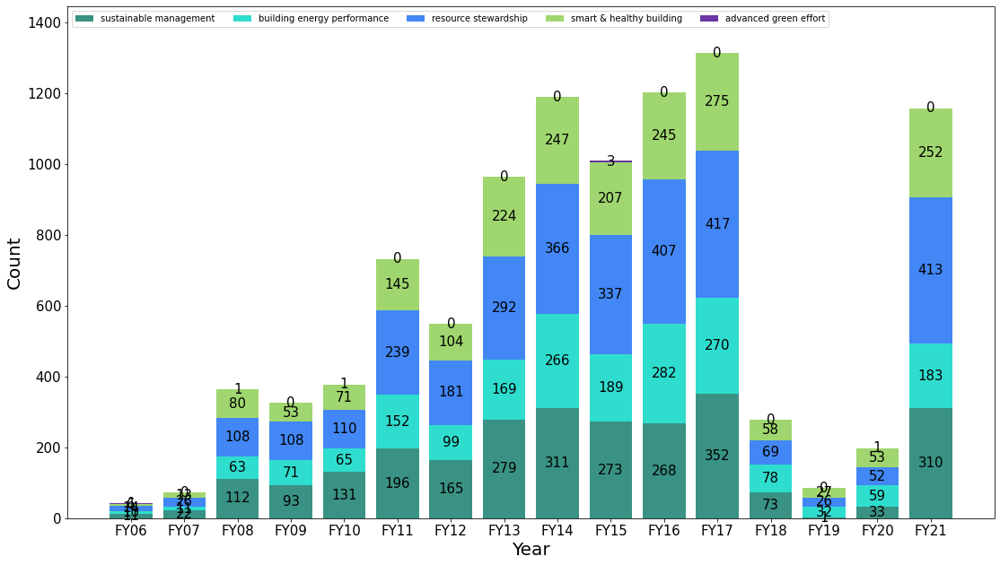

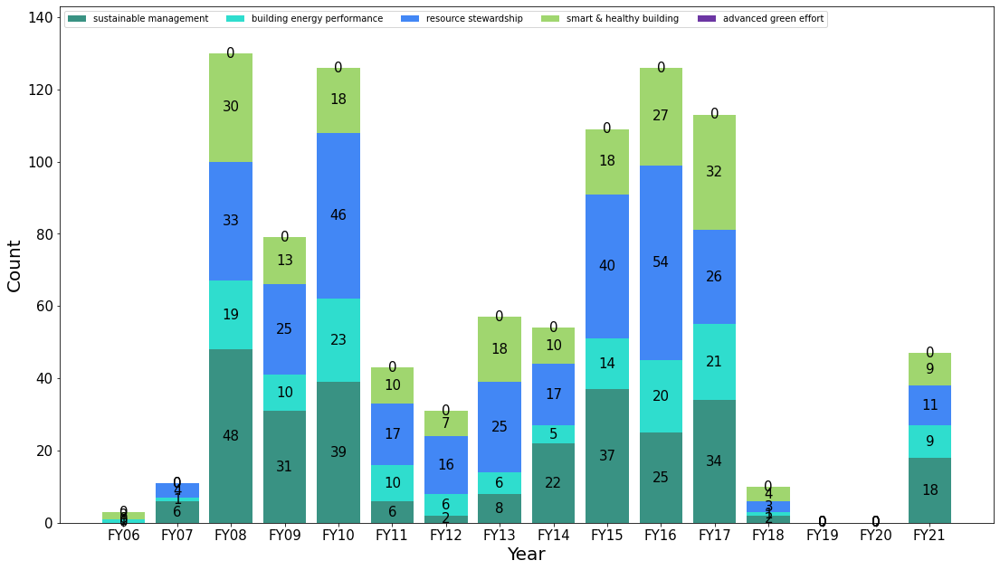

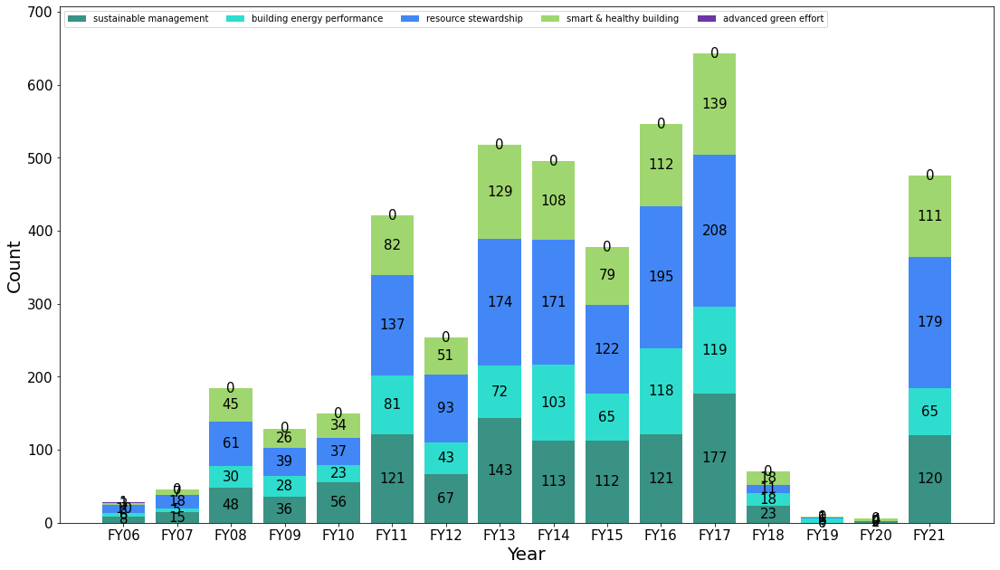

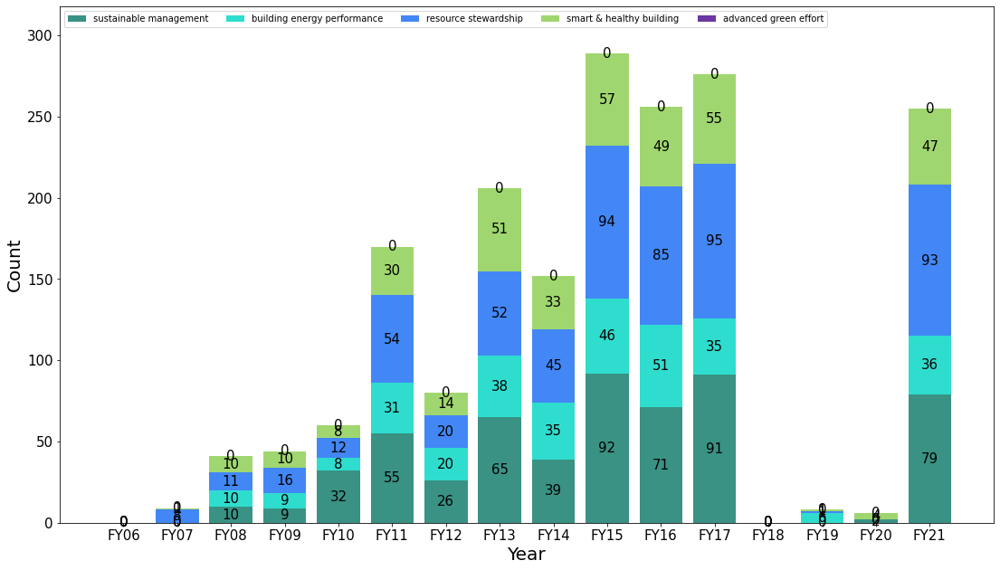

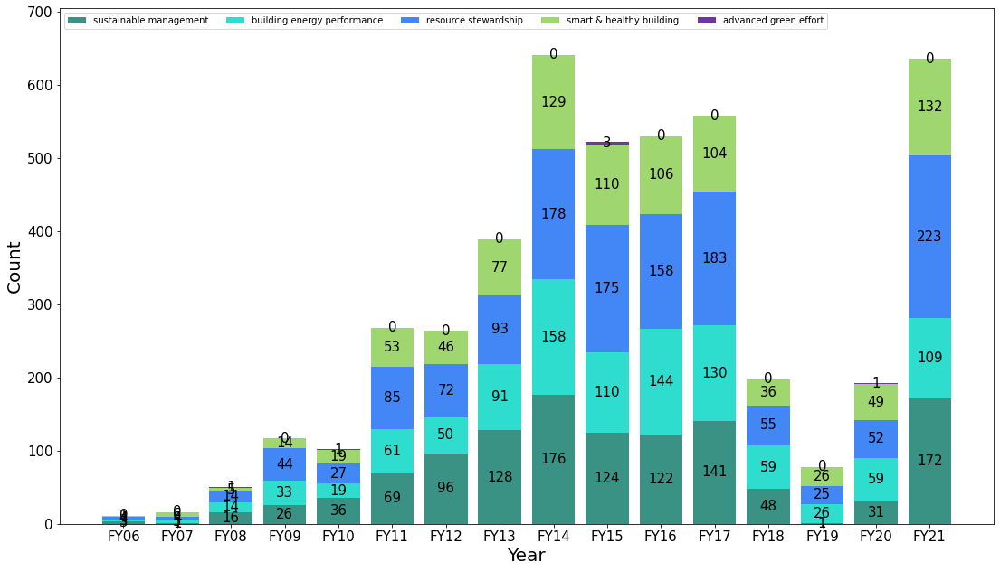

In [75]:
def plot_bar_main_cat_unnorm(*award_name):
    dic_main_cats = {"sustainable management": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "building energy performance": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "resource stewardship": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "smart & healthy building": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "advanced green effort": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0}}

    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']

    if not award_name:
        interested_data = data
    elif award_name == "Green Mark Gold":
        interested_data = data[data["award"] == "Green Mark Gold"].append(data[data["award"] == "Green Mark Gold (Positive Energy)"])
    else:
        interested_data = data[data["award"].str.contains(award_name[0])]
    for _,row in interested_data.iterrows():
        year = row["fy"]
        for mc in row["main_category"]:
            dic_main_cats[mc][year] += 1

    dic_main_cats_short = {}
    for y in dic_main_cats:
        dic_main_cats_short[y] = list(dic_main_cats[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
#     plt.title(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings ungrouped",\
#              fontsize=25)
    print(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings ungrouped")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    
    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_main_cats_short.values()), axis=0))
    n = 0
    
    y_lim = max(total_each_year)*1.1
    plt.ylim(top=y_lim)

    for y in dic_main_cats_short:
        y_vals = dic_main_cats_short[y]
#         y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
#         y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        plt.bar(ay_names, y_vals, bottom=bottom, label=main_cats_names[n], color=cats_colours[y])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals
            if v == 0:
                continue
            else:
                gap = y_vals[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals[i])}", fontsize=15, ha="center", va="center")
                # plot text size is smaller than f_size at 15

    plt.legend(loc='upper left', ncol=n)

plot_bar_main_cat_unnorm()    
for a in awards_names:
    plot_bar_main_cat_unnorm(a)

Adoption rate of categories for all certified buildings ungrouped
All buildings:
sustainable management
Mean: 25.605846002701814
Standard Deviation: 121.00461423708877
building energy performance
Mean: 21.73293728090275
Standard Deviation: 92.43049190247412
resource stewardship
Mean: 31.505450323957405
Standard Deviation: 153.00162036179006
smart & healthy building
Mean: 20.923103735654966
Standard Deviation: 97.00893429645195
advanced green effort
Mean: 0.23266265678307305
Standard Deviation: 0.8139410298049853

Adoption rate of categories for Green Mark Certified certified buildings ungrouped
Green Mark Certified buildings:
sustainable management
Mean: 23.688433773171322
Standard Deviation: 16.447390877177654
building energy performance
Mean: 14.174881899408238
Standard Deviation: 8.065358020571685
resource stewardship
Mean: 28.272385679231405
Standard Deviation: 17.022411697523943
smart & healthy building
Mean: 21.36429864818903
Standard Deviation: 10.626225419530053
advanced green 

<ipython-input-76-28dd73e0eb4e>:48: RuntimeWarning: invalid value encountered in long_scalars
  y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))


Adoption rate of categories for Green Mark Gold certified buildings ungrouped
Green Mark Gold buildings:
sustainable management
Mean: 26.84732414882276
Standard Deviation: 56.82121082835177
building energy performance
Mean: 20.52953169391614
Standard Deviation: 40.94854494769422
resource stewardship
Mean: 29.205868422099737
Standard Deviation: 77.3778607441
smart & healthy building
Mean: 23.194061449447062
Standard Deviation: 49.007099825773544
advanced green effort
Mean: 0.2232142857142857
Standard Deviation: 0.25

Adoption rate of categories for Green Mark Gold Plus certified buildings ungrouped
Green Mark Gold Plus buildings:
sustainable management
Mean: 23.568461354964672
Standard Deviation: 34.933687180141746
building energy performance
Mean: 17.532748189725034
Standard Deviation: 18.161199483147215
resource stewardship
Mean: 27.050902229969857
Standard Deviation: 37.330729075834206
smart & healthy building
Mean: 19.347888225340434
Standard Deviation: 22.204729226000484
advanced g

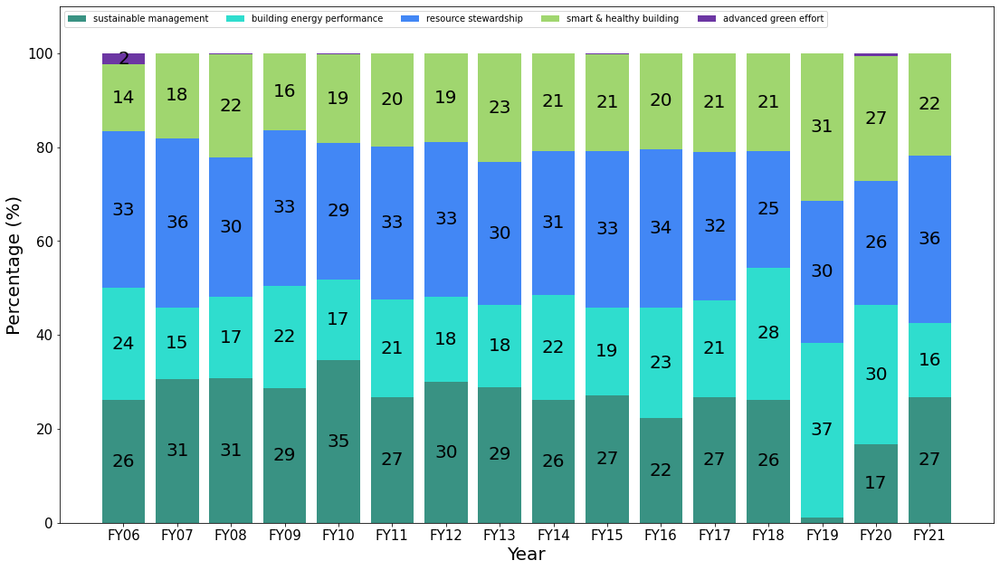

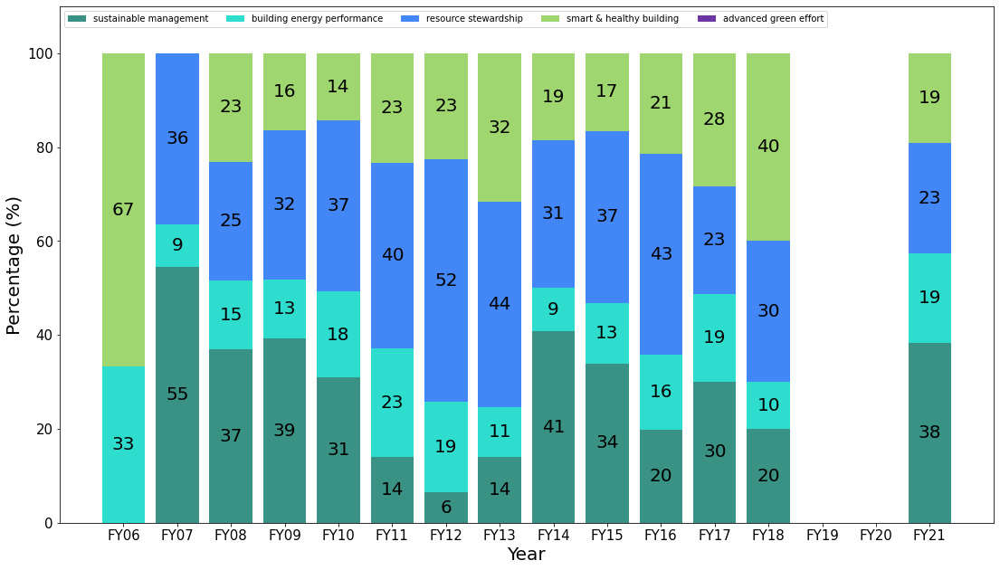

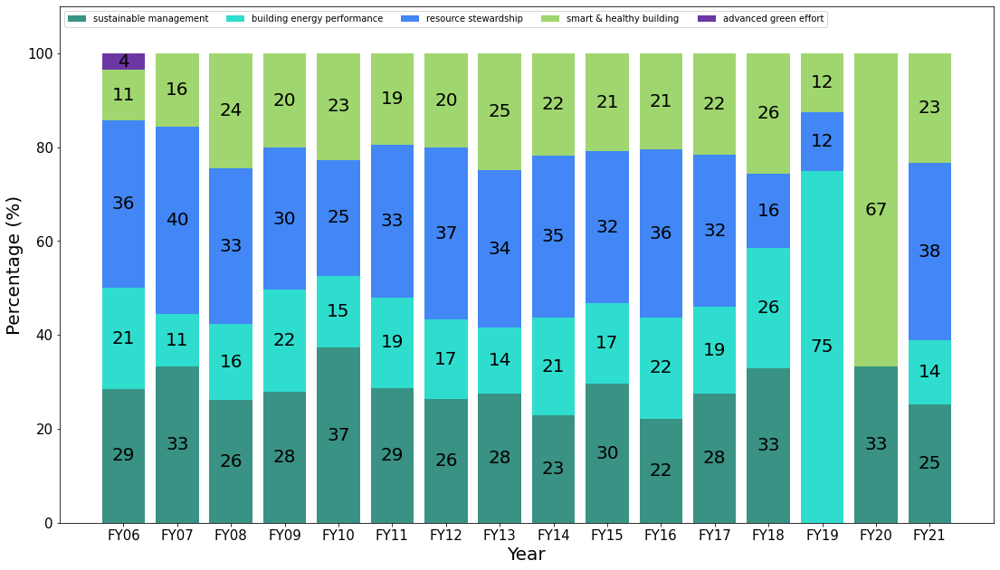

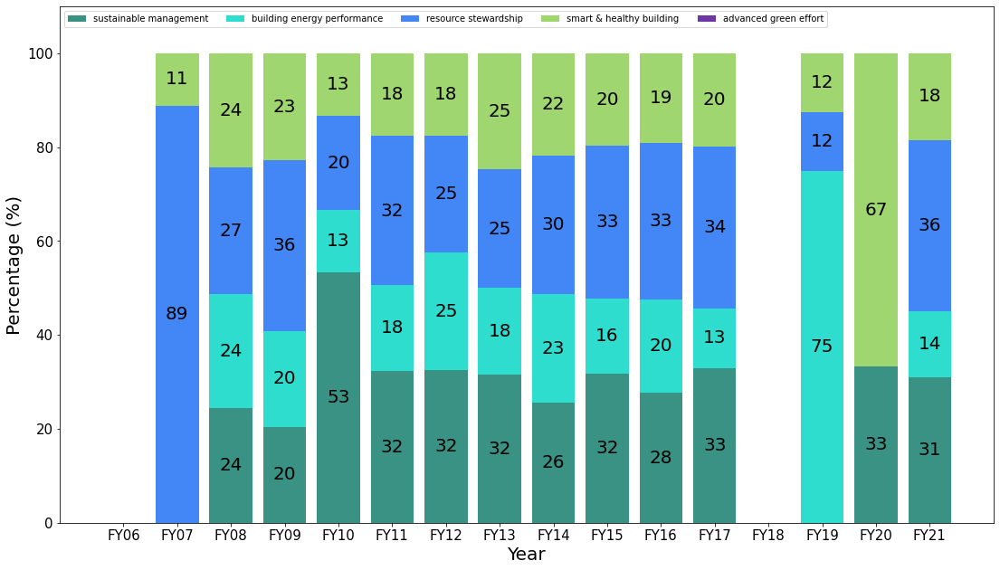

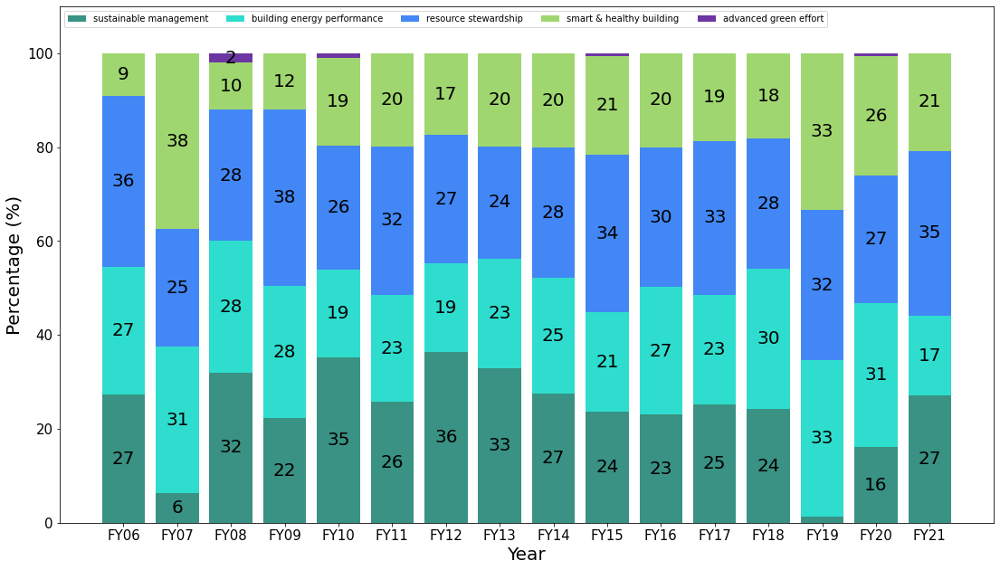

In [76]:
def plot_bar_main_cat(*award_name):
    dic_main_cats = {"sustainable management": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "building energy performance": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "resource stewardship": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "smart & healthy building": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "advanced green effort": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0}}

    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']

    stat_info = ''
    
    if not award_name:
        interested_data = data
    elif award_name == "Green Mark Gold":
        interested_data = data[data["award"] == "Green Mark Gold"].append(data[data["award"] == "Green Mark Gold (Positive Energy)"])
    else:
        interested_data = data[data["award"].str.contains(award_name[0])]
    for _,row in interested_data.iterrows():
        year = row["fy"]
        for mc in row["main_category"]:
            dic_main_cats[mc][year] += 1

    dic_main_cats_short = {}
    for y in dic_main_cats:
        dic_main_cats_short[y] = list(dic_main_cats[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    plt.ylim(top=110)
#     plt.title(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings ungrouped",\
#              fontsize=25)
    print(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings ungrouped")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Percentage (%)", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    plt.ylim(top=110)
    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_main_cats_short.values()), axis=0))
    n = 0

    stat_info += (f"{'All' if not award_name else award_name[0]} buildings:\n")
    for y in dic_main_cats_short:
        y_vals = dic_main_cats_short[y]
        y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
        y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        stat_info += (
            f"{y}\nMean: {sum(y_vals_normalised)/len(y_vals_normalised)}\nStandard Deviation: {statistics.stdev(y_vals)}\n"
        )
        plt.bar(ay_names, y_vals_normalised, bottom=bottom, label=main_cats_names[n], color=cats_colours[y])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals_normalised))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals_normalised[i]
            if v == 0 or round(v) == 0 or round(v) == 1:
                continue
            else:
                gap = y_vals_normalised[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals_normalised[i])}", fontsize=f_size, ha="center", va="center")

    plt.legend(loc='upper left', ncol=n)
    print(stat_info)
    return stat_info

plot_bar_main_cat()    
for a in awards_names:
    plot_bar_main_cat(a)

Adoption rate of categories for all certified buildings grouped
Adoption rate of categories for Green Mark Certified certified buildings grouped
Adoption rate of categories for Green Mark Gold certified buildings grouped
Adoption rate of categories for Green Mark Gold Plus certified buildings grouped
Adoption rate of categories for Green Mark Platinum certified buildings grouped


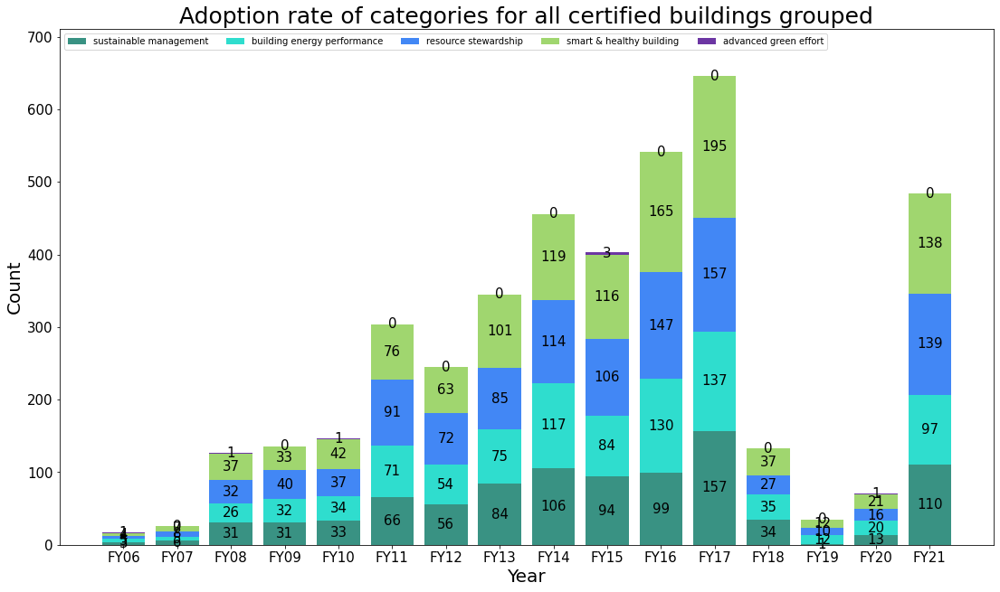

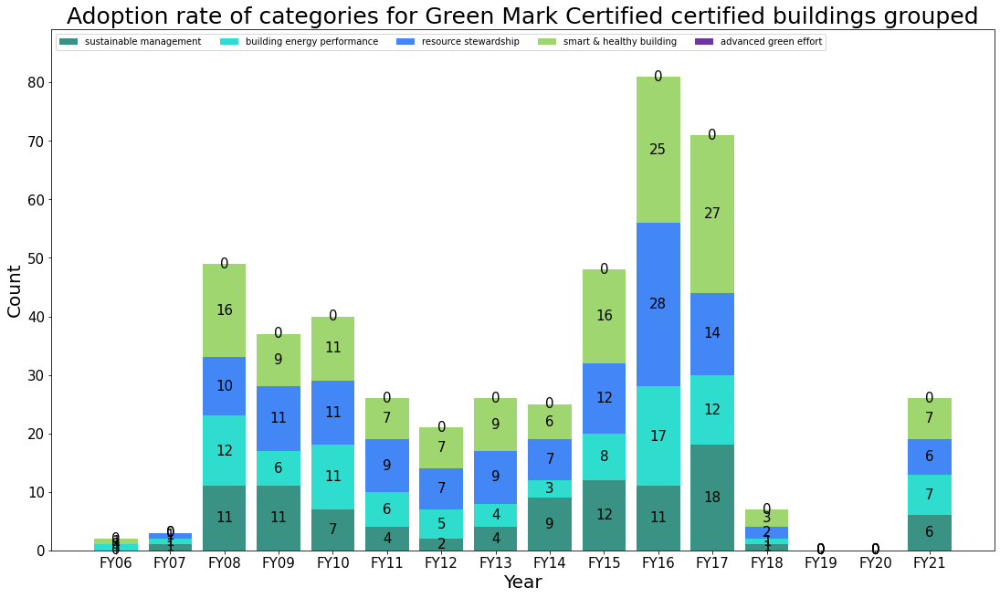

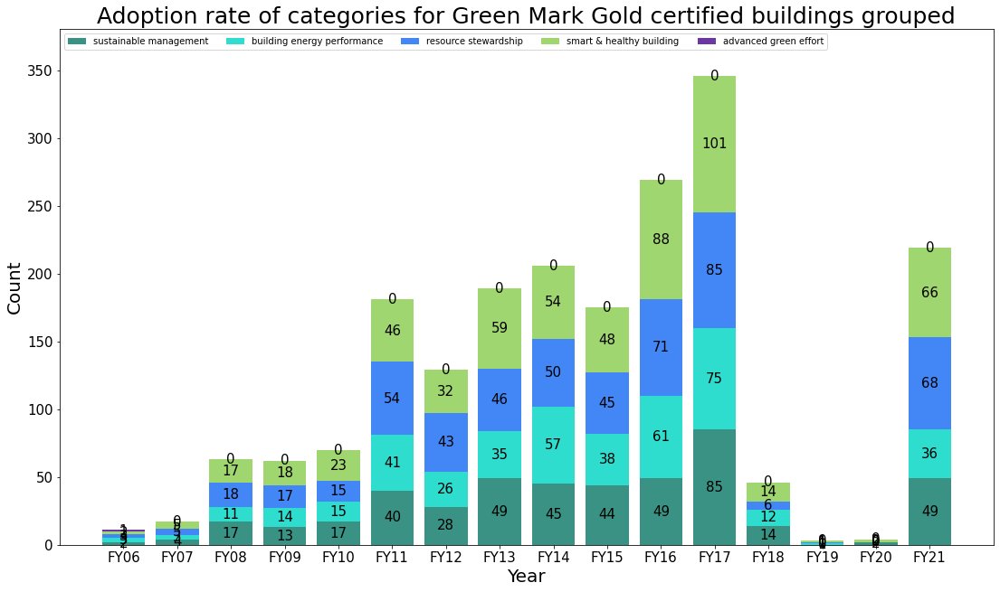

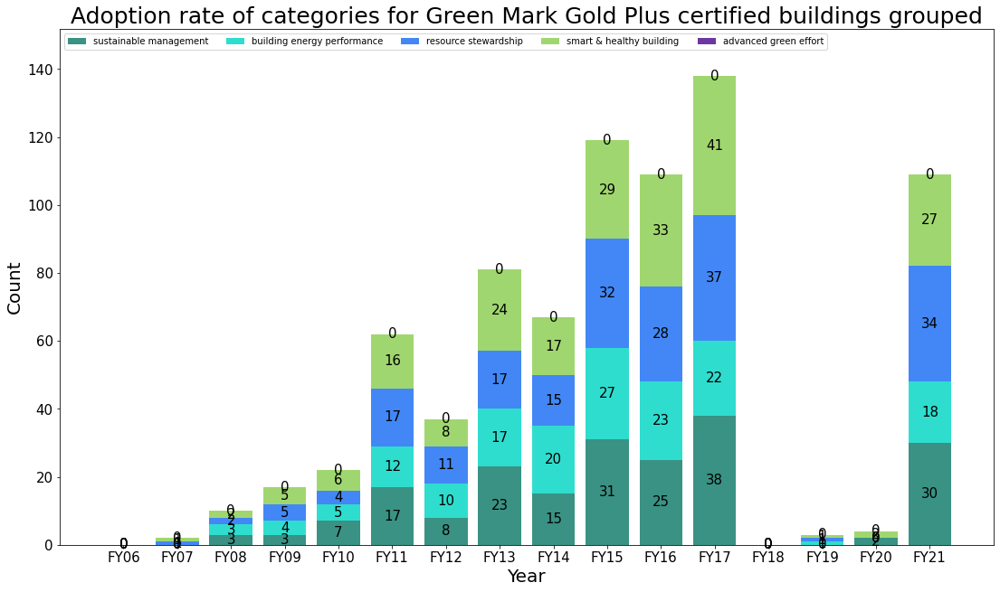

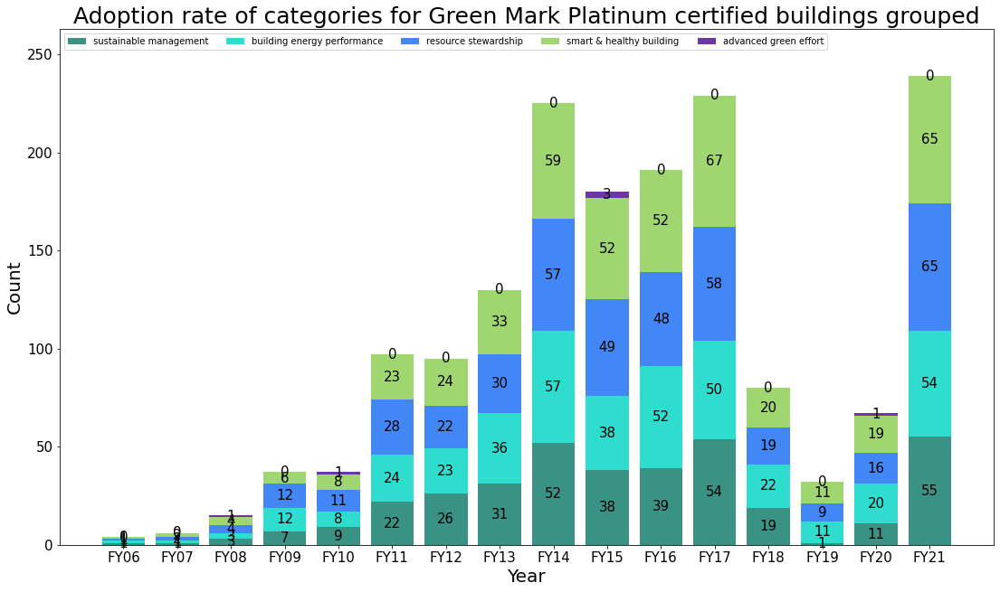

In [77]:
def plot_bar_main_cat_unnorm_grouped(*award_name):
    dic_main_cats = {"sustainable management": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "building energy performance": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "resource stewardship": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "smart & healthy building": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "advanced green effort": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0}}

    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']

    if not award_name:
        interested_data = data
    elif award_name == "Green Mark Gold":
        interested_data = data[data["award"] == "Green Mark Gold"].append(data[data["award"] == "Green Mark Gold (Positive Energy)"])
    else:
        interested_data = data[data["award"].str.contains(award_name[0])]
    for _,row in interested_data.iterrows():
        year = row["fy"]
        for mc in row["main_category_grouped"]:
            dic_main_cats[mc][year] += 1

    dic_main_cats_short = {}
    for y in dic_main_cats:
        dic_main_cats_short[y] = list(dic_main_cats[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    plt.title(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings grouped",\
             fontsize=25)
    print(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings grouped")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    

    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_main_cats_short.values()), axis=0))
    n = 0
    
    y_lim = max(total_each_year) * 1.1
    plt.ylim(top=y_lim)

    for y in dic_main_cats_short:
        y_vals = dic_main_cats_short[y]
        plt.bar(ay_names, y_vals, bottom=bottom, label=main_cats_names[n], color=cats_colours[y])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals
            if v == 0:
                continue
            else:
                gap = y_vals[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals[i])}", fontsize=15, ha="center", va="center")
                # plot font size 15

    plt.legend(loc='upper left', ncol=n)

plot_bar_main_cat_unnorm_grouped()    
for a in awards_names:
    plot_bar_main_cat_unnorm_grouped(a)

Adoption rate of categories for all certified buildings grouped
All buildings:
sustainable management
Mean: 21.120233427865482
Standard Deviation: 46.32565883683325
building energy performance
Mean: 23.966203801214103
Standard Deviation: 44.3905019870993
resource stewardship
Mean: 26.30883821341848
Standard Deviation: 52.96693150762401
smart & healthy building
Mean: 28.010793669845828
Standard Deviation: 59.512323653732984
advanced green effort
Mean: 0.5939308876561025
Standard Deviation: 0.8139410298049853

Adoption rate of categories for Green Mark Certified certified buildings grouped


<ipython-input-78-aa5411fa3ded>:48: RuntimeWarning: invalid value encountered in long_scalars
  y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))


Green Mark Certified buildings:
sustainable management
Mean: 17.537504993763378
Standard Deviation: 5.458555975103062
building energy performance
Mean: 20.098433024133055
Standard Deviation: 5.057996968497839
resource stewardship
Mean: 23.27936822715914
Standard Deviation: 7.1130748156710215
smart & healthy building
Mean: 26.58469375494442
Standard Deviation: 8.350648677398262
advanced green effort
Mean: 0.0
Standard Deviation: 0.0

Adoption rate of categories for Green Mark Gold certified buildings grouped
Green Mark Gold buildings:
sustainable management
Mean: 23.5161518430617
Standard Deviation: 23.985759664156287
building energy performance
Mean: 21.081907892271882
Standard Deviation: 23.342379198930573
resource stewardship
Mean: 24.998984684072337
Standard Deviation: 28.103306448411605
smart & healthy building
Mean: 29.834773762412254
Standard Deviation: 31.3878957561669
advanced green effort
Mean: 0.5681818181818182
Standard Deviation: 0.25

Adoption rate of categories for Green 

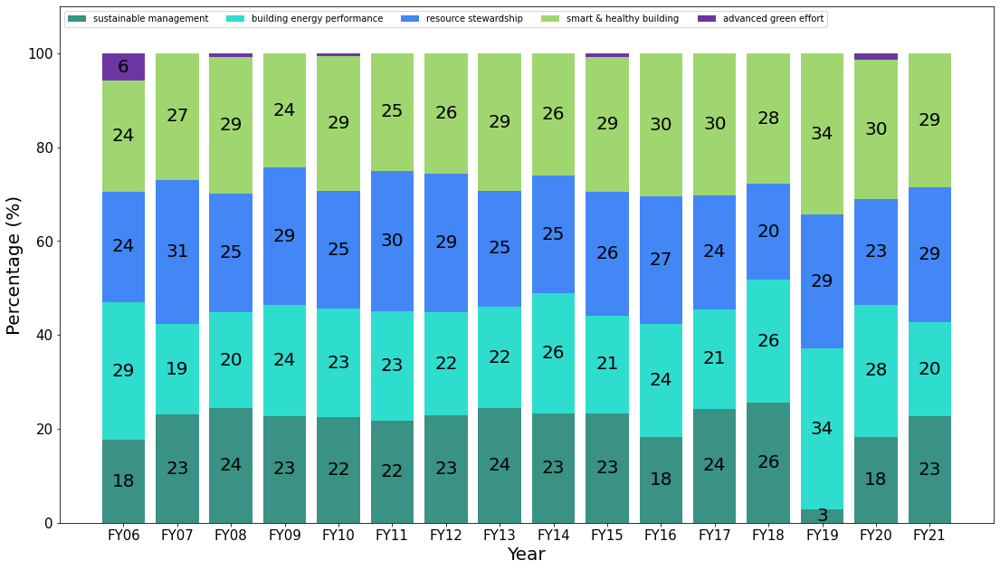

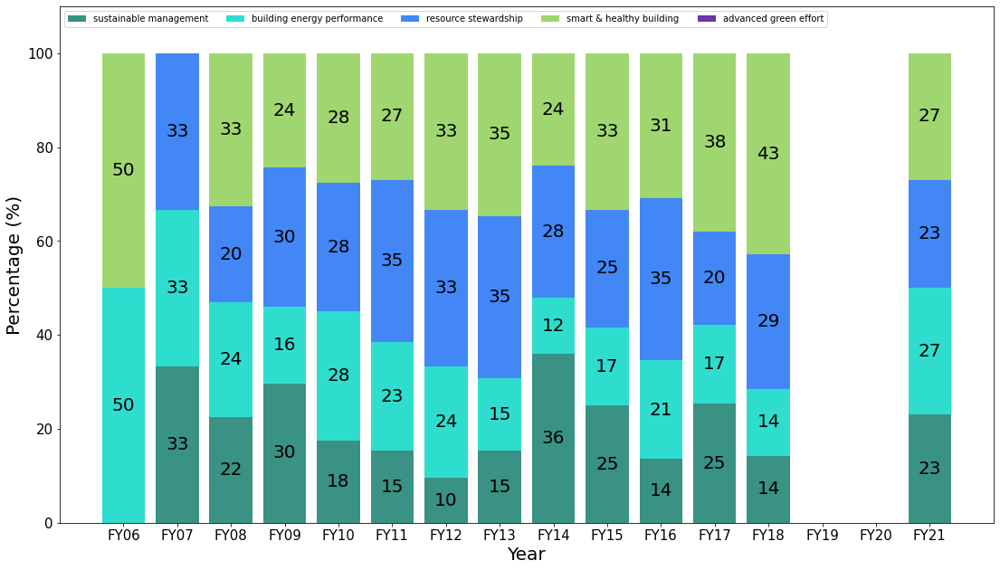

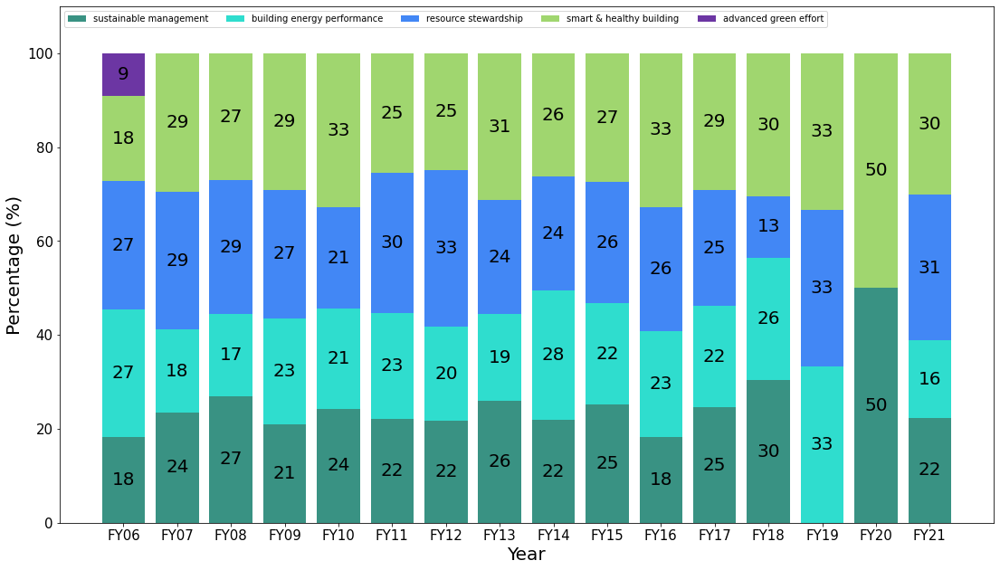

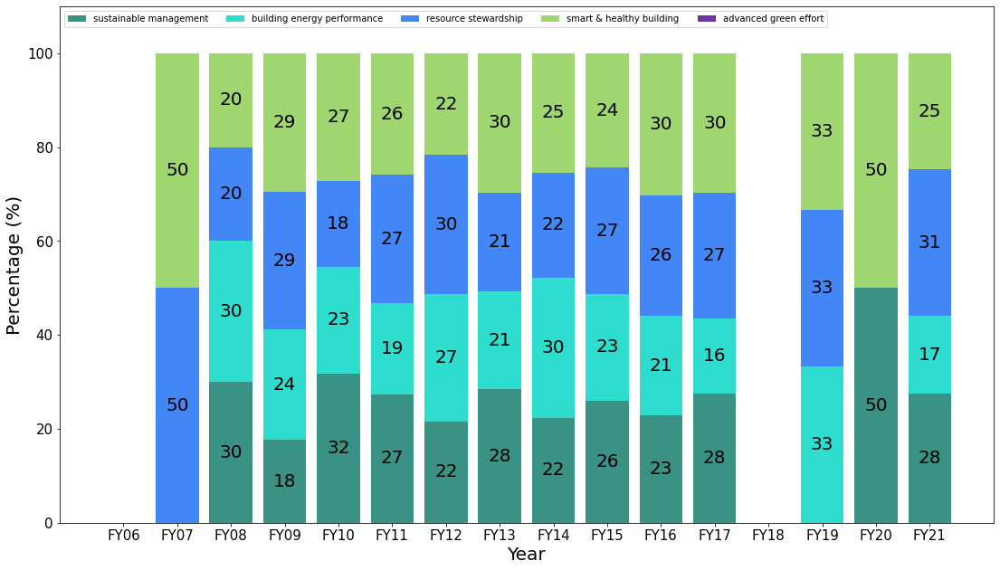

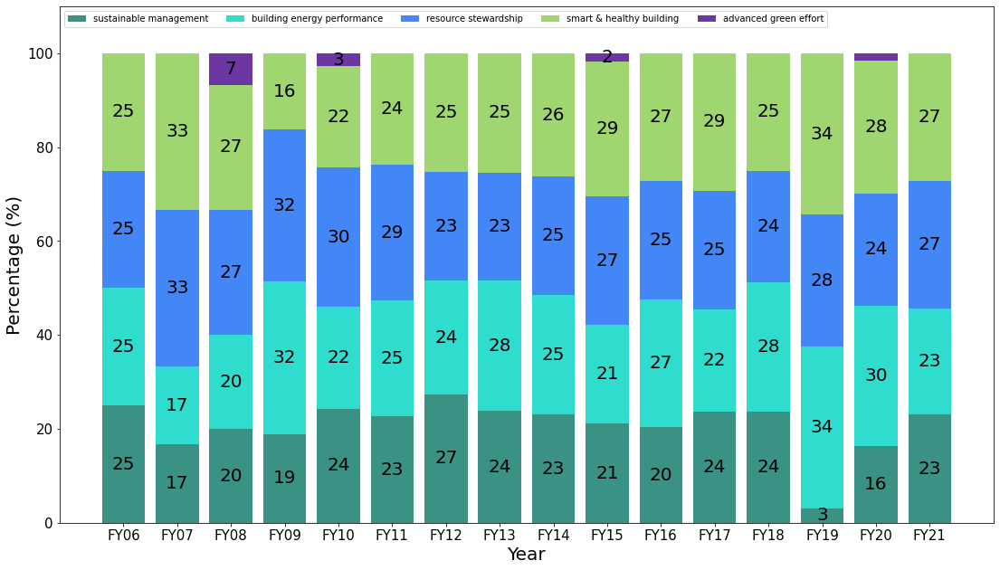

In [78]:
def plot_bar_main_cat_grouped(*award_name):
    dic_main_cats = {"sustainable management": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "building energy performance": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "resource stewardship": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "smart & healthy building": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "advanced green effort": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0}}

    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']
    
    stat_info = ''

    if not award_name:
        interested_data = data
    elif award_name == "Green Mark Gold":
        interested_data = data[data["award"] == "Green Mark Gold"].append(data[data["award"] == "Green Mark Gold (Positive Energy)"])
    else:
        interested_data = data[data["award"].str.contains(award_name[0])]
    for _,row in interested_data.iterrows():
        year = row["fy"]
        for mc in row["main_category_grouped"]:
            dic_main_cats[mc][year] += 1

    dic_main_cats_short = {}
    for y in dic_main_cats:
        dic_main_cats_short[y] = list(dic_main_cats[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    plt.ylim(top=110)
#     plt.title(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings grouped",\
#              fontsize=25)
    print(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings grouped")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Percentage (%)", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    plt.ylim(top=110)
    bottom = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    total_each_year = list(np.sum(list(dic_main_cats_short.values()), axis=0))
    n = 0

    stat_info += (f"{'All' if not award_name else award_name[0]} buildings:\n")
    for y in dic_main_cats_short:
        y_vals = dic_main_cats_short[y]
        y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
        y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        stat_info += (
            f"{y}\nMean: {sum(y_vals_normalised)/len(y_vals_normalised)}\nStandard Deviation: {statistics.stdev(y_vals)}\n"
        )
        plt.bar(ay_names, y_vals_normalised, bottom=bottom, label=main_cats_names[n], color=cats_colours[y])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals_normalised))
        n += 1
        for i in range(len(ay_names)):
            v = y_vals_normalised[i]
            if v == 0 or round(v) == 0 or round(v) == 1:
                continue
            else:
                gap = y_vals_normalised[i]/2
                plt.text(ay_names[i], bottom[i] - gap, f"{round(y_vals_normalised[i])}", fontsize=f_size, ha="center", va="center")

    plt.legend(loc='upper left', ncol=n)
    print(stat_info)
    return stat_info

plot_bar_main_cat_grouped()    
for a in awards_names:
    plot_bar_main_cat_grouped(a)

Adoption rate of categories for all certified buildings
Adoption rate of categories for Green Mark Certified certified buildings
Adoption rate of categories for Green Mark Gold certified buildings
Adoption rate of categories for Green Mark Gold Plus certified buildings
Adoption rate of categories for Green Mark Platinum certified buildings


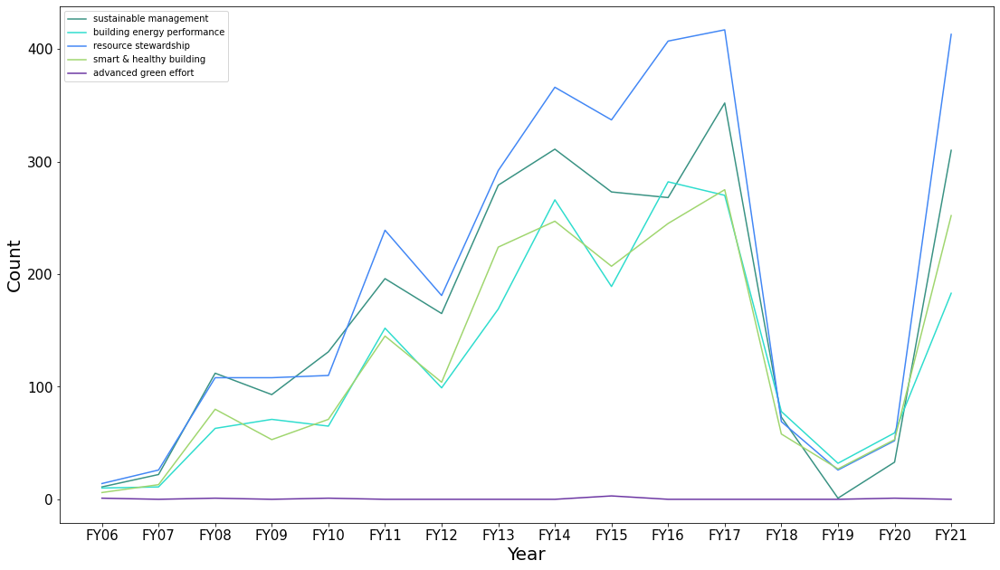

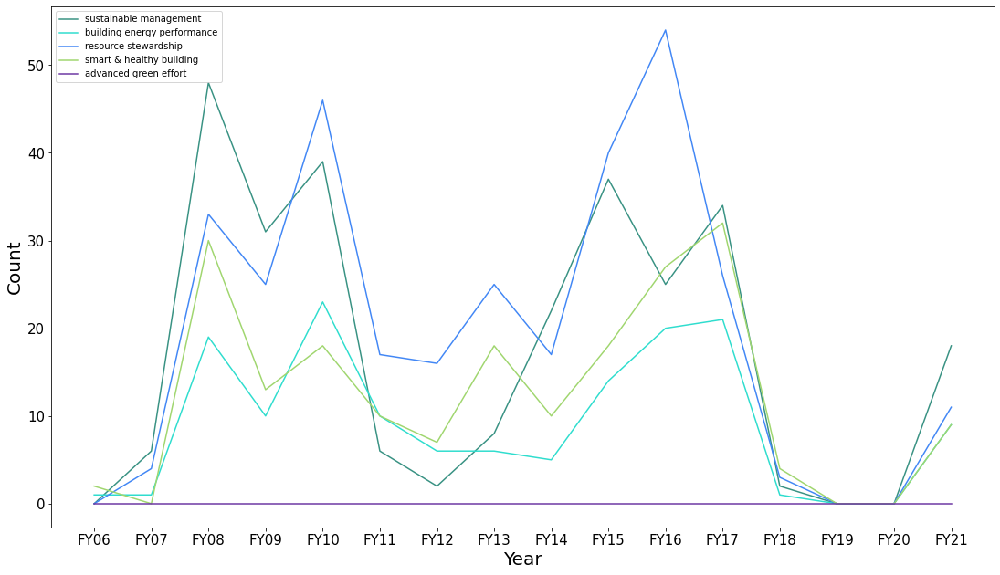

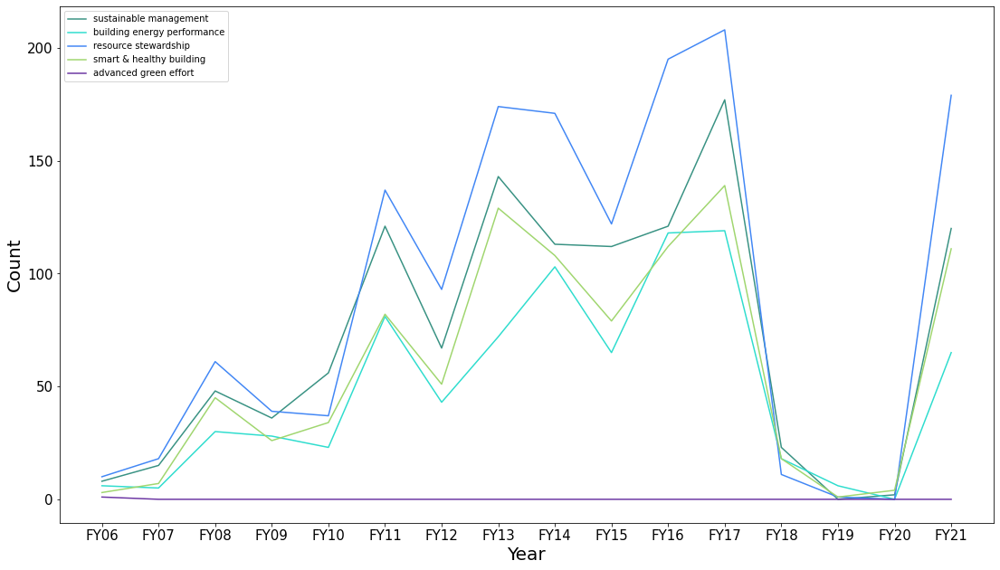

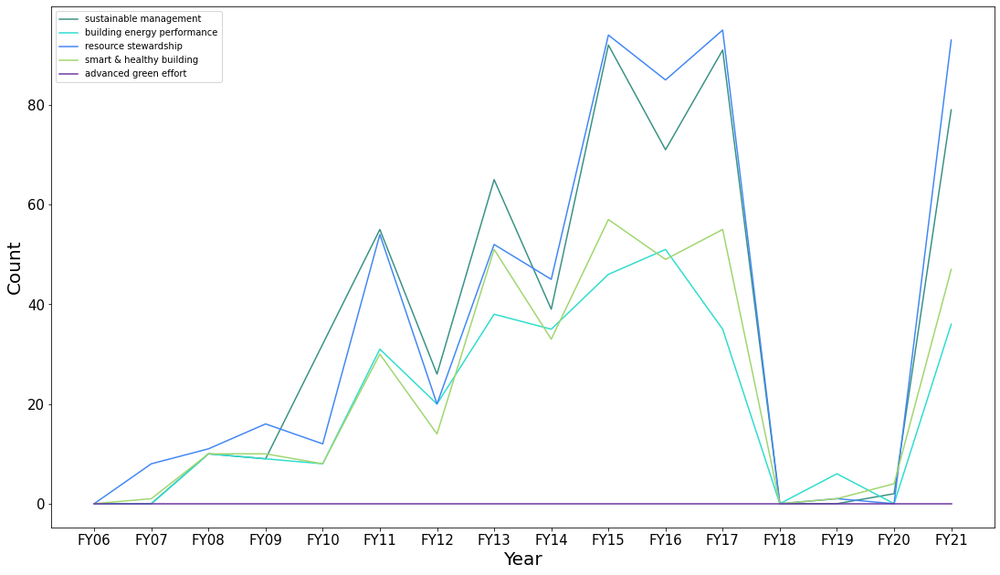

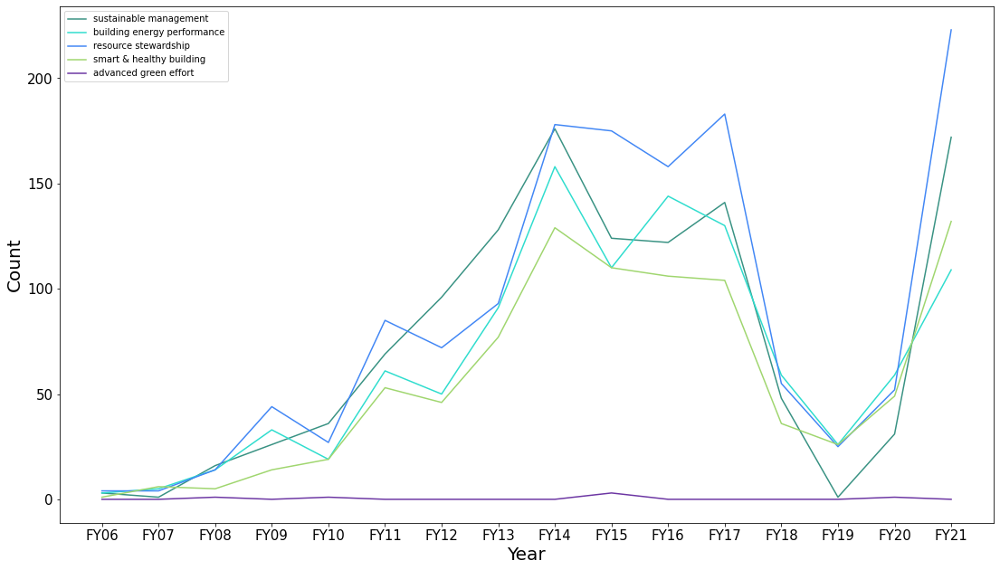

In [79]:
def plot_line_main_cat(*award_name):
    dic_main_cats = {"sustainable management": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "building energy performance": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "resource stewardship": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "smart & healthy building": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0},
                 "advanced green effort": {"FY06": 0, "FY07": 0, "FY08": 0, "FY09": 0, "FY10": 0, "FY11": 0, "FY12": 0, "FY13": 0, "FY14": 0, "FY15": 0, "FY16": 0, "FY17": 0, "FY18": 0, "FY19": 0, "FY20": 0, "FY21": 0}}

    ay_names = ['FY06', 'FY07', 'FY08', 'FY09', 'FY10', 'FY11', 'FY12', 'FY13', 'FY14', 'FY15', 'FY16', 'FY17', 'FY18', 'FY19', 'FY20', 'FY21']
    
    main_cats_names = ['sustainable management', 'building energy performance', 'resource stewardship', 'smart & healthy building', 'advanced green effort']

    if not award_name:
        interested_data = data
    elif award_name == "Green Mark Gold":
        interested_data = data[data["award"] == "Green Mark Gold"].append(data[data["award"] == "Green Mark Gold (Positive Energy)"])
    else:
        interested_data = data[data["award"].str.contains(award_name[0])]
    for _,row in interested_data.iterrows():
        year = row["fy"]
        for mc in row["main_category"]:
            dic_main_cats[mc][year] += 1

    dic_main_cats_short = {}
    for y in dic_main_cats:
        dic_main_cats_short[y] = list(dic_main_cats[y].values())

    fig,ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
#     plt.title(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings",\
#              fontsize=25)
    print(f"Adoption rate of categories for {'all' if not award_name else award_name[0]} certified buildings")
    plt.xlabel("Year", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    n = 0
    for y in dic_main_cats_short:
        y_vals = dic_main_cats_short[y]
#         y_vals_normalised = list(map(lambda x,y: x/y*100, y_vals, total_each_year))
#         y_vals_normalised = list(np.nan_to_num(y_vals_normalised))
        plt.plot(ay_names, y_vals, label=main_cats_names[n], color=cats_colours[y])
        n += 1

    plt.legend(loc='upper left', ncol=1)

plot_line_main_cat()
for a in awards_names:
    plot_line_main_cat(a)

## With uncategorised features

# Sankey diagram for green feature categories

In [80]:
def sankey_dict_ungrouped():
    """
    creates a dictionary called "link" to pass in to the sankey function later
    this dict is for ungrouped main categories for the buildings
    """
    # these are the important keys for the link dict
    link = {"source": [], "target": [], "value": [],\
           "color": ["rgb(57,146,131)", "rgb(47,221,206)", "#4287f5", "rgb(160,214,111)", "rgb(108,54,163)"]}
    # "color" represents the colour for each branch
    # colour of nodes will be passed in to the sankey function later

    source_value = 0 # assign a number for the initial node (in this case, 0 represents all buildings)
    link["source"] = [source_value] * 5 # add 5 branches from node 0 into the link dict (one branch to each category)
    
    target_dict = {'sustainable management': 0, 'building energy performance': 0, 'resource stewardship': 0,\
                   'smart & healthy building': 0, 'advanced green effort': 0}
    
    target_value = 1
    # assign a number for each target (each category), 1 is sustainable management
    for k in target_dict:
        link["target"].append(target_value) # add the target nodes to the dictionary
        target_value += 1 # change the target number for the different category, 2 is building energy performance and so on

    for _,row in data.iterrows():
        main_cats = row["main_category"]
        for mc in (main_cats):
            target_dict[mc] += 1 # add the count of categories into target_dict from iterating through the main dataset
    
    # target_dict values will be the the values list for the link dict
    link["value"] = list(target_dict.values())
    return link

In [81]:
link_ungrouped = sankey_dict_ungrouped()

main_cat_names = ["sustainable management", "building energy performance", "resource stewardship", "smart & healthy building", "advanced green effort"]

def main_cat_distribution_ungrouped():
    total_value = sum(link_ungrouped["value"]) # total count 
    label = [f"all buildings"] # labels for the initial node

    # create labels for the other nodes (the categories) in format "category: count"
    for i in range(len(main_cat_names)):
        cat_name = main_cat_names[i]
        val = link_ungrouped["value"][i]
        label.append(f"{cat_name}: {val}")

    # plot the sankey
    # snap arrangement to make the nodes rearrangeable using the mouse
    # set green as the colour of initial node
    # for the other nodes, the colours are the same as the branches
    # "link" argument is the link dictionary created from the previous function
    fig = go.Figure(data=[go.Sankey(arrangement="snap",
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(color = "black", width = 0.5),
          label=label,
          color = ["green"] + link_ungrouped["color"]
        ),
        link = link_ungrouped
        )])

#     fig.update_layout(title_text="Distribution of main categories among all buildings ungrouped", font_size=13)
    print("Distribution of main categories among all buildings ungrouped")
    fig.show()
    
main_cat_distribution_ungrouped()

Distribution of main categories among all buildings ungrouped


In [82]:
def sankey_dict_grouped():
    """
    creates a dictionary called "link" to pass in to the sankey function later
    this dict is for ungrouped main categories for the buildings
    """
    # these are the important keys for the link dict
    link = {"source": [], "target": [], "value": [],\
           "color": ["rgb(57,146,131)", "rgb(47,221,206)", "#4287f5", "rgb(160,214,111)", "rgb(108,54,163)"]}
    # "color" represents the colour for each branch
    # colour of nodes will be passed in to the sankey function later

    source_value = 0 # assign a number for the initial node (in this case, 0 represents all buildings)
    link["source"] = [source_value] * 5 # add 5 branches from node 0 into the link dict (one branch to each category)
    
    target_dict = {'sustainable management': 0, 'building energy performance': 0, 'resource stewardship': 0,\
                   'smart & healthy building': 0, 'advanced green effort': 0}
    
    target_value = 1
    # assign a number for each target (each category), 1 is sustainable management
    for k in target_dict:
        link["target"].append(target_value) # add the target nodes to the dictionary
        target_value += 1 # change the target number for the different category, 2 is building energy performance and so on

    for _,row in data.iterrows():
        main_cats = row["main_category_grouped"]
        for mc in (main_cats):
            target_dict[mc] += 1 # add the count of categories into target_dict from iterating through the main dataset
    
    # target_dict values will be the the values list for the link dict
    link["value"] = list(target_dict.values())
    return link

In [83]:
link_grouped = sankey_dict_grouped()

main_cat_names = ["sustainable management", "building energy performance", "resource stewardship", "smart & healthy building", "advanced green effort"]

def main_cat_distribution_grouped():
    total_value = sum(link_grouped["value"]) # total count 
    label = [f"all buildings"] # labels for the initial node

    # create labels for the other nodes (the categories) in format "category: count"
    for i in range(len(main_cat_names)):
        cat_name = main_cat_names[i]
        val = link_grouped["value"][i]
        label.append(f"{cat_name}: {val}")

    # plot the sankey
    # snap arrangement to make the nodes rearrangeable using the mouse
    # set green as the colour of initial node
    # for the other nodes, the colours are the same as the branches
    # "link" argument is the link dictionary created from the previous function
    fig = go.Figure(data=[go.Sankey(arrangement="snap",
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(color = "black", width = 0.5),
          label=label,
          color = ["green"] + link_grouped["color"]
        ),
        link = link_grouped
        )])

#     fig.update_layout(title_text="Distribution of main categories among all buildings grouped", font_size=13)
    print("Distribution of main categories among all buildings grouped")
    fig.show()
    
main_cat_distribution_grouped()

Distribution of main categories among all buildings grouped


# Building use for each rating

In [84]:
# dict.fromkeys(awards_names, dict.fromkeys(bdg_use_names, 0))
rating_use = {'Green Mark Certified': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'Green Mark Gold': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'Green Mark Gold Plus': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'Green Mark Platinum': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}}

for _,row in data.iterrows():
    award = award_level(row["award"])
    rating_use[award][row["building_use"]] += 1

Percentage of building use for each rating


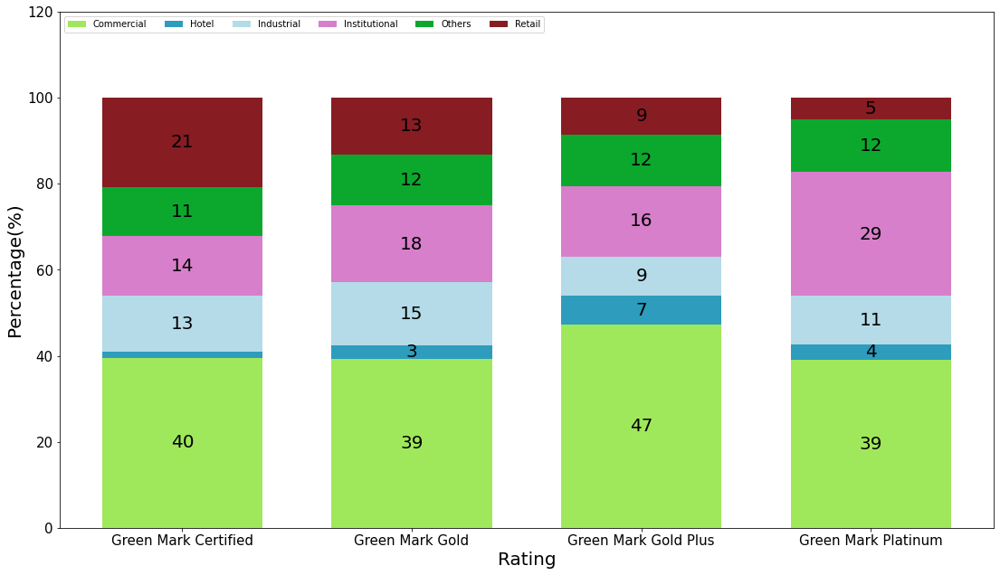

In [85]:
def plot_rating_use_stacked():
    """
    stacked plot normalised for building use for each rating
    using the rating_use dict
    """
    data = rating_use
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of building use for each rating", fontsize=25)
    print("Percentage of building use for each rating")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=120)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]/total*100
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)

plot_rating_use_stacked()

Count of building use for each rating


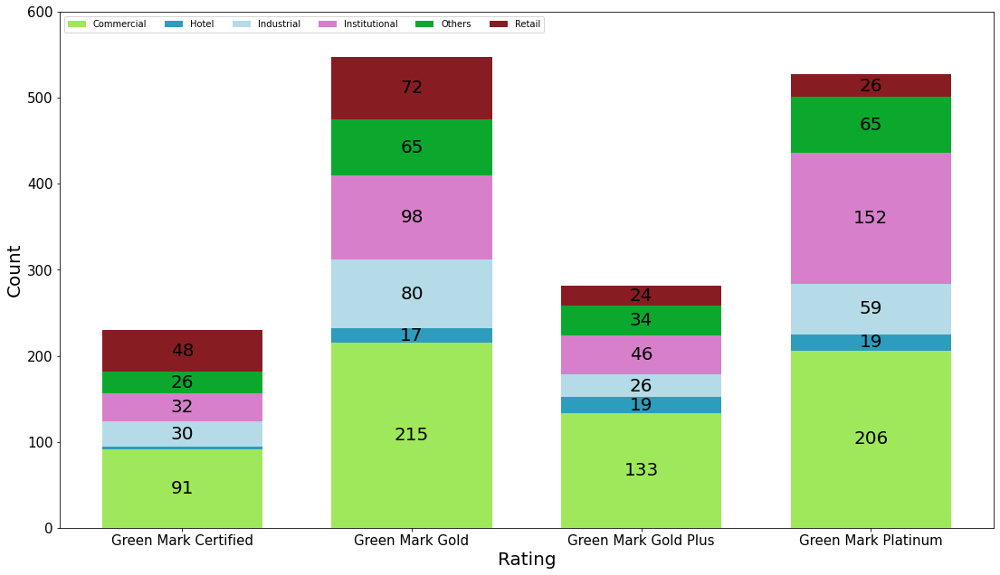

In [86]:
def plot_rating_use_stacked_unnormalised():
    """
    stacked plot unnormalised for building use for each rating
    using the rating_use dict
    """
    data = rating_use
    
    fig, ax = plt.subplots()
    
#     plt.title("Count of building use for each rating", fontsize=25)
    print("Count of building use for each rating")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.ylim(top=600)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if y_vals[i] > 5: # only show numbers is > 5
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)

plot_rating_use_stacked_unnormalised()

# Plot for main cat/rating

Percentage of main categories for each rating ungrouped


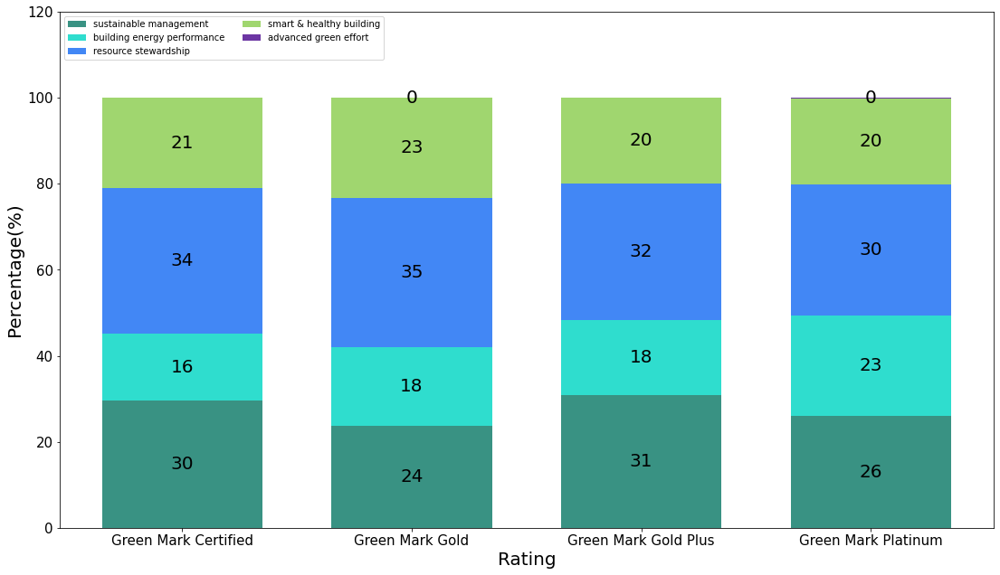

In [87]:
maincat_rating = {"Green Mark Certified": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Gold": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Gold Plus": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Platinum": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0}}
for _,row in data.iterrows():
    award = award_level(row["award"])
    for cat in row["main_category"]:
        maincat_rating[award][cat] += 1
maincat_rating

def plot_maincat_rating_stacked():
    """
    stacked bar normalised for the number of buildings in each category for each rating
    using the maincat_rating dict
    """
    data = maincat_rating
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of main categories for each rating ungrouped", fontsize=25)
    print("Percentage of main categories for each rating ungrouped")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=120)
    
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = ['sustainable management', 'building energy performance', 'resource stewardship',\
                 'smart & healthy building', 'advanced green effort']
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]/total*100
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=cats_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if y_vals[i] > 0:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//2)
    
plot_maincat_rating_stacked()

Count of main categories for each rating ungrouped


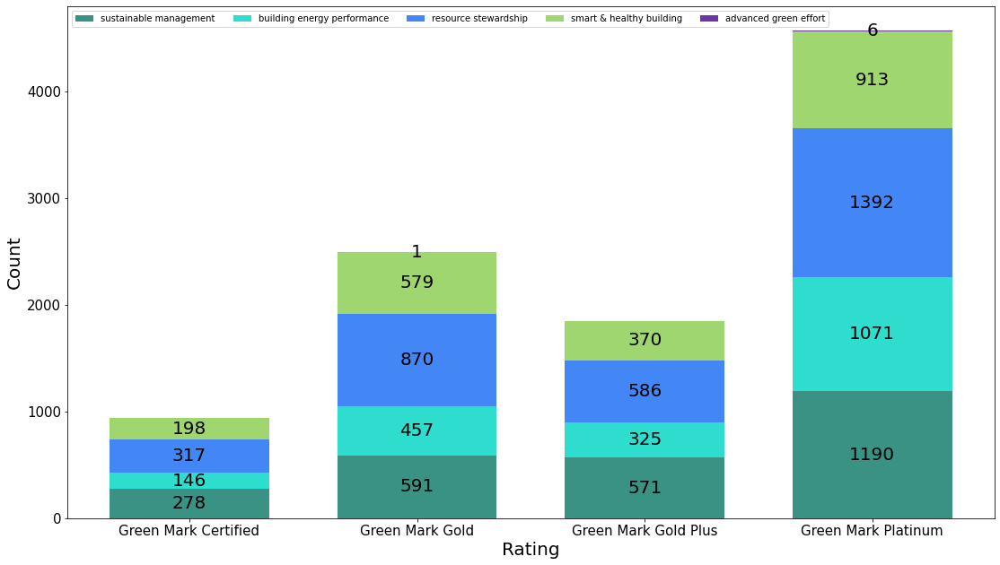

In [88]:
def plot_maincat_rating_stacked_unnormalised():
    """
    stacked bar normalised for the number of buildings in each category for each rating
    using the maincat_rating dict
    """
    data = maincat_rating
    
    fig, ax = plt.subplots()
    
#     plt.title("Count of main categories for each rating ungrouped", fontsize=25)
    print("Count of main categories for each rating ungrouped")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = ['sustainable management', 'building energy performance', 'resource stewardship',\
                 'smart & healthy building', 'advanced green effort']
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=cats_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if y_vals[i] > 0:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=6)
#     plt.ylim(top=2700)

plot_maincat_rating_stacked_unnormalised()

Percentage of main categories for each rating grouped


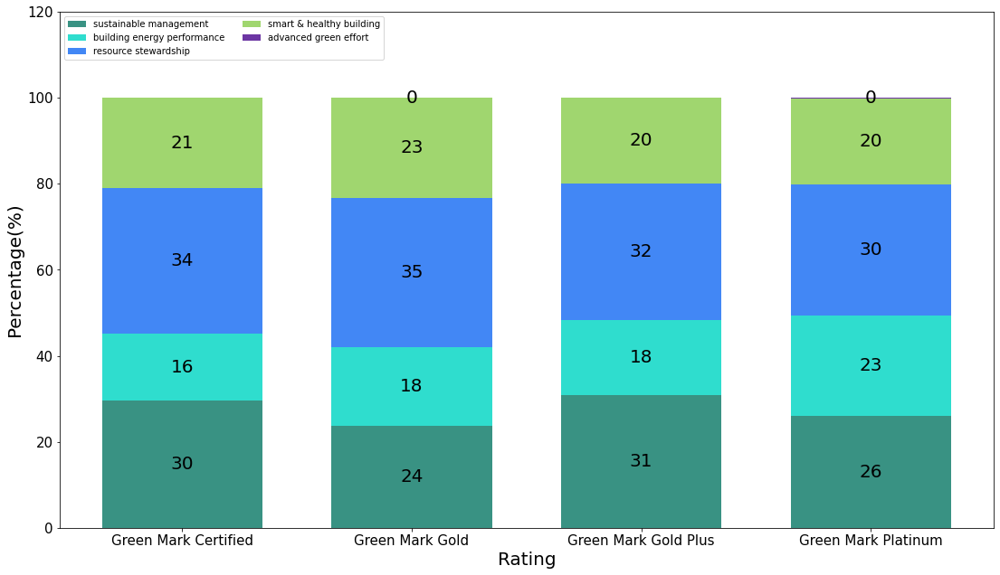

In [89]:
maincat_rating_grouped = {"Green Mark Certified": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Gold": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Gold Plus": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0},\
                 "Green Mark Platinum": {"sustainable management": 0, "building energy performance": 0, "resource stewardship": 0, "smart & healthy building": 0, "advanced green effort": 0}}
for _,row in data.iterrows():
    award = award_level(row["award"])
    for cat in row["main_category"]:
        maincat_rating_grouped[award][cat] += 1

def plot_maincat_rating_stacked_grouped():
    """
    stacked bar normalised for the number of buildings in each category for each rating
    using the maincat_rating dict
    """
    data = maincat_rating_grouped
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of main categories for each rating grouped", fontsize=25)
    print("Percentage of main categories for each rating grouped")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=120)

    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    
    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = ['sustainable management', 'building energy performance', 'resource stewardship',\
                 'smart & healthy building', 'advanced green effort']
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]/total*100
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=cats_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if y_vals[i] > 0:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//2)
    
plot_maincat_rating_stacked_grouped()

Count of main categories for each rating grouped


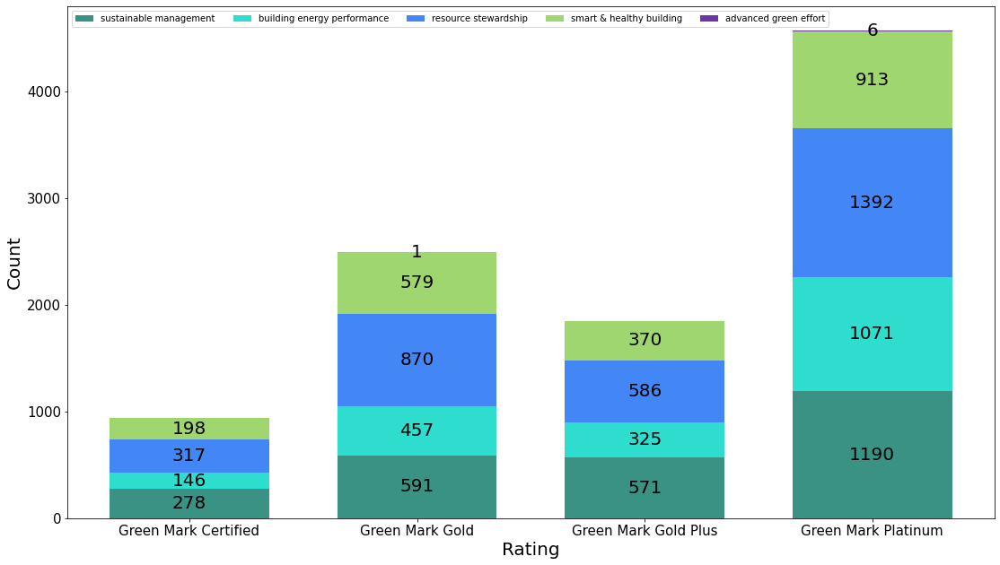

In [90]:
def plot_maincat_rating_stacked_unnormalised_grouped():
    """
    stacked bar normalised for the number of buildings in each category for each rating
    using the maincat_rating dict
    """
    data = maincat_rating_grouped
    
    fig, ax = plt.subplots()
    
#     plt.title("Count of main categories for each rating grouped", fontsize=25)
    print("Count of main categories for each rating grouped")
    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = ['sustainable management', 'building energy performance', 'resource stewardship',\
                 'smart & healthy building', 'advanced green effort']
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            value = data[y][i]
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=cats_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if y_vals[i] > 0:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=6)
#     plt.ylim(top=2700)

plot_maincat_rating_stacked_unnormalised_grouped()

# Building use for each main category

In [91]:
# dict.fromkeys(main_cat_names, dict.fromkeys(bdg_use_names, 0))

use_maincat = {'sustainable management': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'building energy performance': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'resource stewardship': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'smart & healthy building': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'advanced green effort': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}}
for _, row in data.iterrows():
    for i in row["main_category"]:
        use_maincat[i][row["building_use"]] += 1

Percentage of building type for each main category ungrouped


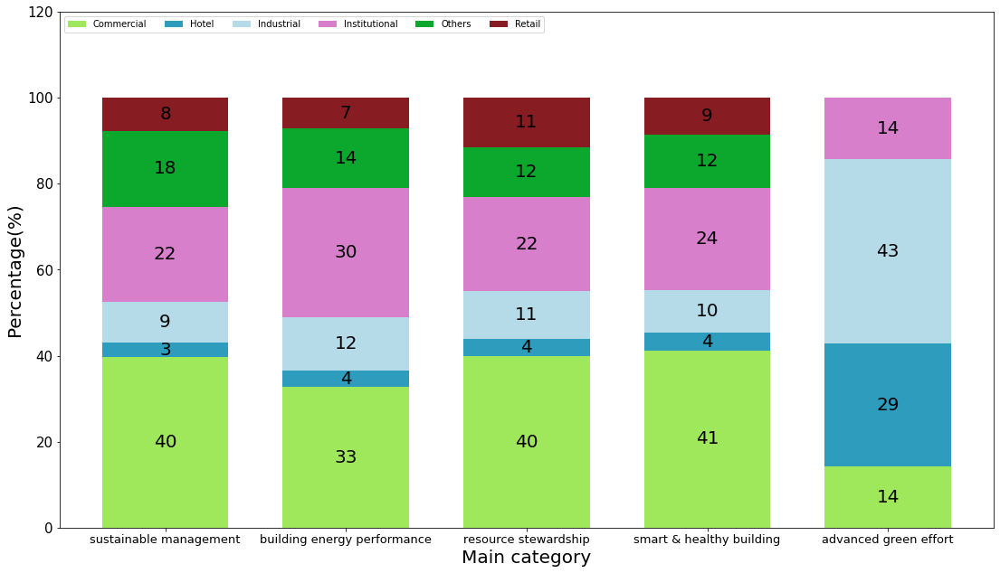

In [92]:
def plot_use_maincat_stacked():
    """
    normalised stacked bar plot for number of buildings belonging to each building type for each category
    using use_maincat dict
    """
    data = use_maincat
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of building type for each main category ungrouped", fontsize=25)
    print("Percentage of building type for each main category ungrouped")
    plt.xlabel("Main category", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=120)
    
    plt.xticks(fontsize=13) # smaller x tick size at 13
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            if total == 0:
                y_vals.append(0)
            else:
                value = data[y][i]/total*100
                y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)
    
plot_use_maincat_stacked()

Count of building type for each main category ungrouped


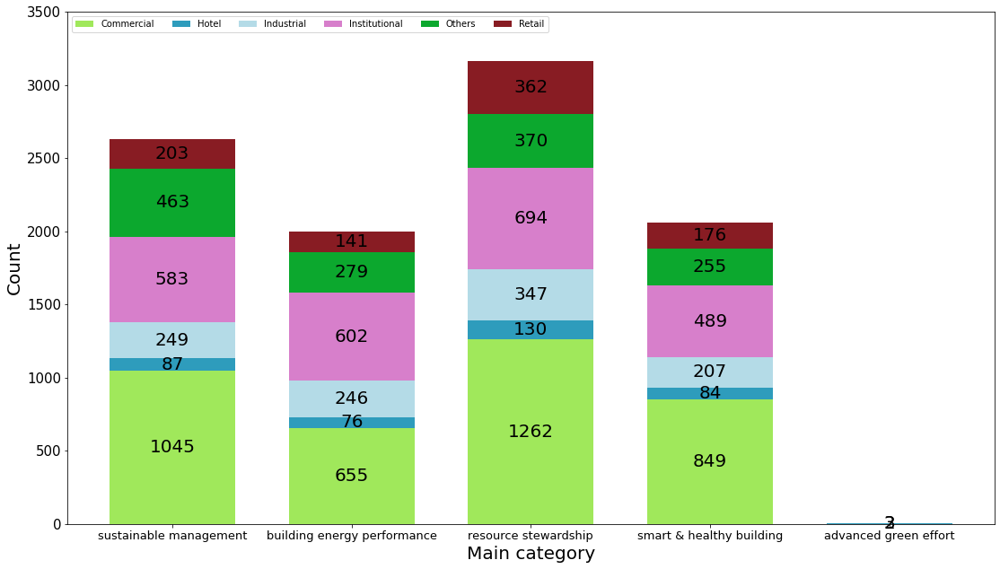

In [93]:
def plot_use_maincat_stacked_unnorm():
    """
    normalised stacked bar plot for number of buildings belonging to each building type for each category
    using use_maincat dict
    """
    data = use_maincat
    
    fig, ax = plt.subplots()
    
#     plt.title("Count of building type for each main category ungrouped", fontsize=25)
    print("Count of building type for each main category ungrouped")
    plt.xlabel("Main category", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.ylim(top=3500)
    
    plt.xticks(fontsize=13) # smaller x tick size at 13
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            value = data[y][i]
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if (y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, (y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)
    
plot_use_maincat_stacked_unnorm()

Percentage of building type for each main category grouped


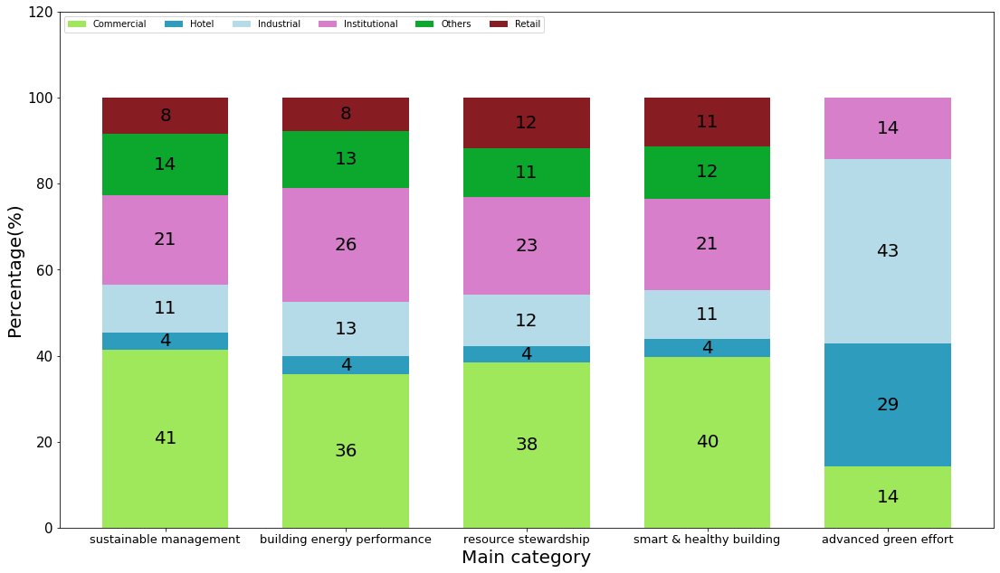

In [94]:
# dict.fromkeys(main_cat_names, dict.fromkeys(bdg_use_names, 0))

use_maincat_grouped = {'sustainable management': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'building energy performance': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'resource stewardship': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'smart & healthy building': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}, 'advanced green effort': {'Commercial': 0,  'Data Centre': 0,  'District': 0,  'Healthier Workplaces': 0,  'Hotel': 0,  'Industrial': 0,  'Infrastructure': 0,  'Institutional': 0,  'Institutional (Healthcare)': 0,  'Institutional (School)': 0,  'Laboratories': 0,  'Mixed Development': 0,  'Office': 0,  'Office Interior': 0,  'Others': 0,  'Park': 0,  'Public Housing': 0,  'Restaurant': 0,  'Retail': 0,  'Retail (Tenant)': 0,  'Supermarkets': 0}}
for _, row in data.iterrows():
    for i in row["main_category_grouped"]:
        use_maincat_grouped[i][row["building_use"]] += 1

def plot_use_maincat_stacked_grouped():
    """
    normalised stacked bar plot for number of buildings belonging to each building type for each category
    using use_maincat dict
    """
    data = use_maincat_grouped
    
    fig, ax = plt.subplots()
    
#     plt.title("Percentage of building type for each main category grouped", fontsize=25)
    print("Percentage of building type for each main category grouped")
    plt.xlabel("Main category", fontsize=f_size)
    plt.ylabel("Percentage(%)", fontsize=f_size)
    plt.ylim(top=120)
    
    plt.xticks(fontsize=13) # smaller x tick size at 13
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            total = sum(data[y].values())
            if total == 0:
                y_vals.append(0)
            else:
                value = data[y][i]/total*100
                y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, round(y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)
    
plot_use_maincat_stacked_grouped()

Count of building type for each main category grouped


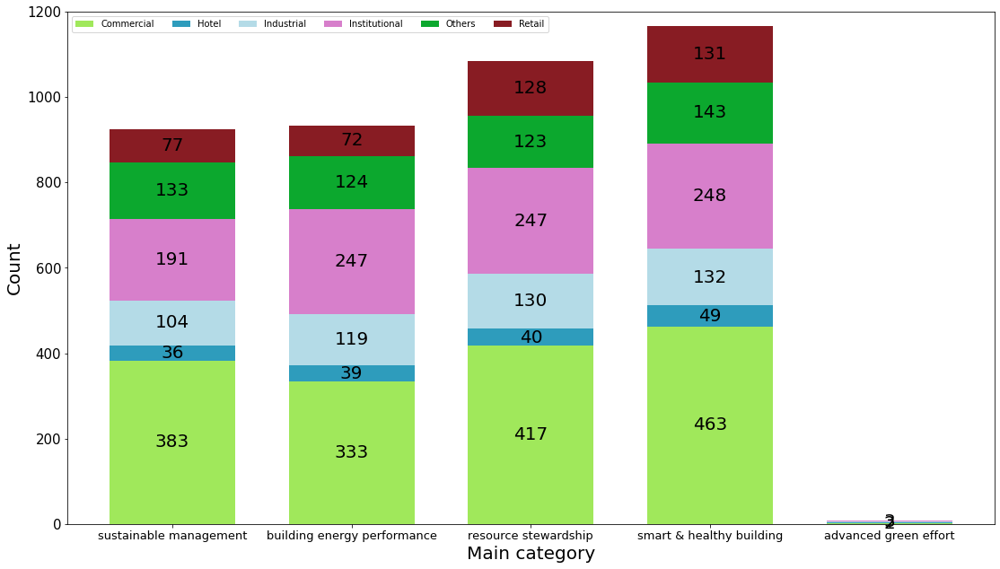

In [95]:
def plot_use_maincat_stacked_unnorm_grouped():
    """
    normalised stacked bar plot for number of buildings belonging to each building type for each category
    using use_maincat dict
    """
    data = use_maincat_grouped
    
    fig, ax = plt.subplots()
    
#     plt.title("Count of building type for each main category grouped", fontsize=25)
    print("Count of building type for each main category grouped")
    plt.xlabel("Main category", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.ylim(top=1200)
    
    plt.xticks(fontsize=13) # smaller x tick size at 13
    plt.yticks(fontsize=tick_size)

    fig.set_size_inches(18.5, 10.5)

    x_axis = list(data.keys())
    
    use_names = bdg_use_names
    
    bottom = [0] * len(data.keys())
    
    for i in use_names:
        y_vals = []
        for y in data:
            value = data[y][i]
            y_vals.append(value)
        plt.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if (y_vals[i]) > 1:
                plt.text(x_axis[i], bottom[i] - y_vals[i]/2, (y_vals[i]), fontsize=f_size, ha="center", va="center")
                
    ncol = len(data[list(data.keys())[0]])
    plt.legend(loc="upper left", ncol=ncol//3)
    
plot_use_maincat_stacked_unnorm_grouped()

## Bubble plot

In [96]:
# dict.fromkeys(main_cat_names, dict.fromkeys(awards_names, dict.fromkeys(bdg_use_names, 0)))
maincat_rating_use = {'sustainable management': {'Green Mark Certified': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold Plus': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Platinum': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0}}, 'building energy performance': {'Green Mark Certified': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold Plus': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Platinum': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0}}, 'resource stewardship': {'Green Mark Certified': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold Plus': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Platinum': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0}}, 'smart & healthy building': {'Green Mark Certified': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold Plus': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Platinum': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0}}, 'advanced green effort': {'Green Mark Certified': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Gold Plus': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0},  'Green Mark Platinum': {'Commercial': 0,   'Hotel': 0,   'Industrial': 0,   'Institutional': 0,   'Others': 0,   'Retail': 0}}}

In [97]:
for _,row in data.iterrows():
    award = award_level(row["award"])
    for c in row["main_category"]:
        maincat_rating_use[c][award][row["building_use"]] += 1
maincat_rating_use

{'sustainable management': {'Green Mark Certified': {'Commercial': 77,
   'Hotel': 2,
   'Industrial': 30,
   'Institutional': 42,
   'Others': 96,
   'Retail': 31},
  'Green Mark Gold': {'Commercial': 204,
   'Hotel': 23,
   'Industrial': 67,
   'Institutional': 134,
   'Others': 117,
   'Retail': 46},
  'Green Mark Gold Plus': {'Commercial': 261,
   'Hotel': 35,
   'Industrial': 43,
   'Institutional': 104,
   'Others': 84,
   'Retail': 44},
  'Green Mark Platinum': {'Commercial': 503,
   'Hotel': 27,
   'Industrial': 109,
   'Institutional': 303,
   'Others': 166,
   'Retail': 82}},
 'building energy performance': {'Green Mark Certified': {'Commercial': 31,
   'Hotel': 3,
   'Industrial': 41,
   'Institutional': 30,
   'Others': 25,
   'Retail': 16},
  'Green Mark Gold': {'Commercial': 139,
   'Hotel': 17,
   'Industrial': 67,
   'Institutional': 114,
   'Others': 45,
   'Retail': 75},
  'Green Mark Gold Plus': {'Commercial': 113,
   'Hotel': 28,
   'Industrial': 35,
   'Institution

In [98]:
# use_colours = {"airport": "#3588d1", "data centre": "#00FFFF", "dormitory": "#4cada6", "educational/research": "#165f28", "government/security": "#2ad27f", "hospital/clinic": "#8fb856", "hotel": "#ffb5f6", "industrial": "#fe707d", "mixed": "#9e211d", "office/commercial": "#ebaa8c", "recreational/culture": "#9a6d56", "residential": "#f79302"}

In [99]:
def bubble_plot(dic):
    """
    bubble plot showing the number of buildings in each category from each rating, grouped by the building use
    using the maincat_rating_use dict
    x-axis: categories
    y_axis: rating level
    hue: building use
    """
    # set the position for each category in the x-axis
    x_axis = {'sustainable management': 0,
     'building energy performance': 20000,
     'resource stewardship': 40000,
     'smart & healthy building': 60000,
     'advanced green effort': 80000}
    
    # set the position for each rating in the y-axis
    y_axis = {'Green Mark Certified': 2500,
     'Green Mark Gold': 3000,
     'Green Mark Gold Plus': 3500,
     'Green Mark Platinum': 4000}

    fig, ax = plt.subplots()
    fig.set_size_inches(25.5, 15.5)
#     plt.title("Distribution of building use for every rating and main category ungrouped", fontsize=30)
    print("Distribution of building use for every rating and main category ungrouped")
    ax.set_xticks(list(x_axis.values()))
    ax.set_xticklabels(list(x_axis.keys()), fontsize=25)
    ax.set_yticks(list(y_axis.values()))
    ax.set_yticklabels(list(y_axis.keys()), fontsize=25)
    plt.ylim(top=4300, bottom=2300)

    # iterate through the maincat_rating_use dict
    for maincat, rating_use in dic.items():
        for rating, use_count in rating_use.items():
            x_pos = -9000 # default position for the initial bubble (commercial)
            total_for_rating = sum(use_count.values()) # total count for that rating for label
            add_text = True
            for use, count in use_count.items():
                # label total count for each category in each rating
                if add_text:
                    plt.text(x=x_axis[maincat], y=y_axis[rating]-170, s=total_for_rating, va="center", ha="center", fontsize=25)
                    add_text = False
                # add vertical line to separate the categories
                plt.vlines(x=x_axis[maincat]+10000, ymin=2200, ymax=4400, alpha=0.01, linestyles="dotted")
                # plot the bubbles where the size is based on the count
                plt.scatter(x=x_axis[maincat] + x_pos, y=y_axis[rating], s=count*5, alpha=0.8, color=use_colours[use])
                # label the bubbles if count > 30 or category is advanced green effort (to make it look less sparse for AGE)
                if count > 30 or (maincat=="advanced green effort" and count > 0):
                    plt.text(x=x_axis[maincat] + x_pos, y=y_axis[rating]-75, s=count, va="center", ha="center", fontsize=20, rotation=60)
                x_pos += 3000 # change x position (40 counts to the right) for the next bubble
    
    # add legend for the different colours for each bdg use
    top_legend_elements = []
    for name,col in use_colours.items():
        top_legend_elements.append(Line2D([0], [0], marker='o', color='w', label=name, markerfacecolor=col, alpha=0.8, markersize=30))
                       
    # add legend for the size representation at the side
    side_legend_elements =  [Line2D([0], [0], marker='o', color='w', label='10', markerfacecolor='#fe707d', alpha=0.5, markersize=10),\
                       Line2D([0], [0], marker='o', color='w', label='100', markerfacecolor='#fe707d', alpha=0.5, markersize=30),\
                       Line2D([0], [0], marker='o', color='w', label='300', markerfacecolor='#fe707d', alpha=0.5, markersize=50),\
                       Line2D([0], [0], marker='o', color='w', label='1000', markerfacecolor='#fe707d', alpha=0.5, markersize=70),]

    ax.add_artist(ax.legend(handles=top_legend_elements, loc='upper left', ncol=6, fontsize=29))
    # side_legend = ax.legend(handles=side_legend_elements, loc='center right', bbox_to_anchor=(1.10,0.5), labelspacing=3.5, title="No. of\nbuildings", fontsize=15)
    side_legend = ax.legend(handles=side_legend_elements, loc='center right', labelspacing=3.5, title="No. of\nbuildings", fontsize=15)
    
    plt.setp(side_legend.get_title(),fontsize=20, va="center")
    
    labels=['Sustainable\nManagement', 'Building\nEnergy\nPerformance', 'Resource\nStewardship', 'Smart &\nHealthy\nBuilding', 'Advanced\nGreen\nEffort']
    ax.set_xticklabels(labels)
    
    y_labels=['     Certified', 'Gold', 'Gold Plus', 'Platinum']
    ax.set_yticklabels(y_labels)
    
    plt.xlabel("Main Category", fontsize=30)
    plt.ylabel("Green Mark Rating", fontsize=30)
    
    plt.tight_layout()
    plt.savefig("bubble_plot.pdf")

Distribution of building use for every rating and main category ungrouped


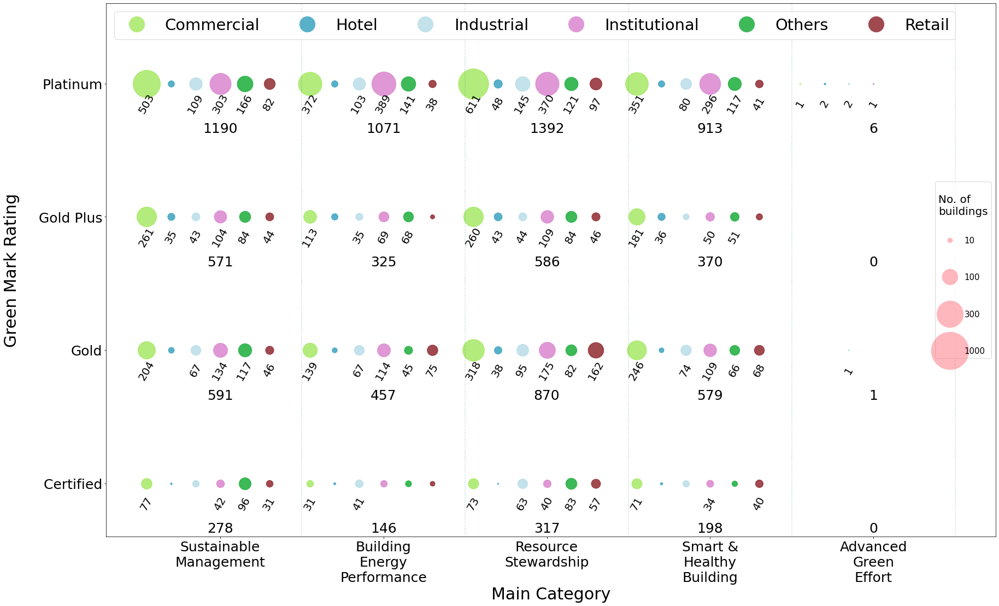

In [100]:
bubble_plot(maincat_rating_use)

# Rating for each building type (website given)

In [101]:
def rating_for_each_bdg_type(bdg_type):
    dic = {bdg_type: {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        if row["building_use"] == bdg_type:
            dic[bdg_type][award] += 1
                
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    y_vals = list(dic[bdg_type].values())
    x_axis = list(dic[bdg_type].keys())
    
    plt.bar(x_axis, y_vals, color=use_colours[bdg_type])    

    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Count", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
#     plt.title(f"Rating for building type: {bdg_type}", fontsize=25)
    print(f"Rating for building type: {bdg_type}")

    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.05, y_vals[i], fontdict=dict(fontsize=f_size), ha="center")

Rating for building type: Commercial
Rating for building type: Hotel
Rating for building type: Industrial
Rating for building type: Institutional
Rating for building type: Others
Rating for building type: Retail


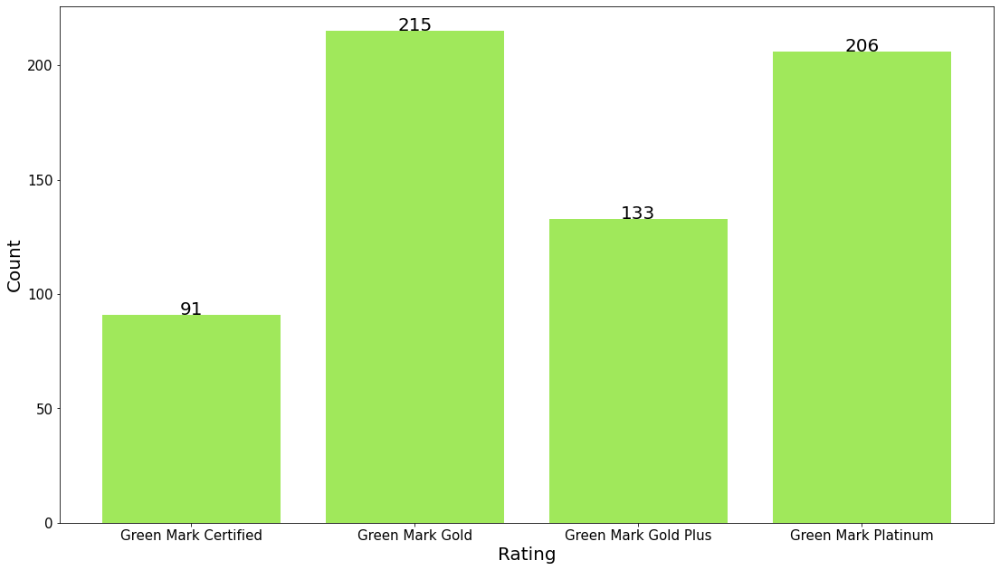

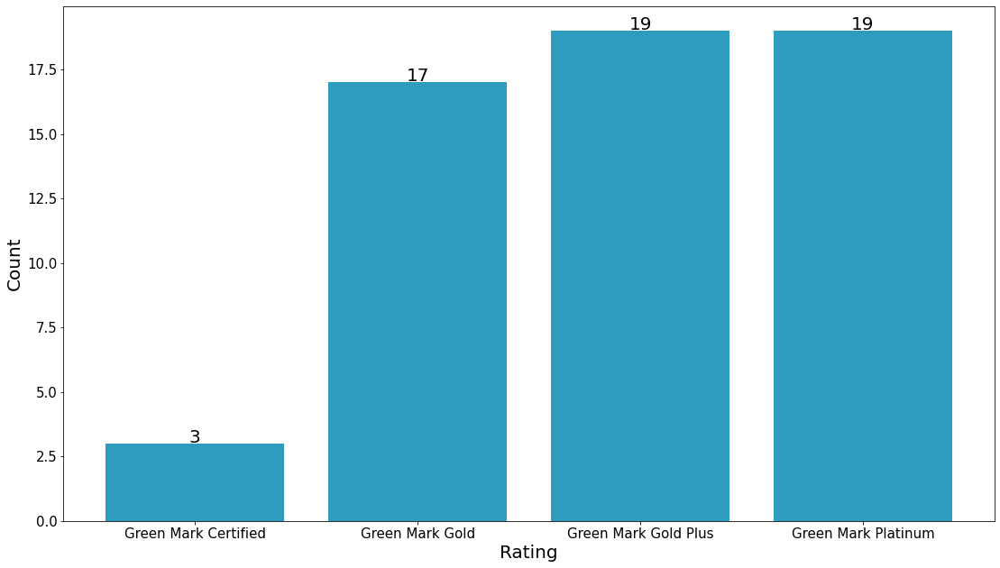

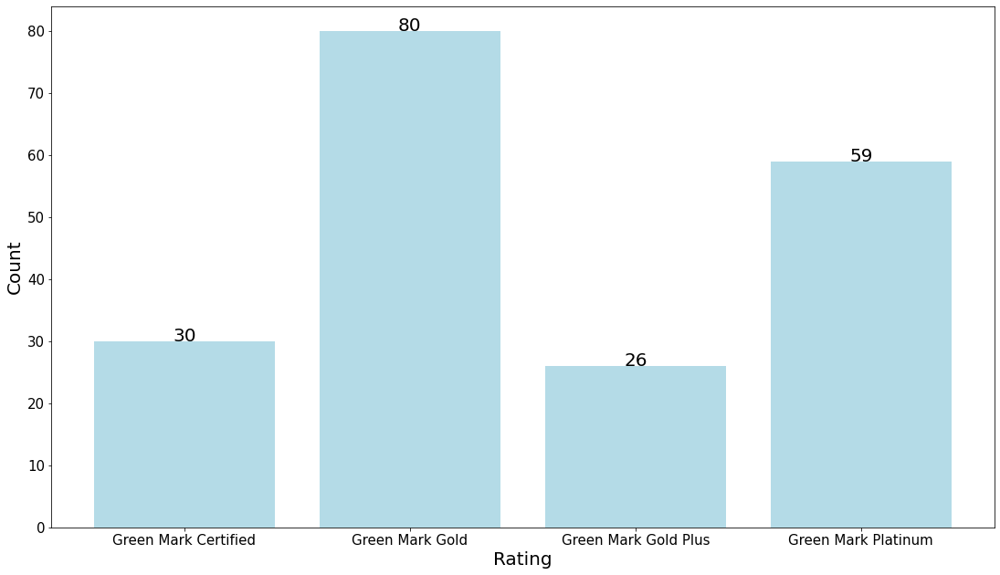

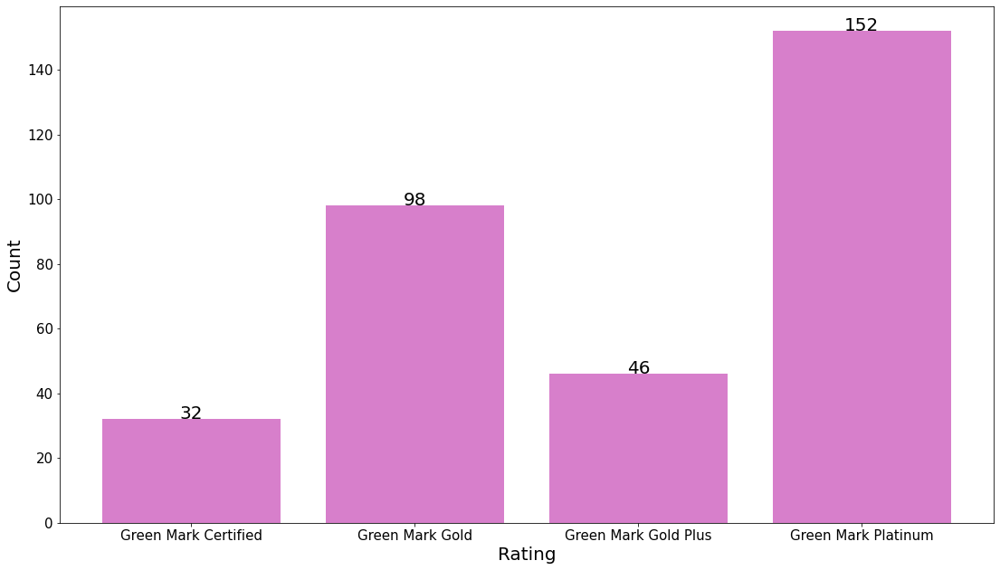

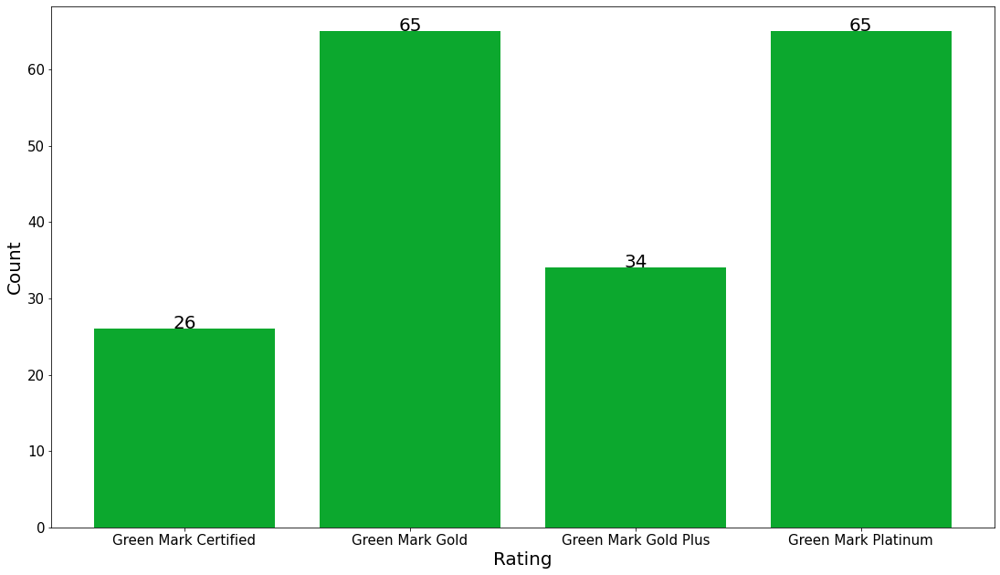

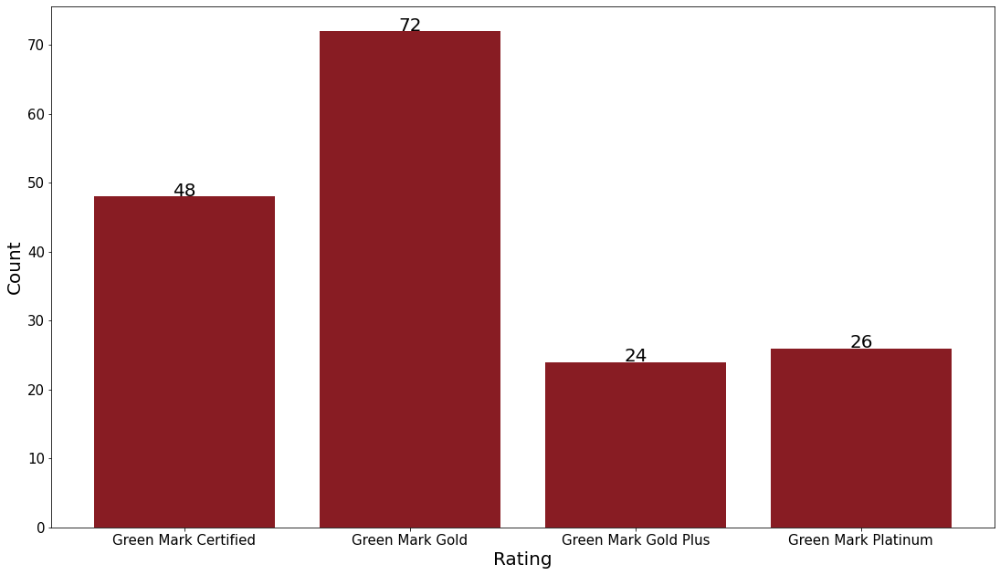

In [102]:
for t in bdg_use_names:
    rating_for_each_bdg_type(t)

In [103]:
data.columns

Index(['bca_id', 'building', 'award', 'fy', 'gfa', 'address', 'postal_code',
       'district', 'developer', 'architect', 'structural_eng', 'me_eng',
       'land_cons', 'qs', 'main_contractor', 'fac_mgt', 'esd_cons',
       'esco_cons', 'green_cons', 'description', 'green_features',
       'building_use', 'building_use_manual', 'main_category',
       'main_category_grouped', 'new_or_existing'],
      dtype='object')

# Multiplot

Possible plots:

* Percentage of awards
* Percentage of GFA (according to range)
* Percentage of building type
* Percentage of districts
* Percentage of main categories (ungrouped)
* Percentage of main categories (grouped)

Percentage of Buildings for Each GM Rating


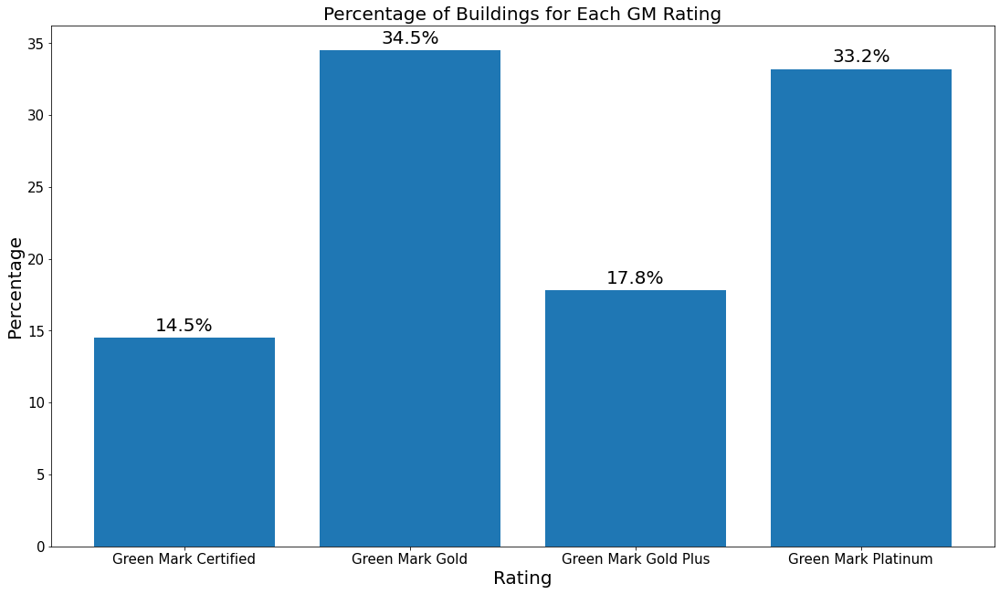

In [104]:
def overall_by_rating():
    dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        dic[award] += 1
                
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())
    
    plt.bar(x_axis, y_vals)   

    plt.xlabel("Rating", fontsize=f_size)
    plt.ylabel("Percentage", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    ax.set_title("Percentage of Buildings for Each GM Rating", fontsize=f_size)
    print("Percentage of Buildings for Each GM Rating")

    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i] + 0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size), ha="center")
        
overall_by_rating()

Percentage of Buildings for Each GM Rating


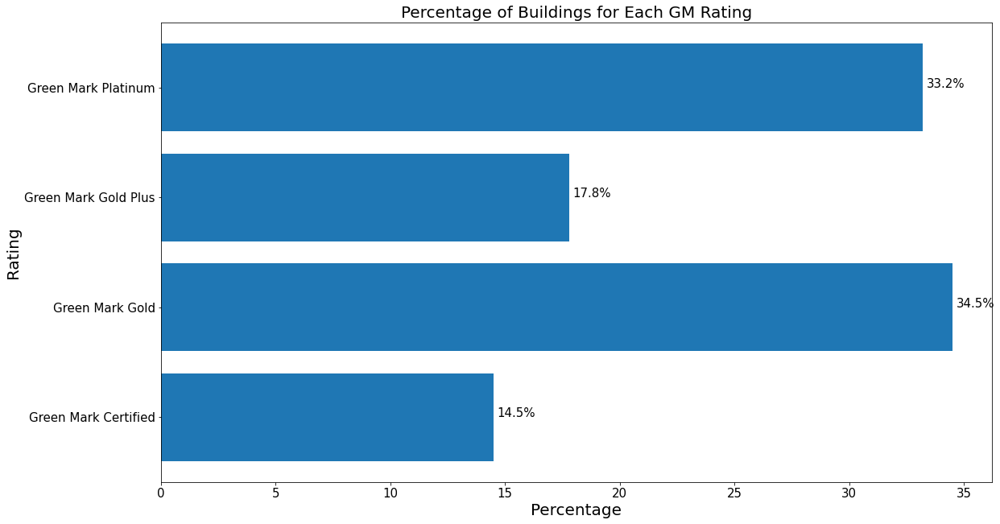

In [105]:
def overall_by_rating():
    dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        dic[award] += 1
                
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())
    
    plt.barh(x_axis, y_vals)   

    plt.xlabel("Percentage", fontsize=f_size)
    plt.ylabel("Rating", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    ax.set_title("Percentage of Buildings for Each GM Rating", fontsize=f_size)
    print("Percentage of Buildings for Each GM Rating")
    
    for i in range(len(x_axis)):
        plt.text(y_vals[i]+1, i, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")
        
overall_by_rating()

Percentage of Buildings for Each Building Type


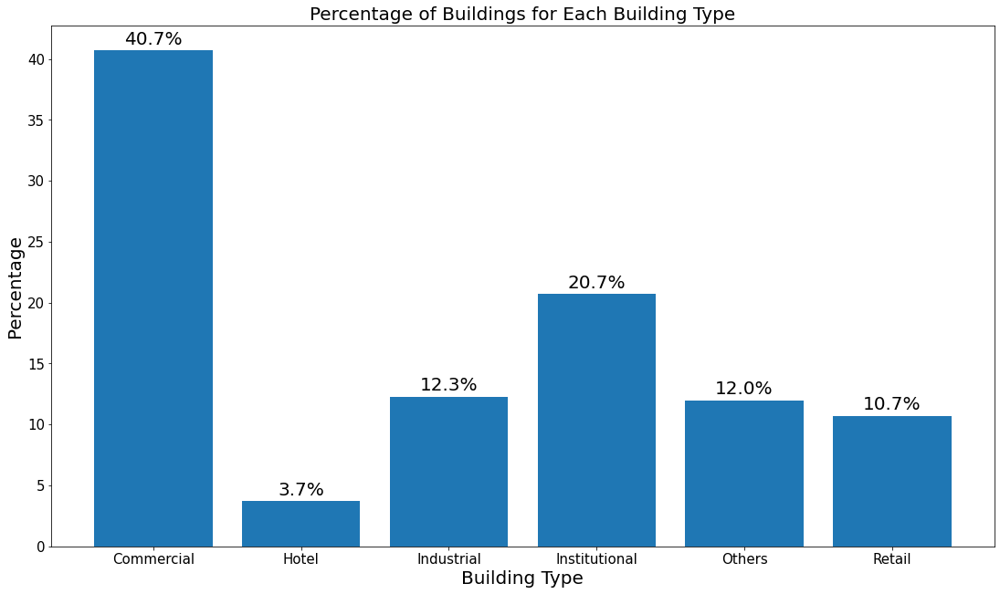

In [106]:
def overall_by_type():
    dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
    for _,row in data.iterrows():
        bdg_type = row['building_use']
        dic[bdg_type] += 1
                
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())
    
    plt.bar(x_axis, y_vals)   

    plt.xlabel("Building Type", fontsize=f_size)
    plt.ylabel("Percentage", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    ax.set_title(f"Percentage of Buildings for Each Building Type", fontsize=f_size)
    print(f"Percentage of Buildings for Each Building Type")

    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size), ha="center")

overall_by_type()

Percentage of Buildings for Each Building Type


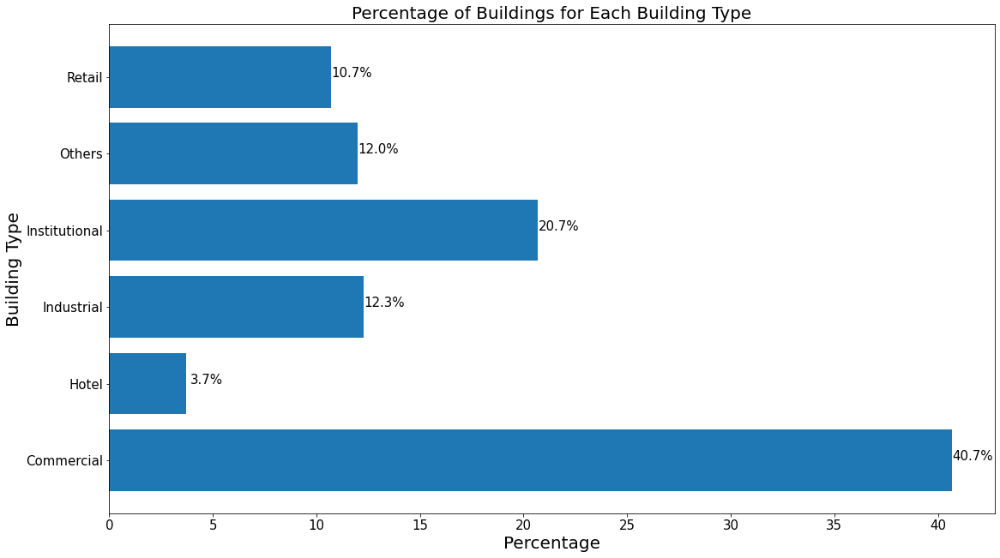

In [107]:
def overall_by_type():
    dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
    for _,row in data.iterrows():
        bdg_type = row['building_use']
        dic[bdg_type] += 1
                
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    
    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())
    
    plt.barh(x_axis, y_vals)   

    plt.xlabel("Percentage", fontsize=f_size)
    plt.ylabel("Building Type", fontsize=f_size)
    plt.xticks(fontsize=tick_size)
    plt.yticks(fontsize=tick_size)
    ax.set_title(f"Percentage of Buildings for Each Building Type", fontsize=f_size)
    print(f"Percentage of Buildings for Each Building Type")

    for i in range(len(x_axis)):
        plt.text(y_vals[i]+1, i, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

overall_by_type()

In [108]:
# create a temp dataframe for the GFA plot

data['gfa'] = pd.to_numeric(data['gfa'], errors='coerce')
data['gfa'] = data['gfa'].fillna(-1)
data['gfa'] = data['gfa'].replace(0, -1)

temp_data = data.copy()

temp_data['gfa_range'] = None
for i in temp_data.index:
    gfa = temp_data.at[i, 'gfa']
    if gfa > 400000:
        temp_data.at[i, 'gfa_range'] = '4. >400,000'
    elif gfa < 400000 and gfa >= 40000:
        temp_data.at[i, 'gfa_range'] = '3. 40,000 - 400,000'
    elif gfa < 40000 and gfa >= 10000:
        temp_data.at[i, 'gfa_range'] = '2. 10,000 - 40,000'
    elif gfa < 10000 and gfa >= 1:
        temp_data.at[i, 'gfa_range'] = '1. <10,000'
    else:
        temp_data.at[i, 'gfa_range'] = '0. No available GFA'

In [109]:
sorted([1,2,3,4,0])

[0, 1, 2, 3, 4]

In [110]:
temp_data['gfa_range']

0        2. 10,000 - 40,000
1        2. 10,000 - 40,000
2       3. 40,000 - 400,000
3       3. 40,000 - 400,000
4                1. <10,000
               ...         
1581     2. 10,000 - 40,000
1582             1. <10,000
1583             1. <10,000
1584     2. 10,000 - 40,000
1585     2. 10,000 - 40,000
Name: gfa_range, Length: 1586, dtype: object

Percentage of Buildings by GFA


<ipython-input-111-bca316739cc7>:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



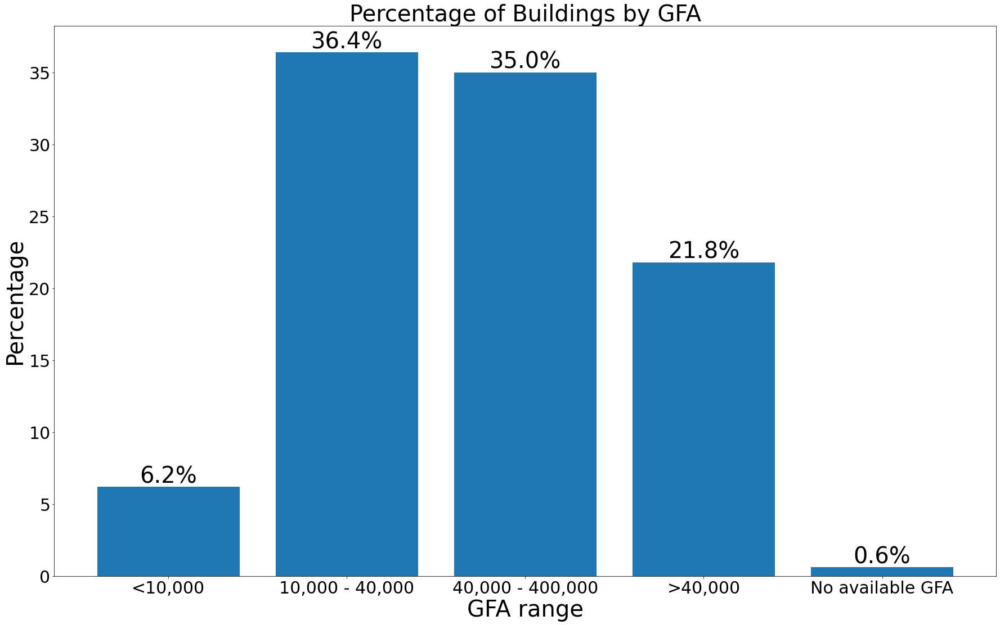

In [111]:
def gfa_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['gfa_range'] not in dic:
            dic[row['gfa_range']] = 0
        dic[row['gfa_range']] += 1
    dic = dict(sorted(dic.items()))
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("GFA range", fontsize=f_size_big)
    plt.ylabel("Percentage", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)
    labels=['<10,000', '10,000 - 40,000', '40,000 - 400,000', '>40,000', 'No available GFA']
    ax.set_xticklabels(labels)
    
    ax.set_title("Percentage of Buildings by GFA", fontsize=f_size_big)
    print("Percentage of Buildings by GFA")
    
    plt.bar(x_axis, y_vals)

gfa_plot()

<ipython-input-112-d2fabb3c14dd>:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA


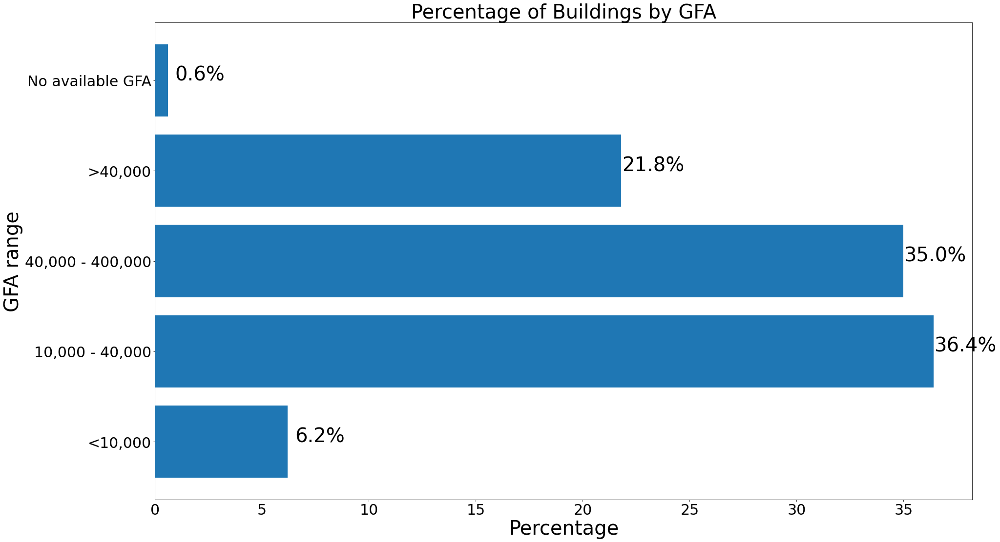

In [112]:
def gfa_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['gfa_range'] not in dic:
            dic[row['gfa_range']] = 0
        dic[row['gfa_range']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(y_vals[i]+1.5, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Percentage", fontsize=f_size_big)
    plt.ylabel("GFA range", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)
    labels=['<10,000', '10,000 - 40,000', '40,000 - 400,000', '>40,000', 'No available GFA']
    ax.set_yticklabels(labels)
    
    ax.set_title("Percentage of Buildings by GFA", fontsize=f_size_big)
    print("Percentage of Buildings by GFA")
    
    plt.barh(x_axis, y_vals)

gfa_plot()

In [113]:
dict.fromkeys(main_cat_names,link_ungrouped['value'])

{'sustainable management': [2630, 1999, 3165, 2060, 7],
 'building energy performance': [2630, 1999, 3165, 2060, 7],
 'resource stewardship': [2630, 1999, 3165, 2060, 7],
 'smart & healthy building': [2630, 1999, 3165, 2060, 7],
 'advanced green effort': [2630, 1999, 3165, 2060, 7]}

Percentage of Buildings by Main Category (Ungrouped)


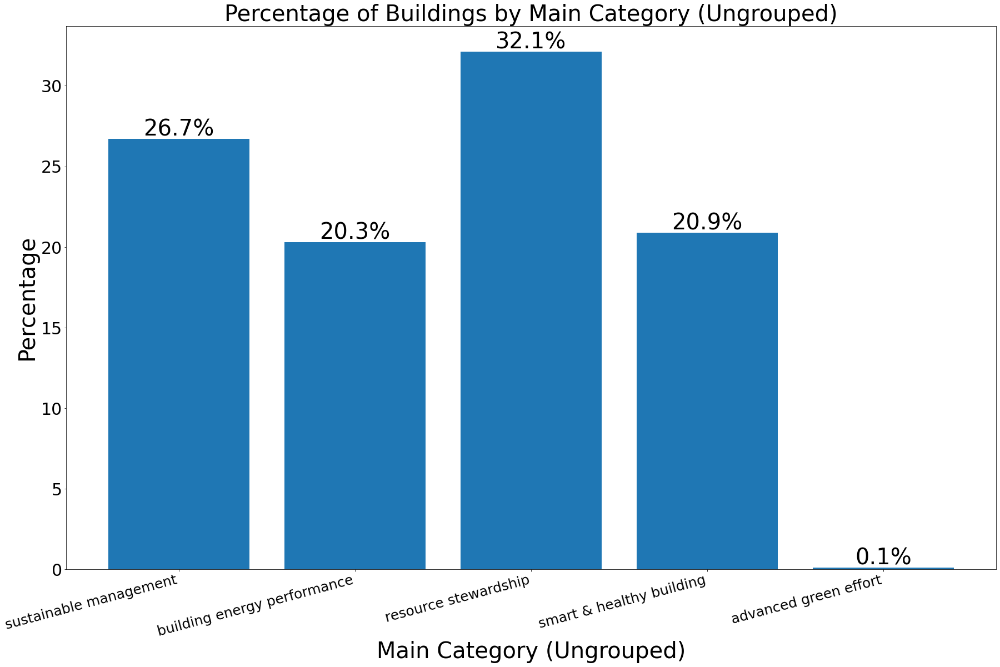

In [114]:
main_cat_ungrouped_dict = {}
for i in range(len(main_cat_names)):
    main_cat_ungrouped_dict[main_cat_names[i]] = link_ungrouped['value'][i]
main_cat_ungrouped_dict

def main_cat_ungrouped_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = main_cat_ungrouped_dict
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.2, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Main Category (Ungrouped)", fontsize=f_size_big)
    plt.ylabel("Percentage", fontsize=f_size_big)
    plt.xticks(fontsize=25, rotation=15, ha='right')
    plt.yticks(fontsize=tick_size_big)
    
    ax.set_title("Percentage of Buildings by Main Category (Ungrouped)", fontsize=f_size_big)
    print("Percentage of Buildings by Main Category (Ungrouped)")
    
    plt.bar(x_axis, y_vals)

main_cat_ungrouped_plot()

Percentage of Buildings by Main Category (Ungrouped)


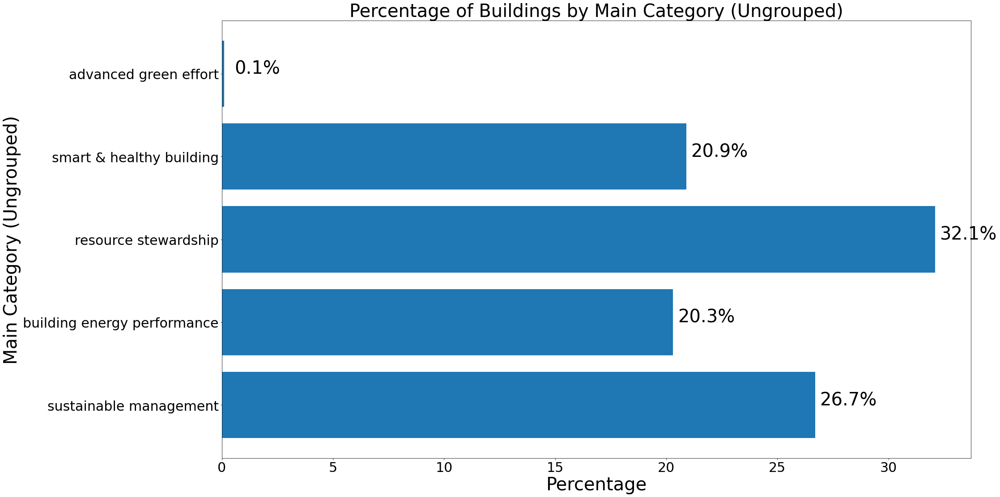

In [115]:
def main_cat_ungrouped_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = main_cat_ungrouped_dict
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(y_vals[i]+1.5, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Percentage", fontsize=f_size_big)
    plt.ylabel("Main Category (Ungrouped)", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)

    ax.set_title("Percentage of Buildings by Main Category (Ungrouped)", fontsize=f_size_big)
    print("Percentage of Buildings by Main Category (Ungrouped)")
    
    plt.barh(x_axis, y_vals)

main_cat_ungrouped_plot()

Percentage of Buildings by Main Category (Grouped)


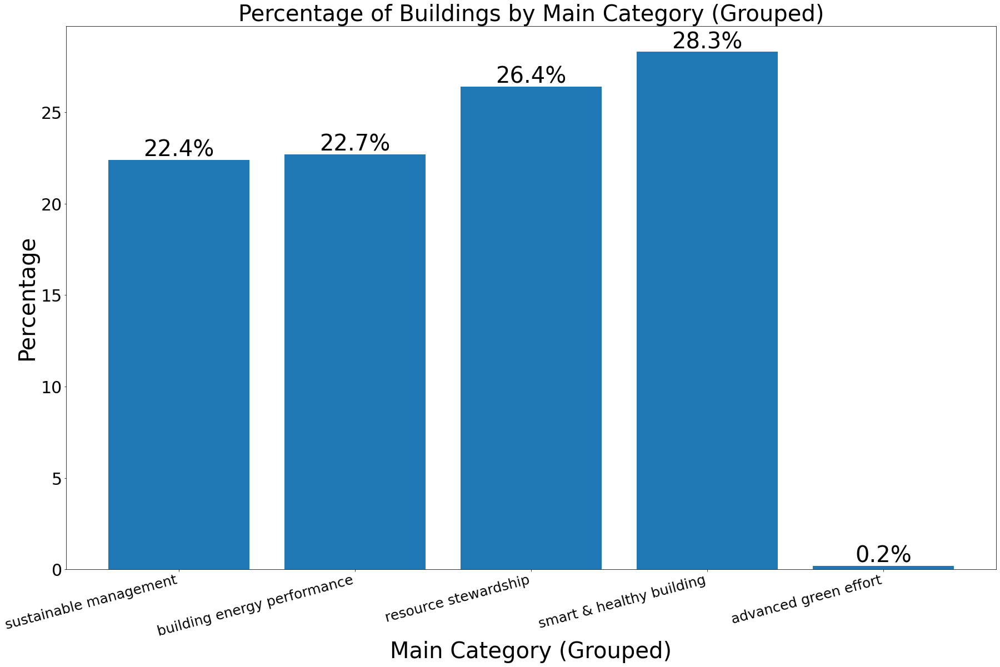

In [116]:
main_cat_grouped_dict = {}
for i in range(len(main_cat_names)):
    main_cat_grouped_dict[main_cat_names[i]] = link_grouped['value'][i]
main_cat_grouped_dict

def main_cat_grouped_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = main_cat_grouped_dict
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.2, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Main Category (Grouped)", fontsize=f_size_big)
    plt.ylabel("Percentage", fontsize=f_size_big)
    plt.xticks(fontsize=25, rotation=15, ha='right')
    plt.yticks(fontsize=tick_size_big)
    
    ax.set_title("Percentage of Buildings by Main Category (Grouped)", fontsize=f_size_big)
    print("Percentage of Buildings by Main Category (Grouped)")
    
    
    plt.bar(x_axis, y_vals)

main_cat_grouped_plot()

Percentage of Buildings by Main Category (Grouped)


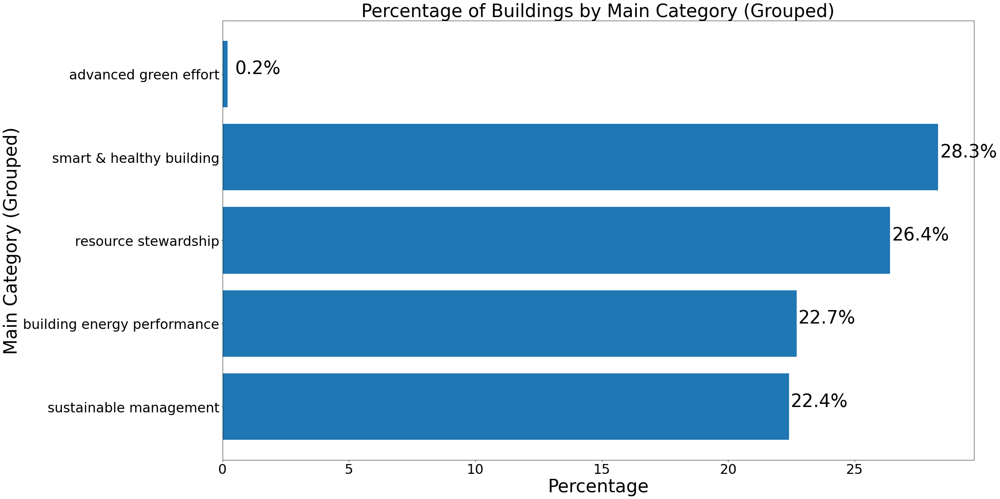

In [117]:
main_cat_grouped_dict = {}
for i in range(len(main_cat_names)):
    main_cat_grouped_dict[main_cat_names[i]] = link_grouped['value'][i]
main_cat_grouped_dict

def main_cat_grouped_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = main_cat_grouped_dict
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(y_vals[i]+1.2, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Percentage", fontsize=f_size_big)
    plt.ylabel("Main Category (Grouped)", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)
    
    ax.set_title("Percentage of Buildings by Main Category (Grouped)", fontsize=f_size_big)
    print("Percentage of Buildings by Main Category (Grouped)")
    
    plt.barh(x_axis, y_vals)

main_cat_grouped_plot()

In [118]:
data['district'] = pd.to_numeric(data['district'], errors='coerce')
data['district'] = data['district'].fillna(-1)
data['district'] = data['district'].replace('-', -1)
data['district'] = data['district'].replace(0, -1)
data['district'] = data['district'].replace(528875, -1)

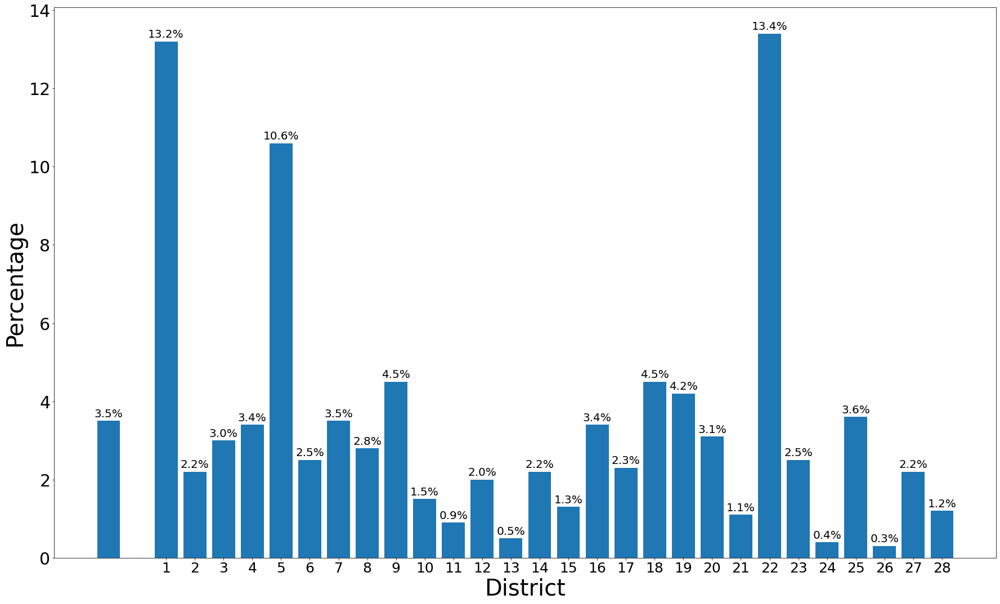

In [119]:
def district_plot():

    district_dic = {}
    for _,row in data.iterrows():
        dist = row['district']
        if dist not in district_dic:
            district_dic[dist] = 0
        district_dic[dist] += 1
    district_dic = dict(sorted(district_dic.items()))
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = district_dic
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.1, f"{y_vals[i]}%", fontdict=dict(fontsize=20), ha="center")
        
    plt.xlabel("District", fontsize=f_size_big)
    plt.ylabel("Percentage", fontsize=f_size_big)
    plt.xticks(range(1, 29), fontsize=25)
    plt.yticks(fontsize=tick_size_big)
    
    plt.bar(x_axis, y_vals)

district_plot()

New vs recertified buildings over the years (line plot)


'\nrecertified buildings over the years\n'

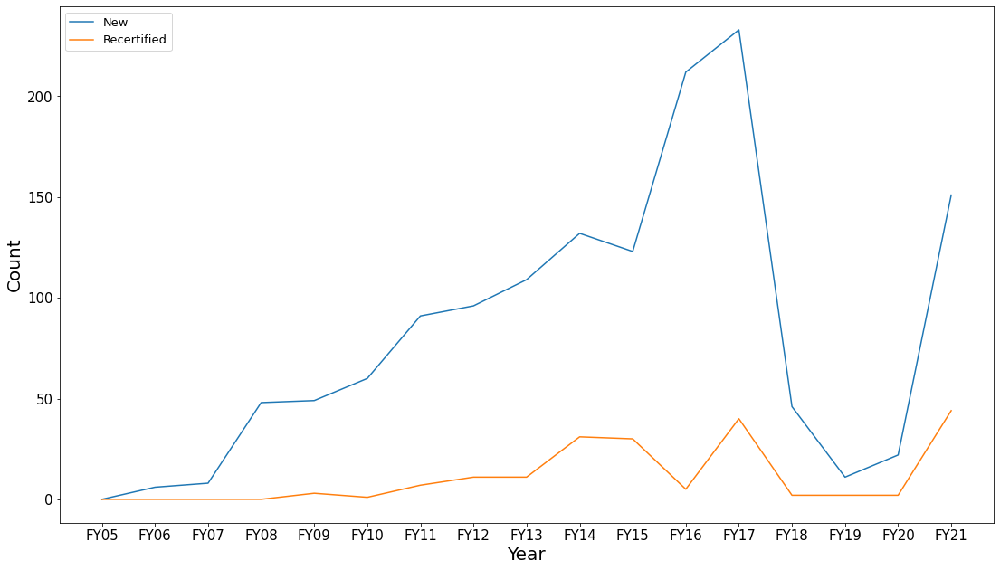

In [120]:
labels = list(d_new_existing.keys())
all_new = list(map(lambda x: x[0], d_new_existing.values()))
all_existing = list(map(lambda x: x[1], d_new_existing.values()))

fig, ax = plt.subplots()

fig.set_size_inches(18.5, 10.5)

ax.plot(labels, all_new, label="New")
ax.plot(labels, all_existing,
       label="Recertified")

#ax.set_ylabel('Count')
plt.xlabel("Year", fontsize=f_size)
    
plt.ylabel("Count", fontsize=f_size)

plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)

# ax.set_title('New vs recertified buildings over the years (line plot)', fontsize=25)
print('New vs recertified buildings over the years (line plot)')
ax.legend(loc="upper left", fontsize=13)

# if the 're certification' suffixes were kept, there would be more 'new' buildings which are actually recertified

"""
recertified buildings over the years
"""

In [121]:
data.columns

Index(['bca_id', 'building', 'award', 'fy', 'gfa', 'address', 'postal_code',
       'district', 'developer', 'architect', 'structural_eng', 'me_eng',
       'land_cons', 'qs', 'main_contractor', 'fac_mgt', 'esd_cons',
       'esco_cons', 'green_cons', 'description', 'green_features',
       'building_use', 'building_use_manual', 'main_category',
       'main_category_grouped', 'new_or_existing'],
      dtype='object')

In [122]:
data.columns

Index(['bca_id', 'building', 'award', 'fy', 'gfa', 'address', 'postal_code',
       'district', 'developer', 'architect', 'structural_eng', 'me_eng',
       'land_cons', 'qs', 'main_contractor', 'fac_mgt', 'esd_cons',
       'esco_cons', 'green_cons', 'description', 'green_features',
       'building_use', 'building_use_manual', 'main_category',
       'main_category_grouped', 'new_or_existing'],
      dtype='object')

In [123]:
# create a temp dataframe for the green features plot

temp_data['no_of_green_features'] = None
for i in temp_data.index:
    no_of_gf = len(eval(temp_data.at[i, 'green_features']))
    if no_of_gf > 10:
        temp_data.at[i, 'no_of_green_features'] = '4. >10'
    elif no_of_gf <= 10 and no_of_gf >= 5:
        temp_data.at[i, 'no_of_green_features'] = '3. 5 - 10'
    elif no_of_gf < 5 and no_of_gf >= 2:
        temp_data.at[i, 'no_of_green_features'] = '2. 2 - 4'
    elif no_of_gf < 2 and no_of_gf >= 1:
        temp_data.at[i, 'no_of_green_features'] = '1. 1 - 2'
    else:
        temp_data.at[i, 'no_of_green_features'] = '5. No available info'

In [124]:
temp_data['no_of_green_features'].unique()

array(['3. 5 - 10', '2. 2 - 4', '1. 1 - 2', '4. >10'], dtype=object)

<ipython-input-125-2107787b4ad4>:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA


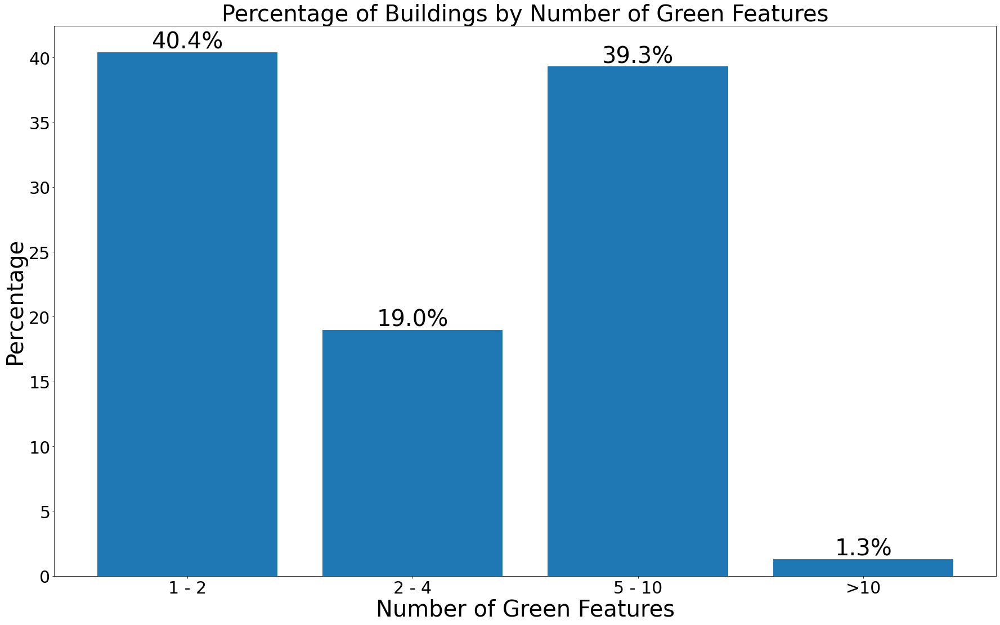

In [125]:
def green_features_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['no_of_green_features'] not in dic:
            dic[row['no_of_green_features']] = 0
        dic[row['no_of_green_features']] += 1
    dic = dict(sorted(dic.items()))
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.xlabel("Number of Green Features", fontsize=f_size_big)
    plt.ylabel("Percentage", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)
    labels=['1 - 2', '2 - 4', '5 - 10', '>10']
    ax.set_xticklabels(labels)
    
    ax.set_title("Percentage of Buildings by Number of Green Features", fontsize=f_size_big)
    print("Percentage of Buildings by GFA")
    
    plt.bar(x_axis, y_vals)

green_features_plot()

Percentage of Buildings by GFA


<ipython-input-126-d1384fcd0c94>:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



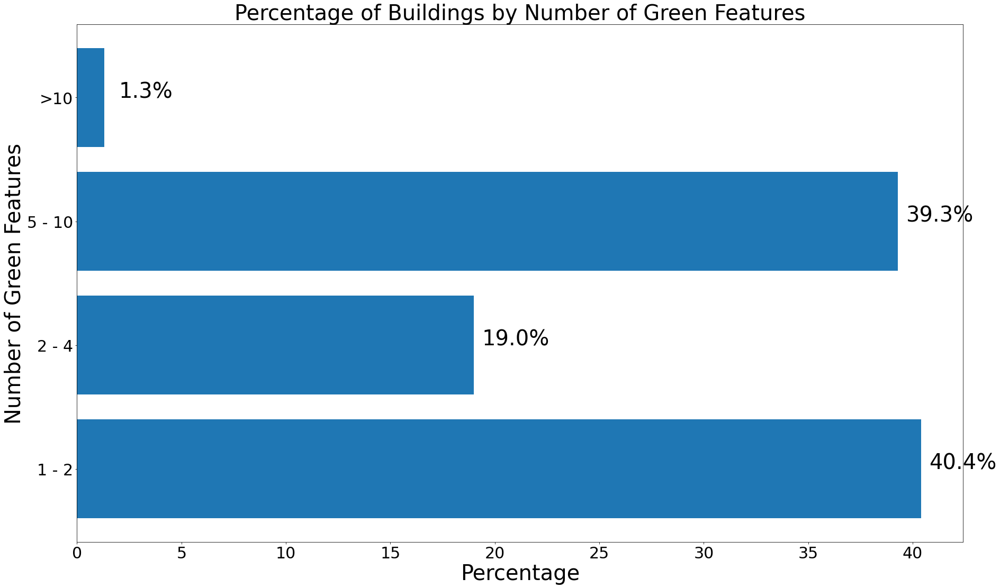

In [126]:
def green_features_plot():
    
    fig, ax = plt.subplots()
    fig.set_size_inches(30, 18)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['no_of_green_features'] not in dic:
            dic[row['no_of_green_features']] = 0
        dic[row['no_of_green_features']] += 1
    dic = dict(sorted(dic.items()))
    
    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
    
    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())
    
    for i in range(len(x_axis)):
        plt.text(y_vals[i]+2, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=f_size_big), ha="center")
        
    plt.ylabel("Number of Green Features", fontsize=f_size_big)
    plt.xlabel("Percentage", fontsize=f_size_big)
    plt.xticks(fontsize=tick_size_big)
    plt.yticks(fontsize=tick_size_big)
    labels=['1 - 2', '2 - 4', '5 - 10', '>10']
    ax.set_yticklabels(labels)
    
    ax.set_title("Percentage of Buildings by Number of Green Features", fontsize=f_size_big)
    print("Percentage of Buildings by GFA")
    
    plt.barh(x_axis, y_vals)

green_features_plot()

Percentage of Buildings for Each GM Rating
Percentage of Buildings for Each Building Type


<ipython-input-127-ace3e48cf83e>:69: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-127-ace3e48cf83e>:135: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-127-ace3e48cf83e>:159: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA
Percentage of Building Types for Each GM Rating
Percentage of Buildings by Main Category (Ungrouped)
Percentage of Buildings by GFA


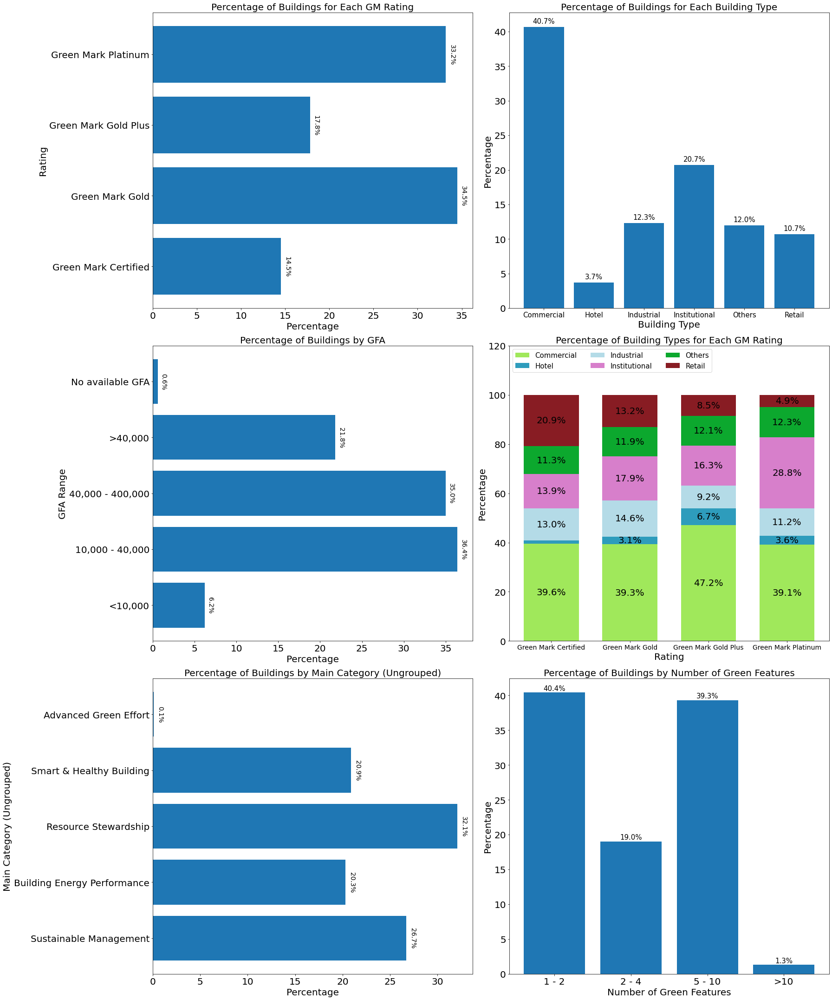

In [127]:
def multiplot():

    fig, axs = plt.subplots(3, 2)
    fig.set_size_inches(25, 30)

    # First Plot (% by rating)
    dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        dic[award] += 1

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    axs[0,0].barh(x_axis, y_vals)   

    axs[0,0].set_title("Percentage of Buildings for Each GM Rating", fontsize=20)
    print("Percentage of Buildings for Each GM Rating")
    axs[0,0].set_ylabel("Rating", fontsize=f_size)
    axs[0,0].set_xlabel("Percentage", fontsize=f_size)
    axs[0,0].tick_params(axis='x', which='major', labelsize=20)
    axs[0,0].tick_params(axis='y', which='major', labelsize=20)

    for i in range(len(x_axis)):
        axs[0,0].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

    # Second Plot (% by bdg type)
    dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
    for _,row in data.iterrows():
        bdg_type = row['building_use']
        dic[bdg_type] += 1

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    axs[0,1].bar(x_axis, y_vals)   
    axs[0,1].set_title(f"Percentage of Buildings for Each Building Type", fontsize=20)
    print(f"Percentage of Buildings for Each Building Type")
    axs[0,1].set_xlabel("Building Type", fontsize=f_size)
    axs[0,1].set_ylabel("Percentage", fontsize=f_size)
    axs[0,1].tick_params(axis='x', which='major', labelsize=15)
    axs[0,1].tick_params(axis='y', which='major', labelsize=20)

    for i in range(len(x_axis)):
        axs[0,1].text(x_axis[i], y_vals[i]+0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

    # Third Plot (% by GFA)
    dic = {}
    for _,row in temp_data.iterrows():
        if row['gfa_range'] not in dic:
            dic[row['gfa_range']] = 0
        dic[row['gfa_range']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[1,0].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

    labels=['<10,000', '10,000 - 40,000', '40,000 - 400,000', '>40,000', 'No available GFA']
    axs[1,0].set_yticklabels(labels)

    axs[1,0].set_title("Percentage of Buildings by GFA", fontsize=20)
    print("Percentage of Buildings by GFA")
    axs[1,0].set_ylabel("GFA Range", fontsize=f_size)
    axs[1,0].set_xlabel("Percentage", fontsize=f_size)
    axs[1,0].tick_params(axis='x', which='major', labelsize=20)
    axs[1,0].tick_params(axis='y', which='major', labelsize=20)

    axs[1,0].barh(x_axis, y_vals)

    # Fourth Plot (new vs recertified bdgs over the years)
    interested_data = rating_use

    axs[1,1].set_title("Percentage of Building Types for Each GM Rating", fontsize=20)
    print("Percentage of Building Types for Each GM Rating")
    axs[1,1].set_xlabel("Rating", fontsize=f_size)
    axs[1,1].set_ylabel("Percentage", fontsize=f_size)
    axs[1,1].set_ylim(top=120)
    axs[1,1].tick_params(axis='x', which='major', labelsize=14)
    axs[1,1].tick_params(axis='y', which='major', labelsize=20)

    x_axis = list(interested_data.keys())

    use_names = bdg_use_names

    bottom = [0] * len(interested_data.keys())

    for i in use_names:
        y_vals = []
        for y in interested_data:
            total = sum(interested_data[y].values())
            value = interested_data[y][i]/total*100
            y_vals.append(value)
        axs[1,1].bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                axs[1,1].text(x_axis[i], bottom[i] - y_vals[i]/2, f"{round(y_vals[i], 1)}%", fontsize=f_size, ha="center", va="center")

    ncol = len(interested_data[list(interested_data.keys())[0]])
    axs[1,1].legend(loc="upper left", ncol=3, fontsize=15)


    # Fifth Plot (% by main cat ungrouped)
    dic = main_cat_ungrouped_dict

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[2,0].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

    axs[2,0].set_title("Percentage of Buildings by Main Category (Ungrouped)", fontsize=20)
    axs[2,0].set_ylabel("Main Category (Ungrouped)", fontsize=f_size)
    axs[2,0].set_xlabel("Percentage", fontsize=f_size)
    print("Percentage of Buildings by Main Category (Ungrouped)")

    axs[2,0].tick_params(axis='both', which='major', labelsize=20)
    axs[2,0].barh(x_axis, y_vals)
    labels=['Sustainable Management', 'Building Energy Performance', 'Resource Stewardship', 'Smart & Healthy Building', 'Advanced Green Effort']
    axs[2,0].set_yticklabels(labels)

    # Sixth Plot (No. of green features)
    dic = {}
    for _,row in temp_data.iterrows():
        if row['no_of_green_features'] not in dic:
            dic[row['no_of_green_features']] = 0
        dic[row['no_of_green_features']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[2,1].text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

    axs[2,1].set_xlabel("Number of Green Features", fontsize=f_size)
    axs[2,1].set_ylabel("Percentage", fontsize=f_size)
    labels=['1 - 2', '2 - 4', '5 - 10', '>10']
    axs[2,1].set_xticklabels(labels)

    axs[2,1].set_title("Percentage of Buildings by Number of Green Features", fontsize=20)
    print("Percentage of Buildings by GFA")

    axs[2,1].tick_params(axis='both', which='major', labelsize=20)

    plt.bar(x_axis, y_vals)
    
    plt.tight_layout()
    
    plt.savefig('multiplot.pdf')

    
multiplot()

In [128]:
# def multiplot():

#     fig, axs = plt.subplots(2, 3)
#     fig.set_size_inches(30, 25)

#     # First Plot (% by rating)
#     dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
#     for _,row in data.iterrows():
#         award = award_level(row['award'])
#         dic[award] += 1

#     total = sum(dic.values())
#     y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
#     x_axis = list(dic.keys())

#     axs[0,0].barh(x_axis, y_vals)   

#     axs[0,0].set_title("Percentage of Buildings for Each GM Rating", fontsize=20)
#     print("Percentage of Buildings for Each GM Rating")
#     axs[0,0].set_ylabel("Rating", fontsize=f_size)
#     axs[0,0].set_xlabel("Percentage", fontsize=f_size)
#     axs[0,0].tick_params(axis='x', which='major', labelsize=20)
#     axs[0,0].tick_params(axis='y', which='major', labelsize=20)

#     for i in range(len(x_axis)):
#         axs[0,0].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

#     # Second Plot (% by bdg type)
#     dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
#     for _,row in data.iterrows():
#         bdg_type = row['building_use']
#         dic[bdg_type] += 1

#     total = sum(dic.values())
#     y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
#     x_axis = list(dic.keys())

#     axs[0,1].bar(x_axis, y_vals)   
#     axs[0,1].set_title(f"Percentage of Buildings for Each Building Type", fontsize=20)
#     print(f"Percentage of Buildings for Each Building Type")
#     axs[0,1].set_xlabel("Building Type", fontsize=f_size)
#     axs[0,1].set_ylabel("Percentage", fontsize=f_size)
#     axs[0,1].tick_params(axis='x', which='major', labelsize=15)
#     axs[0,1].tick_params(axis='y', which='major', labelsize=20)

#     for i in range(len(x_axis)):
#         axs[0,1].text(x_axis[i], y_vals[i]+0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

#     # Third Plot (% by GFA)
#     dic = {}
#     for _,row in temp_data.iterrows():
#         if row['gfa_range'] not in dic:
#             dic[row['gfa_range']] = 0
#         dic[row['gfa_range']] += 1
#     dic = dict(sorted(dic.items()))

#     dic_percent = {}
#     total = sum(dic.values())
#     for k, v in dic.items():
#         dic_percent[k] = round(v/total*100, 1)

#     x_axis = list(dic_percent.keys())
#     y_vals = list(dic_percent.values())

#     for i in range(len(x_axis)):
#         axs[1,0].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

#     labels=['<10,000', '10,000 - 40,000', '40,000 - 400,000', '>40,000', 'No available GFA']
#     axs[1,0].set_yticklabels(labels)

#     axs[1,0].set_title("Percentage of Buildings by GFA", fontsize=20)
#     print("Percentage of Buildings by GFA")
#     axs[1,0].set_ylabel("GFA Range", fontsize=f_size)
#     axs[1,0].set_xlabel("Percentage", fontsize=f_size)
#     axs[1,0].tick_params(axis='x', which='major', labelsize=20)
#     axs[1,0].tick_params(axis='y', which='major', labelsize=20)

#     axs[1,0].barh(x_axis, y_vals)

#     # Fourth Plot (new vs recertified bdgs over the years)
#     interested_data = rating_use

#     axs[1,1].set_title("Percentage of Building Types for Each GM Rating", fontsize=20)
#     print("Percentage of Building Types for Each GM Rating")
#     axs[1,1].set_xlabel("Rating", fontsize=f_size)
#     axs[1,1].set_ylabel("Percentage", fontsize=f_size)
#     axs[1,1].set_ylim(top=120)
#     axs[1,1].tick_params(axis='x', which='major', labelsize=14)
#     axs[1,1].tick_params(axis='y', which='major', labelsize=20)

#     x_axis = list(interested_data.keys())

#     use_names = bdg_use_names

#     bottom = [0] * len(interested_data.keys())

#     for i in use_names:
#         y_vals = []
#         for y in interested_data:
#             total = sum(interested_data[y].values())
#             value = interested_data[y][i]/total*100
#             y_vals.append(value)
#         axs[1,1].bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
#         bottom = list(map(lambda x,y: x+y, bottom, y_vals))
#         for i in range(len(y_vals)):
#             if round(y_vals[i]) > 1:
#                 axs[1,1].text(x_axis[i], bottom[i] - y_vals[i]/2, f"{round(y_vals[i], 1)}%", fontsize=f_size, ha="center", va="center")

#     ncol = len(interested_data[list(interested_data.keys())[0]])
#     axs[1,1].legend(loc="upper left", ncol=3, fontsize=15)


#     # Fifth Plot (% by main cat ungrouped)
#     dic = main_cat_ungrouped_dict

#     dic_percent = {}
#     total = sum(dic.values())
#     for k, v in dic.items():
#         dic_percent[k] = round(v/total*100, 1)

#     x_axis = list(dic_percent.keys())
#     y_vals = list(dic_percent.values())

#     for i in range(len(x_axis)):
#         axs[0,2].text(y_vals[i]+0.7, x_axis[i], f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center", rotation=-90)

#     axs[0,2].set_title("Percentage of Buildings by Main Category (Ungrouped)", fontsize=20)
#     axs[0,2].set_ylabel("Main Category (Ungrouped)", fontsize=f_size)
#     axs[0,2].set_xlabel("Percentage", fontsize=f_size)
#     print("Percentage of Buildings by Main Category (Ungrouped)")

#     axs[0,2].tick_params(axis='both', which='major', labelsize=20)
#     axs[0,2].barh(x_axis, y_vals)
#     labels=['Sustainable Management', 'Building Energy Performance', 'Resource Stewardship', 'Smart & Healthy Building', 'Advanced Green Effort']
#     axs[0,2].set_yticklabels(labels)

#     # Sixth Plot (No. of green features)
#     dic = {}
#     for _,row in temp_data.iterrows():
#         if row['no_of_green_features'] not in dic:
#             dic[row['no_of_green_features']] = 0
#         dic[row['no_of_green_features']] += 1
#     dic = dict(sorted(dic.items()))

#     dic_percent = {}
#     total = sum(dic.values())
#     for k, v in dic.items():
#         dic_percent[k] = round(v/total*100, 1)

#     x_axis = list(dic_percent.keys())
#     y_vals = list(dic_percent.values())

#     for i in range(len(x_axis)):
#         axs[1,2].text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

#     axs[1,2].set_xlabel("Number of Green Features", fontsize=f_size)
#     axs[1,2].set_ylabel("Percentage", fontsize=f_size)
#     labels=['1 - 2', '2 - 4', '5 - 10', '>10']
#     axs[1,2].set_xticklabels(labels)

#     axs[1,2].set_title("Percentage of Buildings by Number of Green Features", fontsize=20)
#     print("Percentage of Buildings by GFA")

#     axs[1,2].tick_params(axis='both', which='major', labelsize=20)

#     plt.bar(x_axis, y_vals)
    
#     plt.tight_layout()
    
#     plt.savefig('multiplot.pdf')

    
# multiplot()

Percentage of Buildings for Each GM Rating
Percentage of Buildings for Each Building Type


<ipython-input-129-e405c51d07be>:69: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-129-e405c51d07be>:135: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-129-e405c51d07be>:159: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA
Percentage of Building Types for Each GM Rating
Percentage of Buildings by Main Category (Ungrouped)
Percentage of Buildings by GFA


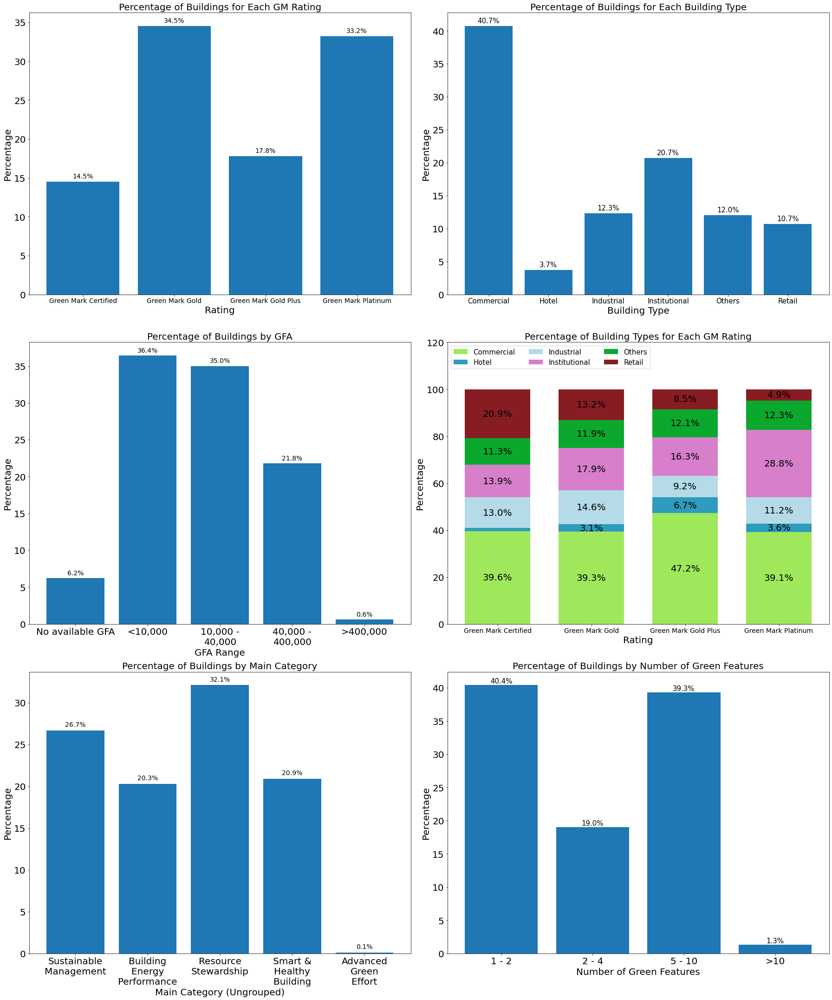

In [129]:
def multiplot():

    fig, axs = plt.subplots(3, 2)
    fig.set_size_inches(25, 30)

    # First Plot (% by rating)
    dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        dic[award] += 1

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    axs[0,0].bar(x_axis, y_vals)   

    axs[0,0].set_title("Percentage of Buildings for Each GM Rating", fontsize=20)
    print("Percentage of Buildings for Each GM Rating")
    axs[0,0].set_xlabel("Rating", fontsize=f_size)
    axs[0,0].set_ylabel("Percentage", fontsize=f_size)
    axs[0,0].tick_params(axis='x', which='major', labelsize=14)
    axs[0,0].tick_params(axis='y', which='major', labelsize=20)

    for i in range(len(x_axis)):
        axs[0,0].text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center")

    # Second Plot (% by bdg type)
    dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
    for _,row in data.iterrows():
        bdg_type = row['building_use']
        dic[bdg_type] += 1

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    axs[0,1].bar(x_axis, y_vals)   
    axs[0,1].set_title(f"Percentage of Buildings for Each Building Type", fontsize=20)
    print(f"Percentage of Buildings for Each Building Type")
    axs[0,1].set_xlabel("Building Type", fontsize=f_size)
    axs[0,1].set_ylabel("Percentage", fontsize=f_size)
    axs[0,1].tick_params(axis='x', which='major', labelsize=15)
    axs[0,1].tick_params(axis='y', which='major', labelsize=20)

    for i in range(len(x_axis)):
        axs[0,1].text(x_axis[i], y_vals[i]+0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

    # Third Plot (% by GFA)
    dic = {}
    for _,row in temp_data.iterrows():
        if row['gfa_range'] not in dic:
            dic[row['gfa_range']] = 0
        dic[row['gfa_range']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[1,0].text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center")

    labels=['No available GFA', '<10,000', '10,000 -\n40,000', '40,000 -\n400,000', '>400,000']
    axs[1,0].set_xticklabels(labels)

    axs[1,0].set_title("Percentage of Buildings by GFA", fontsize=20)
    print("Percentage of Buildings by GFA")
    axs[1,0].set_xlabel("GFA Range", fontsize=f_size)
    axs[1,0].set_ylabel("Percentage", fontsize=f_size)
    axs[1,0].tick_params(axis='x', which='major', labelsize=20)
    axs[1,0].tick_params(axis='y', which='major', labelsize=20)

    axs[1,0].bar(x_axis, y_vals)

    # Fourth Plot (new vs recertified bdgs over the years)
    interested_data = rating_use

    axs[1,1].set_title("Percentage of Building Types for Each GM Rating", fontsize=20)
    print("Percentage of Building Types for Each GM Rating")
    axs[1,1].set_xlabel("Rating", fontsize=f_size)
    axs[1,1].set_ylabel("Percentage", fontsize=f_size)
    axs[1,1].set_ylim(top=120)
    axs[1,1].tick_params(axis='x', which='major', labelsize=14)
    axs[1,1].tick_params(axis='y', which='major', labelsize=20)

    x_axis = list(interested_data.keys())

    use_names = bdg_use_names

    bottom = [0] * len(interested_data.keys())

    for i in use_names:
        y_vals = []
        for y in interested_data:
            total = sum(interested_data[y].values())
            value = interested_data[y][i]/total*100
            y_vals.append(value)
        axs[1,1].bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                axs[1,1].text(x_axis[i], bottom[i] - y_vals[i]/2, f"{round(y_vals[i], 1)}%", fontsize=f_size, ha="center", va="center")

    ncol = len(interested_data[list(interested_data.keys())[0]])
    axs[1,1].legend(loc="upper left", ncol=3, fontsize=15)


    # Fifth Plot (% by main cat ungrouped)
    dic = main_cat_ungrouped_dict

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[2,0].text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=14), ha="center", va="center")

    axs[2,0].set_title("Percentage of Buildings by Main Category", fontsize=20)
    axs[2,0].set_xlabel("Main Category (Ungrouped)", fontsize=f_size)
    axs[2,0].set_ylabel("Percentage", fontsize=f_size)
    print("Percentage of Buildings by Main Category (Ungrouped)")

    axs[2,0].tick_params(axis='both', which='major', labelsize=20)
    axs[2,0].bar(x_axis, y_vals)
    labels=['Sustainable\nManagement', 'Building\nEnergy\nPerformance', 'Resource\nStewardship', 'Smart &\nHealthy\nBuilding', 'Advanced\nGreen\nEffort']
    axs[2,0].set_xticklabels(labels)

    # Sixth Plot (No. of green features)
    dic = {}
    for _,row in temp_data.iterrows():
        if row['no_of_green_features'] not in dic:
            dic[row['no_of_green_features']] = 0
        dic[row['no_of_green_features']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        axs[2,1].text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=15), ha="center")

    axs[2,1].set_xlabel("Number of Green Features", fontsize=f_size)
    axs[2,1].set_ylabel("Percentage", fontsize=f_size)
    labels=['1 - 2', '2 - 4', '5 - 10', '>10']
    axs[2,1].set_xticklabels(labels)

    axs[2,1].set_title("Percentage of Buildings by Number of Green Features", fontsize=20)
    print("Percentage of Buildings by GFA")

    axs[2,1].tick_params(axis='both', which='major', labelsize=20)

    plt.bar(x_axis, y_vals)
    
    plt.tight_layout()
    
    plt.savefig('multiplot.pdf')

    
multiplot()

In [183]:
axis_size = 60 # font size for axis ticks
legend_size = 65
bar_numbers_size = 60 # font size for numbers on top of bars

def multiplot_1():

    fig, ax= plt.subplots()
    fig.set_size_inches(25, 25)

    # First Plot (% by rating)
    dic = {"Green Mark Certified": 0, "Green Mark Gold": 0, "Green Mark Gold Plus": 0, "Green Mark Platinum": 0}
    for _,row in data.iterrows():
        award = award_level(row['award'])
        dic[award] += 1

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    ax.bar(x_axis, y_vals)   

#     ax.set_title("Percentage of Buildings for Each GM Rating", fontsize=20)
    print("Percentage of Buildings for Each GM Rating")
#     ax.set_xlabel("\nRating", fontsize=60)
#     ax.set_ylabel("Percentage (%)\n", fontsize=60)
    ax.tick_params(axis='x', which='major', labelsize=axis_size)
    ax.tick_params(axis='y', which='major', labelsize=axis_size)

    for i in range(len(x_axis)):
        ax.text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=bar_numbers_size), ha="center", va="center")
        
    labels=['Certified', 'Gold', 'Gold Plus', 'Platinum']
    ax.set_xticklabels(labels)
    
    plt.tight_layout()
    plt.ylim(top=43)
    plt.savefig('percentage_of_bdgs_for_each_gm_rating.pdf')

def multiplot_2():
    fig, ax = plt.subplots()
    fig.set_size_inches(25, 25)
    dic = {"Commercial": 0, "Hotel": 0, "Industrial": 0, "Institutional": 0, "Others": 0, "Retail": 0}
    for _,row in data.iterrows():
        bdg_type = row['building_use']
        dic[bdg_type] += 1
        
    dic = dict(sorted(dic.items(), key=lambda x: x[1], reverse=True))

    total = sum(dic.values())
    y_vals = list(map(lambda x: round(x/total*100, 1), dic.values()))
    x_axis = list(dic.keys())

    ax.bar(x_axis, y_vals)   
#     ax.set_title(f"Percentage of Buildings for Each Building Type", fontsize=20)
    print(f"Percentage of Buildings for Each Building Type")
#     ax.set_xlabel("\nPrimary Space Usage Type", fontsize=60)
    ax.set_ylabel("Percentage (%)\n", fontsize=60)
    ax.tick_params(axis='x', which='major', labelsize=axis_size, rotation=90)
    ax.tick_params(axis='y', which='major', labelsize=axis_size)

    for i in range(len(x_axis)):
        ax.text(x_axis[i], y_vals[i]+0.5, f"{y_vals[i]}%", fontdict=dict(fontsize=bar_numbers_size), ha="center")
        
    plt.xticks(ha='right')
    
    plt.ylim(top=43)
    
    plt.tight_layout()
    plt.savefig('percentage_of_bdgs_for_each_bdg_type.pdf')
        
        
def multiplot_3():
    fig, ax = plt.subplots()
    fig.set_size_inches(25, 25)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['gfa_range'] not in dic:
            dic[row['gfa_range']] = 0
        dic[row['gfa_range']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        ax.text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=bar_numbers_size), ha="center", va="center")

    labels=['No\navailable\nGFA', '<10,000', '10,000 -\n40,000', '40,000 -\n400,000', '>400,000']
    ax.set_xticklabels(labels)

#     ax.set_title("Percentage of Buildings by GFA", fontsize=20)
    print("Percentage of Buildings by GFA")
#     ax.set_xlabel("\nGFA Range (m )", fontsize=60)
    ax.set_ylabel("Percentage (%)\n", fontsize=60)
    ax.tick_params(axis='x', which='major', labelsize=axis_size)
    ax.tick_params(axis='y', which='major', labelsize=axis_size)

    ax.bar(x_axis, y_vals)
    
    plt.ylim(top=43)
    
    plt.tight_layout()
    plt.savefig('percentage_of_bdgs_by_gfa.pdf')
    
def multiplot_4():
    fig, ax = plt.subplots()
    fig.set_size_inches(25, 25)
    
    interested_data = rating_use

#     ax.set_title("Percentage of Building Types for Each GM Rating", fontsize=20)
    print("Percentage of Building Types for Each GM Rating")
#     ax.set_xlabel("\nRating", fontsize=60)
#     ax.set_ylabel("Percentage (%)\n", fontsize=60)
    ax.set_ylim(top=130)
    ax.tick_params(axis='x', which='major', labelsize=axis_size)
    ax.tick_params(axis='y', which='major', labelsize=axis_size)

    x_axis = list(interested_data.keys())

    use_names = bdg_use_names

    bottom = [0] * len(interested_data.keys())

    for i in use_names:
        y_vals = []
        for y in interested_data:
            total = sum(interested_data[y].values())
            value = interested_data[y][i]/total*100
            y_vals.append(value)
        ax.bar(x_axis, y_vals, bottom=bottom, label=i, width=0.7, color=use_colours[i])
        bottom = list(map(lambda x,y: x+y, bottom, y_vals))
        for i in range(len(y_vals)):
            if round(y_vals[i]) > 1:
                ax.text(x_axis[i], bottom[i] - y_vals[i]/2, f"{round(y_vals[i], 1)}%", fontsize=bar_numbers_size, ha="center", va="center")

    ncol = len(interested_data[list(interested_data.keys())[0]])
    ax.legend(loc="upper left", ncol=2, fontsize=legend_size)
    
    labels=['Certified', 'Gold', 'Gold Plus', 'Platinum']
    ax.set_xticklabels(labels)
    
    plt.tight_layout()
    plt.savefig('percentage_of_bdg_types_for_each_gm_rating.pdf')
    
def multiplot_5():
    fig, ax = plt.subplots()
    fig.set_size_inches(25, 25)
    
    dic = main_cat_ungrouped_dict

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)
        
    # order the dictionary by descending order
    dic_percent = dict(sorted(dic_percent.items(), key=lambda x: x[1], reverse=True))

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        ax.text(x_axis[i], y_vals[i]+0.7, f"{y_vals[i]}%", fontdict=dict(fontsize=bar_numbers_size), ha="center", va="center")

#     ax.set_title("Percentage of Buildings by Main Category", fontsize=20)
#     ax.set_xlabel("\nGreen Feature Category", fontsize=60)
#     ax.set_ylabel("Percentage (%)\n", fontsize=60)
    print("Percentage of Buildings by Main Category (Ungrouped)")

    ax.tick_params(axis='both', which='major', labelsize=axis_size)
    ax.bar(x_axis, y_vals)
    labels=['Resource\nStewardship', 'Sustainable\nManagement', 'Smart &\nHealthy\nBuilding', 'Building\nEnergy\nPerformance', 'Advanced\nGreen\nEffort']
    ax.set_xticklabels(labels, rotation=90)
    
    plt.ylim(top=43)
    
    plt.tight_layout()
    plt.savefig('percentage_of_bdgs_by_main_cat.pdf')
    
def multiplot_6():
    fig, ax = plt.subplots()
    fig.set_size_inches(25, 25)
    
    dic = {}
    for _,row in temp_data.iterrows():
        if row['no_of_green_features'] not in dic:
            dic[row['no_of_green_features']] = 0
        dic[row['no_of_green_features']] += 1
    dic = dict(sorted(dic.items()))

    dic_percent = {}
    total = sum(dic.values())
    for k, v in dic.items():
        dic_percent[k] = round(v/total*100, 1)

    x_axis = list(dic_percent.keys())
    y_vals = list(dic_percent.values())

    for i in range(len(x_axis)):
        ax.text(x_axis[i], y_vals[i]+0.3, f"{y_vals[i]}%", fontdict=dict(fontsize=bar_numbers_size), ha="center")

#     ax.set_xlabel("\nNumber of Green Features", fontsize=60)
#     ax.set_ylabel("Percentage (%)\n", fontsize=60)
    labels=['1 - 2', '2 - 4', '5 - 10', '>10']
    ax.set_xticklabels(labels)

#     ax.set_title("Percentage of Buildings by Number of Green Features", fontsize=20)
    print("Percentage of Buildings by GFA")

    ax.tick_params(axis='both', which='major', labelsize=axis_size)
    
    plt.ylim(top=43)

    plt.bar(x_axis, y_vals)
    
    plt.tight_layout()
    plt.savefig('percentage_of_bdgs_by_no_of_green_features.pdf')



Percentage of Buildings for Each GM Rating


<ipython-input-183-9c79fce109b1>:33: UserWarning:

FixedFormatter should only be used together with FixedLocator



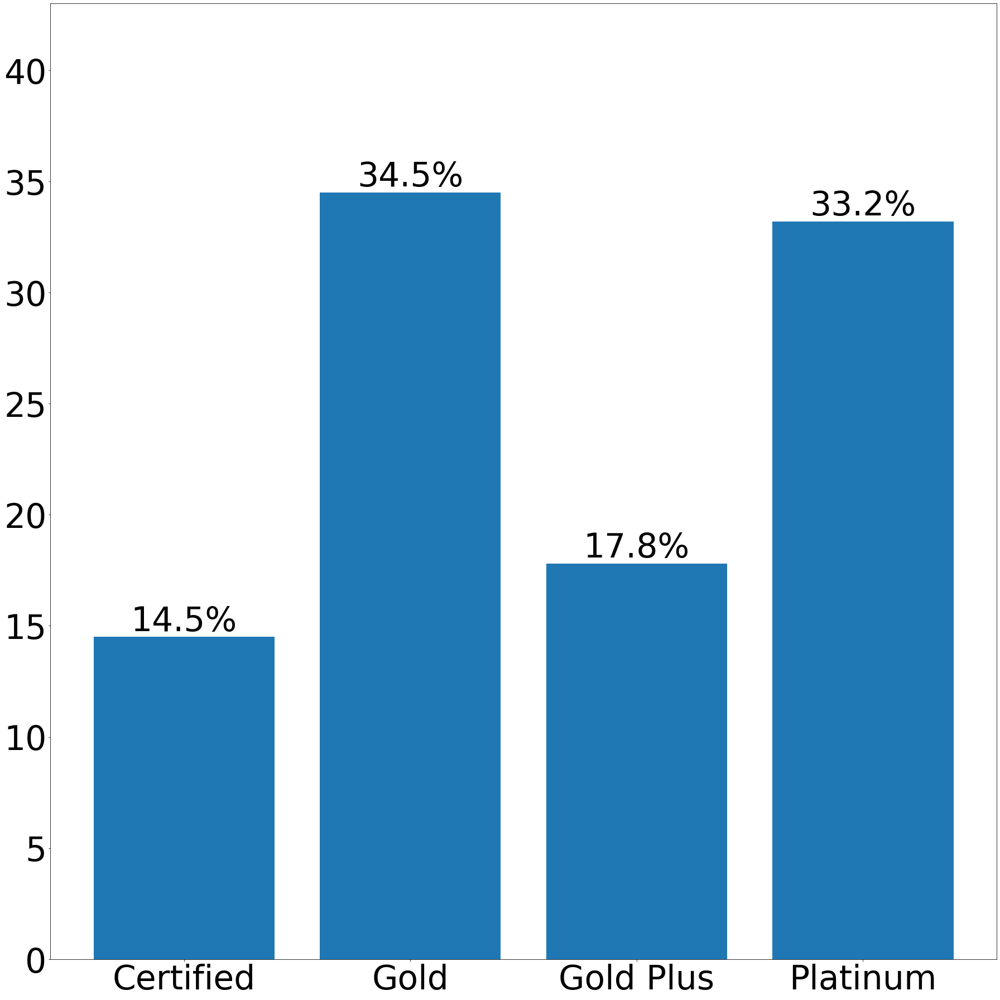

In [184]:
multiplot_1()

Percentage of Buildings for Each Building Type


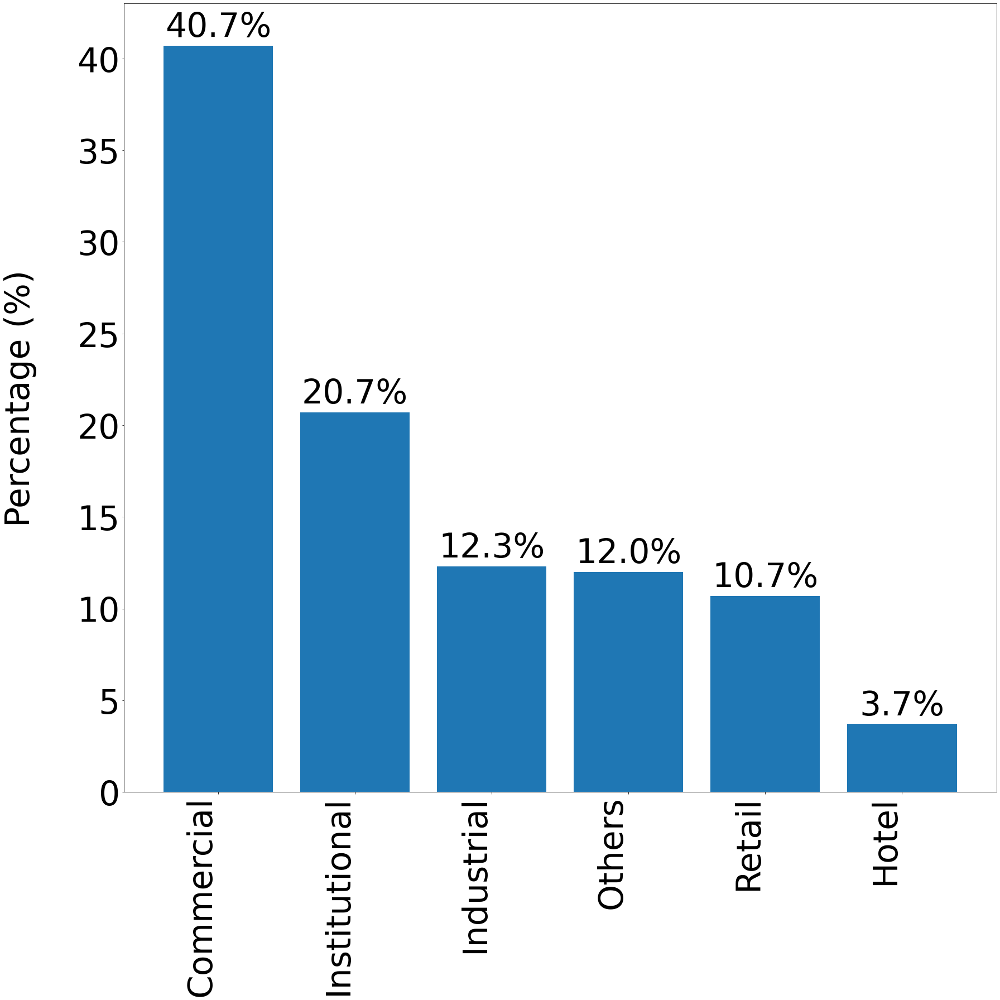

In [185]:
multiplot_2()

<ipython-input-183-9c79fce109b1>:95: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA


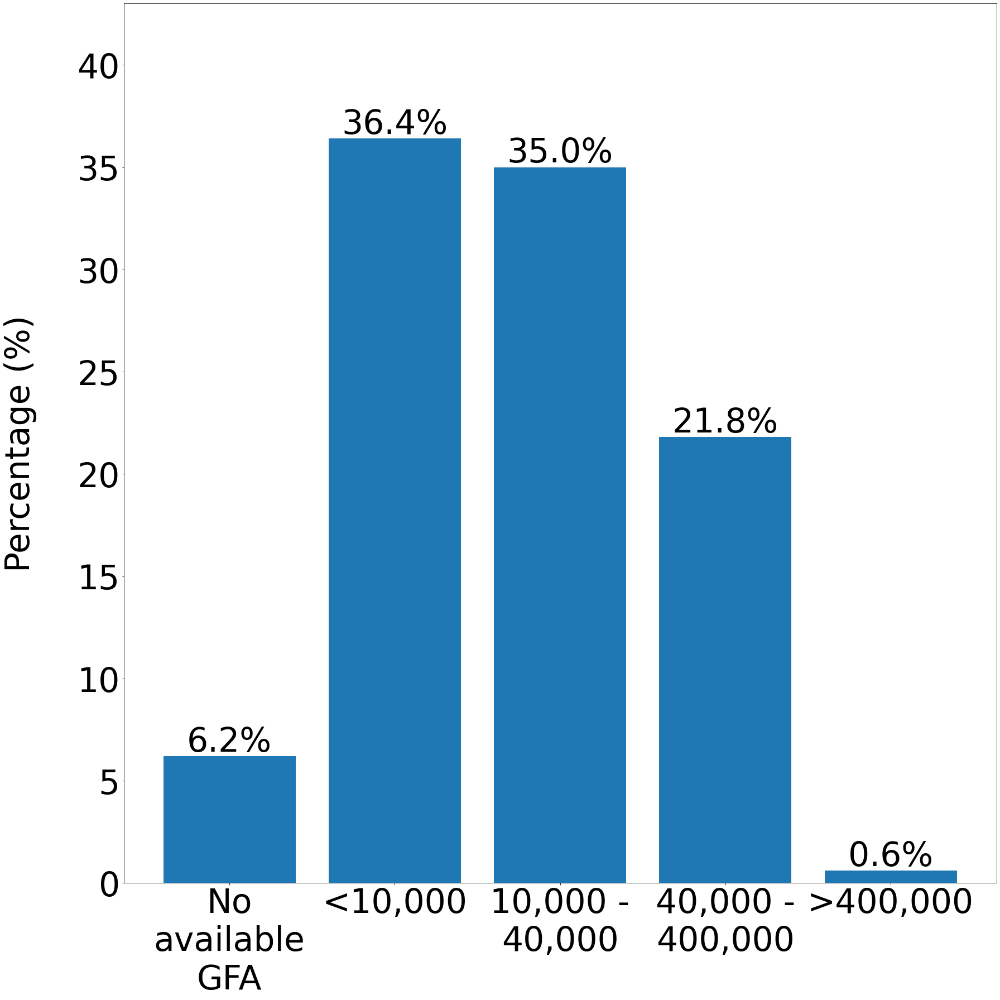

In [186]:
multiplot_3()

Percentage of Building Types for Each GM Rating


<ipython-input-183-9c79fce109b1>:147: UserWarning:

FixedFormatter should only be used together with FixedLocator



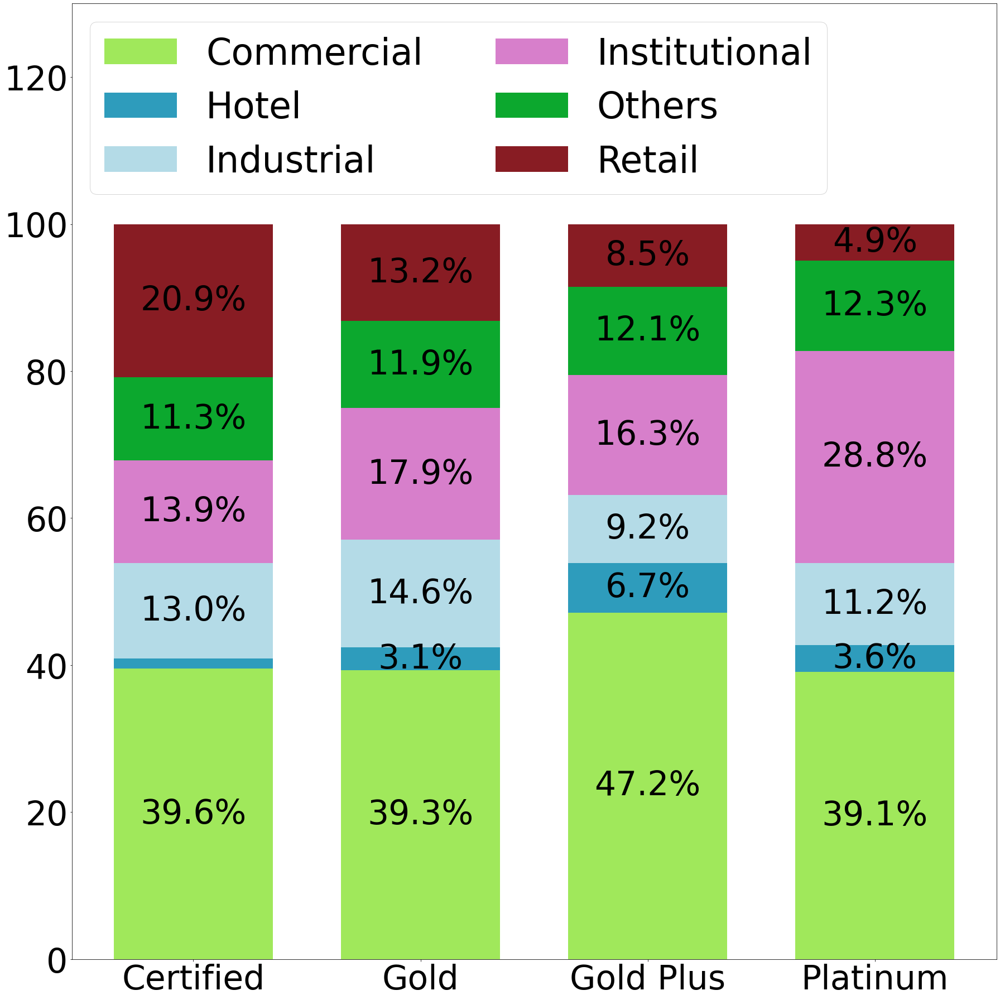

In [187]:
multiplot_4()

Percentage of Buildings by Main Category (Ungrouped)


<ipython-input-183-9c79fce109b1>:180: UserWarning:

FixedFormatter should only be used together with FixedLocator



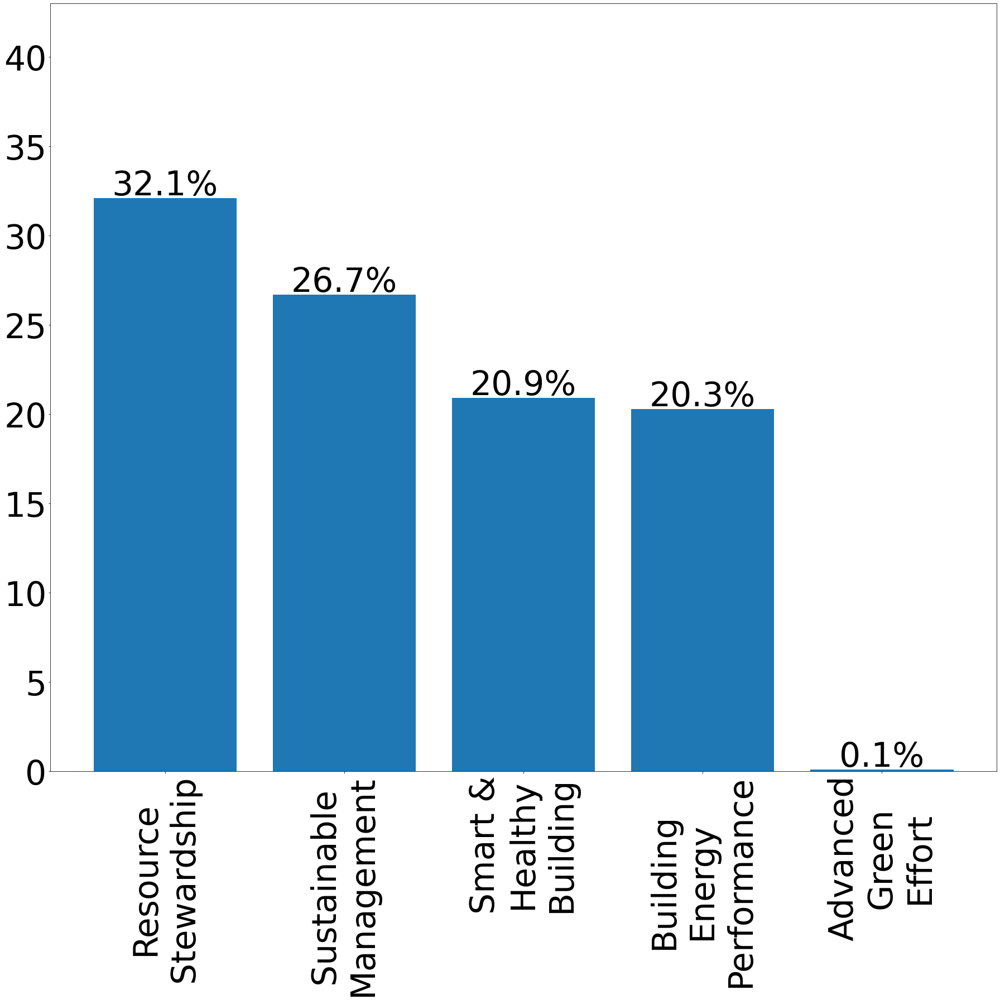

In [188]:
multiplot_5()

<ipython-input-183-9c79fce109b1>:212: UserWarning:

FixedFormatter should only be used together with FixedLocator



Percentage of Buildings by GFA


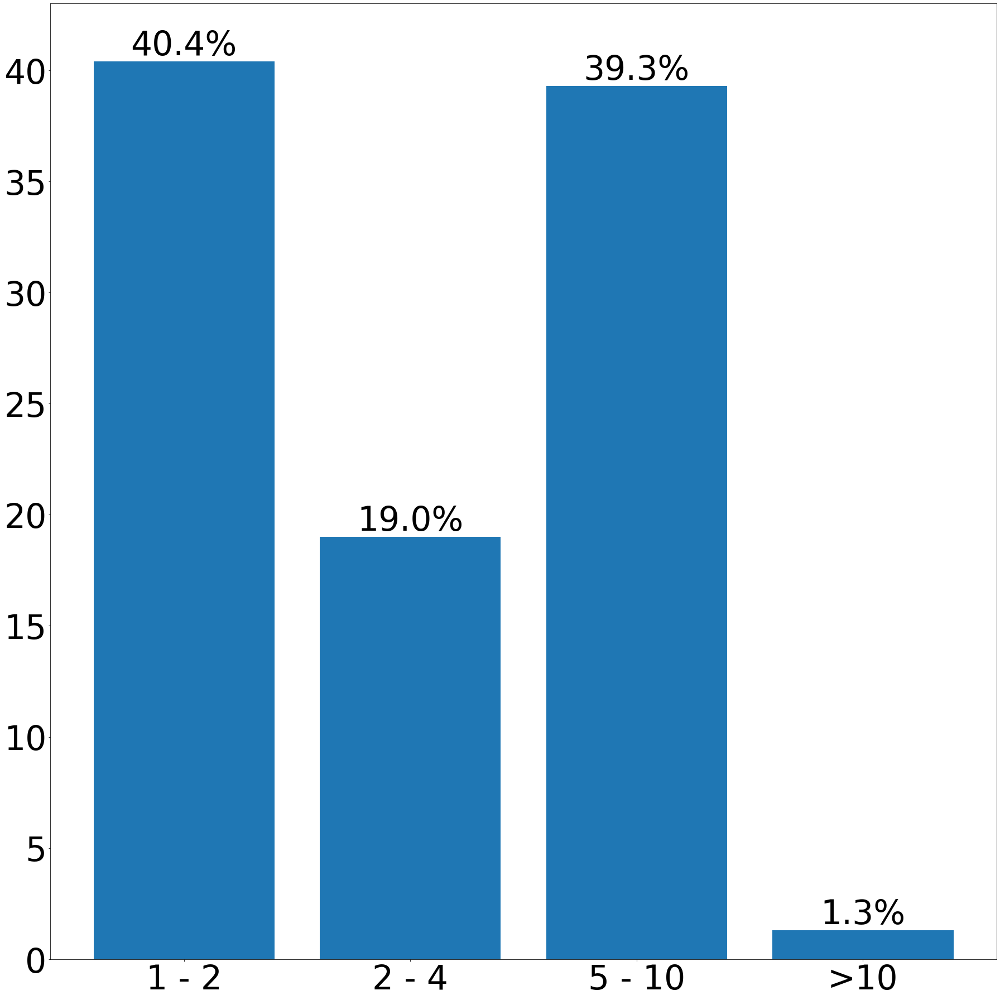

In [189]:
multiplot_6()